Using device: mps
Selected Basins: ['603_Celadenka', '109_Blanice']

Training Basin 1: 603_Celadenka
Total days with temperatures below zero (potential snow days) for 603_Celadenka: 2315

603_Celadenka - Basic Statistical Analysis on Unscaled Data:
Mean Temperature (T): 8.16511119781506
Mean Precipitation (P): 2.681599687865782
Mean Discharge (Q): 2.355688958252048
Temperature Standard Deviation (T): 8.450807677334353
Precipitation Standard Deviation (P): 6.848455245852255
Discharge Standard Deviation (Q): 3.8259890684597404
Discharge Quantiles (Q):
0.25    0.641
0.50    1.282
0.75    2.676
Name: Q, dtype: float64
Training LSTM Model for Basin 603_Celadenka


LSTM Training Progress:   0%|          | 0/1 [00:00<?, ?it/s]

Training Transformer Model for Basin 603_Celadenka


Transformer Training Progress:   0%|          | 0/1 [00:00<?, ?it/s]

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
603_Celadenka - LSTM Train NSE: 0.598, Transformer Train NSE: 0.090
603_Celadenka - LSTM Test NSE: 0.546, Transformer Test NSE: 0.083

Total days with temperatures below zero (potential snow days): 1886


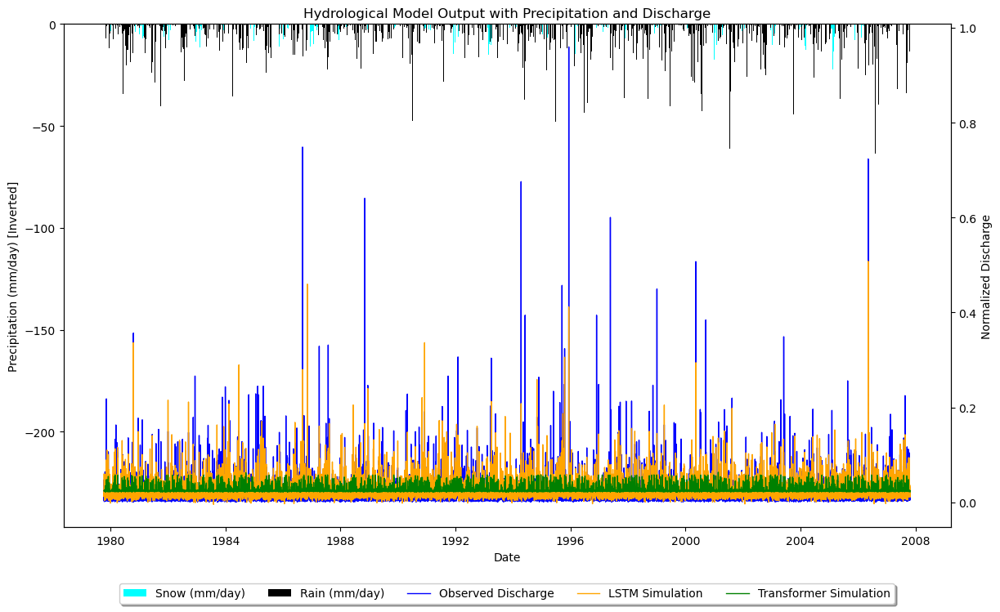

Total days with temperatures below zero (potential snow days): 0


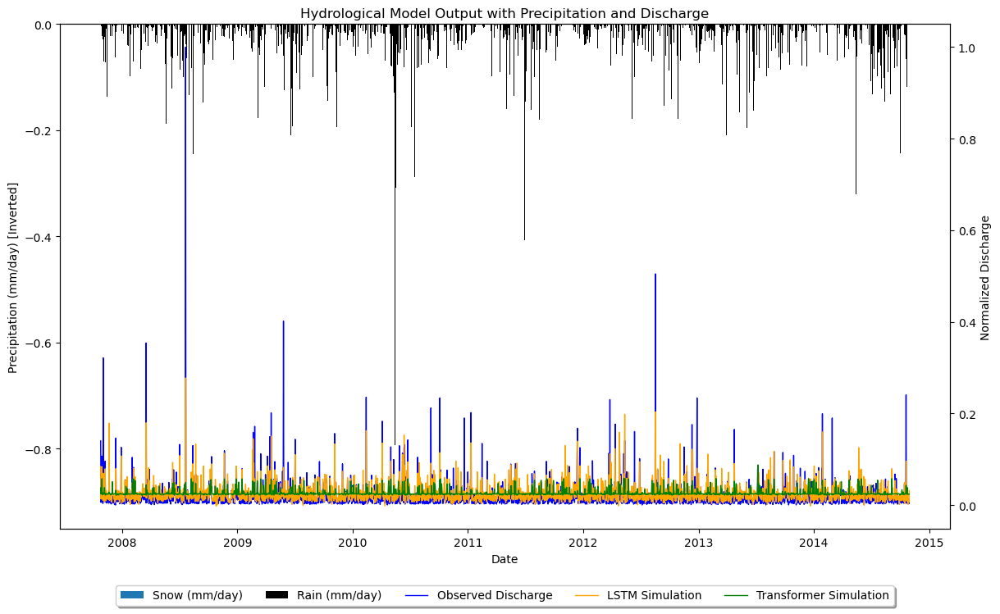


Training Basin 2: 109_Blanice
Total days with temperatures below zero (potential snow days) for 109_Blanice: 2294

109_Blanice - Basic Statistical Analysis on Unscaled Data:
Mean Temperature (T): 7.74787218210519
Mean Precipitation (P): 1.8153726102223957
Mean Discharge (Q): 0.8252644557159577
Temperature Standard Deviation (T): 8.073430757645605
Precipitation Standard Deviation (P): 4.847919971195846
Discharge Standard Deviation (Q): 1.183389587884291
Discharge Quantiles (Q):
0.25    0.331
0.50    0.507
0.75    0.912
Name: Q, dtype: float64
Training LSTM Model for Basin 109_Blanice


LSTM Training Progress:   0%|          | 0/1 [00:00<?, ?it/s]

Training Transformer Model for Basin 109_Blanice


Transformer Training Progress:   0%|          | 0/1 [00:00<?, ?it/s]

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
109_Blanice - LSTM Train NSE: 0.589, Transformer Train NSE: 0.158
109_Blanice - LSTM Test NSE: 0.568, Transformer Test NSE: 0.109

Total days with temperatures below zero (potential snow days): 1849


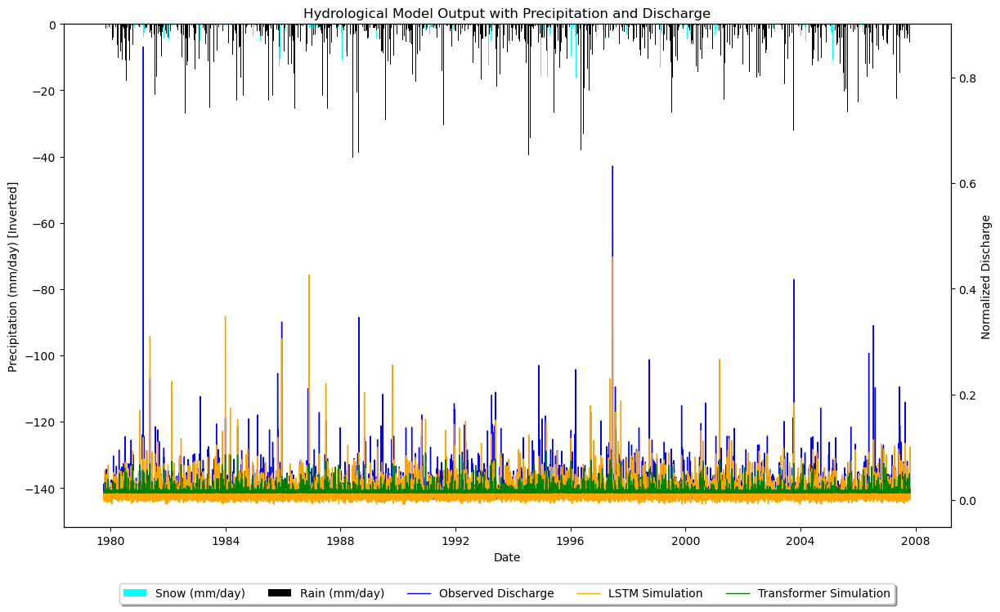

Total days with temperatures below zero (potential snow days): 0


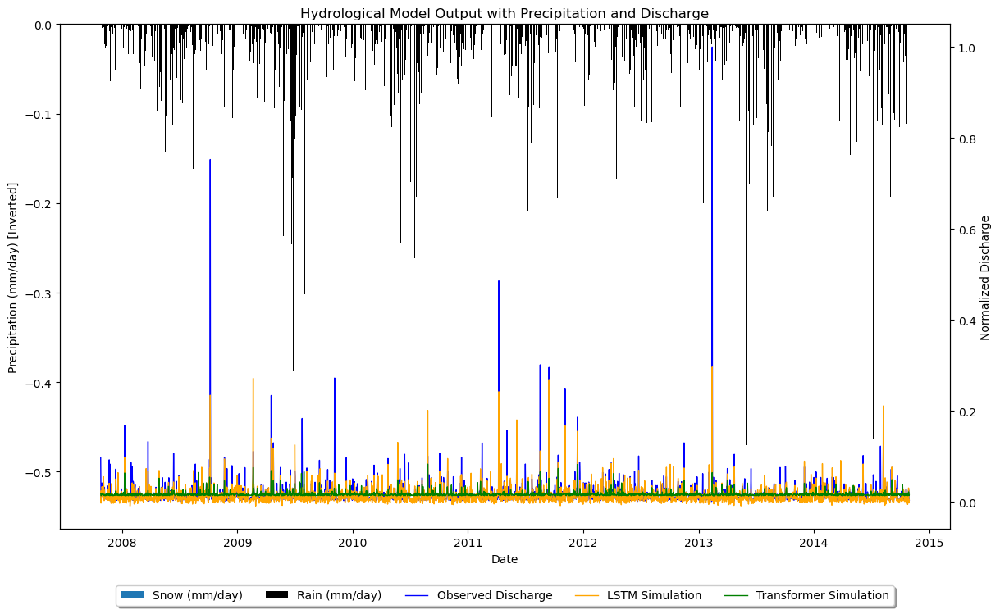

In [43]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, MultiHeadAttention, LayerNormalization, Dropout, GlobalAveragePooling1D
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import torch
from tqdm.auto import tqdm
import warnings

# Ignoring warnings
warnings.filterwarnings('ignore')

# Setting the device for PyTorch
DEVICE = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f'Using device: {DEVICE}')

# Loading and concatenating CSV files into a DataFrame
data_dir = '/Users/doudou.ba/Downloads/dbstream'
csv_files = [os.path.join(data_dir, file) for file in os.listdir(data_dir) if file.endswith('.csv')]
basin_dataframes = []

for file_path in csv_files:
    df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')
    basin_dataframes.append(df)

data = pd.concat(basin_dataframes, axis=0)

# Randomly selecting five basins for analysis
basins = data['Basin'].unique()
selected_basins = random.sample(list(basins), 2)
print(f"Selected Basins: {selected_basins}")

epoch_num=1

def plot_results(basin_data, dates, observed, lstm_pred, transformer_pred):
    # Create figure and subplots
    fig, ax1 = plt.subplots(figsize=(14, 8))

    # Determine snow based on minimum temperature
    tmin = basin_data['T'].values
    rain = basin_data['P'].values
    snow_days = tmin < 0
    print(f"Total days with temperatures below zero (potential snow days): {snow_days.sum()}")

    # Adjust rain and snow based on temperature
    adjusted_snow = np.where(snow_days, rain, 0)  # If tmin < 0, consider it as snow
    adjusted_rain = np.where(~snow_days, rain, 0)  # Only rain if tmin >= 0

    # Plotting adjusted precipitation
    ax1.bar(dates[snow_days], -adjusted_snow[snow_days], width=2, color='cyan', label='Snow (mm/day)')
    ax1.bar(dates[~snow_days], -adjusted_rain[~snow_days], width=2, color='black', label='Rain (mm/day)')
    ax1.set_ylabel('Precipitation (mm/day) [Inverted]')
    ax1.set_xlabel('Date')
    ax1.set_ylim(-max(rain.max(), adjusted_snow.max()) * 1.2, 0)

    # Discharge/streamflow plot on secondary axis
    ax2 = ax1.twinx()
    ax2.plot(dates, observed, 'b-', linewidth=1, label='Observed Discharge')
    ax2.plot(dates, lstm_pred, 'orange', linewidth=1, label='LSTM Simulation')
    ax2.plot(dates, transformer_pred, 'green', linewidth=1, label='Transformer Simulation')
    ax2.set_ylabel('Normalized Discharge')

    # Legend and title
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=5)
    plt.xticks(rotation=45)
    plt.title('Hydrological Model Output with Precipitation and Discharge')
    plt.show()


# Training and evaluating for each selected basin
for i, selected_basin in enumerate(selected_basins):
    print(f"\nTraining Basin {i+1}: {selected_basin}")

    # Extracting basin-specific data and performing unscaled analysis
    basin_unscaled_data = data[data['Basin'] == selected_basin].copy()

    # Determining snow days using UNSCALED temperature data
    snow_days_unscaled = basin_unscaled_data['T'] < 0
    print(f"Total days with temperatures below zero (potential snow days) for {selected_basin}: {snow_days_unscaled.sum()}")

    # Basic Statistical Analysis on Unscaled Data
    print(f"\n{selected_basin} - Basic Statistical Analysis on Unscaled Data:")
    print(f"Mean Temperature (T): {basin_unscaled_data['T'].mean()}")
    print(f"Mean Precipitation (P): {basin_unscaled_data['P'].mean()}")
    print(f"Mean Discharge (Q): {basin_unscaled_data['Q'].mean()}")
    print(f"Temperature Standard Deviation (T): {basin_unscaled_data['T'].std()}")
    print(f"Precipitation Standard Deviation (P): {basin_unscaled_data['P'].std()}")
    print(f"Discharge Standard Deviation (Q): {basin_unscaled_data['Q'].std()}")
    print(f"Discharge Quantiles (Q):")
    print(basin_unscaled_data['Q'].quantile([0.25, 0.5, 0.75]))


    basin_data = data[data['Basin'] == selected_basin].copy()
    scaler = MinMaxScaler()
    features = ['P', 'T', 'Q']
    basin_data[features] = scaler.fit_transform(basin_data[features])

    seq_length = 7
    X, y = [], []
    for i in range(seq_length, len(basin_data)):
        X.append(basin_data.iloc[i - seq_length:i][features].values)
        y.append(basin_data.iloc[i]['Q'])
    X, y = np.array(X), np.array(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Defining and training LSTM model
    print(f"Training LSTM Model for Basin {selected_basin}")
    lstm_model = Sequential([
        LSTM(64, activation='relu', input_shape=(seq_length, len(features))),
        Dense(1)
    ])
    lstm_model.compile(optimizer='adam', loss='mse')
    for epoch in tqdm(range(epoch_num), desc='LSTM Training Progress'):
        lstm_model.fit(X_train, y_train, epochs=epoch_num, batch_size=32, verbose=0)

    # Defining and training Transformer model
    print(f"Training Transformer Model for Basin {selected_basin}")
    input_layer = Input(shape=(seq_length, len(features)))
    x = LayerNormalization(epsilon=1e-6)(input_layer)
    x = MultiHeadAttention(num_heads=2, key_dim=seq_length)(x, x, x)
    x = Dropout(0.1)(x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    output_layer = Dense(1)(x)

    transformer_model = Model(inputs=input_layer, outputs=output_layer)
    transformer_model.compile(optimizer='adam', loss='mse')
    for epoch in tqdm(range(epoch_num), desc='Transformer Training Progress'):
        transformer_model.fit(X_train, y_train, epochs=epoch_num, batch_size=32, verbose=0)

    # Evaluation on Training Set
    lstm_preds_train = lstm_model.predict(X_train)
    transformer_preds_train = transformer_model.predict(X_train)
    lstm_nse_train = 1 - np.sum((y_train - lstm_preds_train.flatten()) ** 2) / np.sum((y_train - np.mean(y_train)) ** 2)
    transformer_nse_train = 1 - np.sum((y_train - transformer_preds_train.flatten()) ** 2) / np.sum((y_train - np.mean(y_train)) ** 2)

    # Evaluation on Test Set
    lstm_preds_test = lstm_model.predict(X_test)
    transformer_preds_test = transformer_model.predict(X_test)
    lstm_nse_test = 1 - np.sum((y_test - lstm_preds_test.flatten()) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)
    transformer_nse_test = 1 - np.sum((y_test - transformer_preds_test.flatten()) ** 2) / np.sum((y_test - np.mean(y_test)) ** 2)

    # # Training and Test Results Plot
    # date_range_train = pd.date_range(start=basin_data.index[seq_length], periods=len(X_train), freq='D')
    # plt.figure(figsize=(12, 6))
    # plt.plot(date_range_train, y_train, label='Observation - Training')
    # plt.plot(date_range_train, lstm_preds_train.flatten(), label=f'LSTM Prediction - Training ({selected_basin})')
    # plt.plot(date_range_train, transformer_preds_train.flatten(), label=f'Transformer Prediction - Training ({selected_basin})')
    # plt.title(f'Training Performance for {selected_basin}')
    # plt.xlabel("Date")
    # plt.ylabel("Normalized Discharge")
    # plt.legend()
    # plt.show()

    # date_range_test = pd.date_range(start=basin_data.index[len(X_train) + seq_length], periods=len(X_test), freq='D')
    # plt.figure(figsize=(12, 6))
    # plt.plot(date_range_test, y_test, label='Observation - Test')
    # plt.plot(date_range_test, lstm_preds_test.flatten(), label=f'LSTM Prediction - Test ({selected_basin})')
    # plt.plot(date_range_test, transformer_preds_test.flatten(), label=f'Transformer Prediction - Test ({selected_basin})')
    # plt.title(f'Test Performance for {selected_basin}')
    # plt.xlabel("Date")
    # plt.ylabel("Normalized Discharge")
    # plt.legend()
    # plt.show()


    # Generate date ranges for the plots
    train_dates = pd.date_range(start=basin_data.index[seq_length], periods=len(X_train), freq='D')
    test_dates = pd.date_range(start=basin_data.index[len(X_train) + seq_length - 1], periods=len(X_test), freq='D')
     # Print NSE scores
    print(f'{selected_basin} - LSTM Train NSE: {lstm_nse_train:.3f}, Transformer Train NSE: {transformer_nse_train:.3f}')
    print(f'{selected_basin} - LSTM Test NSE: {lstm_nse_test:.3f}, Transformer Test NSE: {transformer_nse_test:.3f}\n')

    # Call plot_results for training results visualization
    plot_results(
        basin_unscaled_data.iloc[seq_length - 1: seq_length - 1 + len(X_train)], 
        train_dates, 
        y_train, 
        lstm_preds_train.flatten(), 
        transformer_preds_train.flatten()
    )

    # Call plot_results for test results visualization
    plot_results(
        basin_data.iloc[len(X_train) + seq_length - 1: len(X_train) + seq_length - 1 + len(X_test)], 
        test_dates, 
        y_test, 
        lstm_preds_test.flatten(), 
        transformer_preds_test.flatten()
    )


In [8]:
print(basin_unscaled_data['T'].unique())

[ 7.40000000e+00  5.10000000e+00  3.20000000e+00  6.50000000e+00
  8.90000000e+00  6.00000000e+00  6.70000000e+00  6.10000000e+00
  5.70000000e+00  5.40000000e+00  6.30000000e+00  9.50000000e+00
  1.05000000e+01  1.00000000e+01  1.20000000e+01  1.27000000e+01
  1.18000000e+01  8.30000000e+00  5.00000000e+00  6.40000000e+00
  5.30000000e+00  2.00000000e+00  1.10000000e+00  1.40000000e+00
  7.00000000e-01 -2.00000000e-01  1.00000000e-01  2.30000000e+00
  4.80000000e+00  3.50000000e+00  4.40000000e+00  3.90000000e+00
  1.30000000e+00  5.80000000e+00  4.70000000e+00  6.90000000e+00
  7.20000000e+00  3.00000000e+00 -3.00000000e-01 -7.00000000e-01
  2.80000000e+00  5.00000000e-01  2.40000000e+00  8.00000000e-01
  9.00000000e-01  6.00000000e-01 -1.70000000e+00 -1.40000000e+00
 -2.10000000e+00  4.20000000e+00  8.40000000e+00  7.00000000e+00
  9.00000000e+00  5.20000000e+00  1.17000000e+01  9.10000000e+00
  8.50000000e+00  6.80000000e+00  9.80000000e+00  7.60000000e+00
 -1.30000000e+00 -2.30000

In [9]:
print(basin_unscaled_data['T'] < 0)

Date
1979-10-01    False
1979-10-02    False
1979-10-03    False
1979-10-04    False
1979-10-05    False
              ...  
2014-10-27    False
2014-10-28    False
2014-10-29    False
2014-10-30    False
2014-10-31    False
Name: T, Length: 12815, dtype: bool


In [10]:
print(basin_unscaled_data[basin_unscaled_data['T'] < 0])

              P    T      Q        Basin
Date                                    
1979-10-27  0.0 -0.2  0.566  108_Blanice
1979-11-11  0.0 -0.3  1.223  108_Blanice
1979-11-12  0.0 -0.7  0.778  108_Blanice
1979-11-23  0.0 -1.7  0.909  108_Blanice
1979-11-24  1.1 -1.4  0.869  108_Blanice
...         ...  ...    ...          ...
2014-02-04  0.0 -3.5  0.384  108_Blanice
2014-02-05  0.0 -0.8  0.331  108_Blanice
2014-02-12  0.0 -1.7  0.283  108_Blanice
2014-02-25  0.0 -0.7  0.290  108_Blanice
2014-03-01  0.0 -0.4  0.266  108_Blanice

[2294 rows x 4 columns]


In [11]:
print(np.sum(basin_unscaled_data['T'] < 0))

2294


Using device: mps
Selected Basins: ['318_Metuje', '312_Modry_potok', '114_Weisser_Regen', '102_Otava', '512_Cerna_Opava', '603_Celadenka', '404_Divoka_Orlice', '511_Stribrny_potok', '604_Ostravice', '109_Blanice', '201_Rolava', '610_Ropicanka', '608_Mohelnice', '103_Hamersky_potok', '108_Blanice', '302_Cerna_Nisa', '101_Vydra', '311_Cista', '609_Slavic', '606_Skalka', '503_Moravice', '308_Jizerka', '301_Jerice', '611_Lesti', '403_Zdobnice', '107_Tepla_Vltava', '401_Bela', '110_Stassky_potok', '113_Schwarzach', '313_Upa', '513_Opava', '508_Telcsky_potok', '317_Kamenice', '314_Upa', '509_Morava', '106_Volynka', '310_Male_Labe', '203_Cerna', '305_Smeda', '502_Desna', '112_Studena_Vltava', '402_Knezna', '605_Moravka', '205_Natzschung', '506_Morava', '405_Ticha_Orlice', '111_Tepla_Vltava', '316_Cerna_Desna', '115_Sausswasser', '307_Mumlava']

Training Basin 1: 318_Metuje

318_Metuje - Basic Statistical Analysis:
Mean Temperature: 7.17689075630252
Mean Precipitation: 1.7773311734332289
Mean 

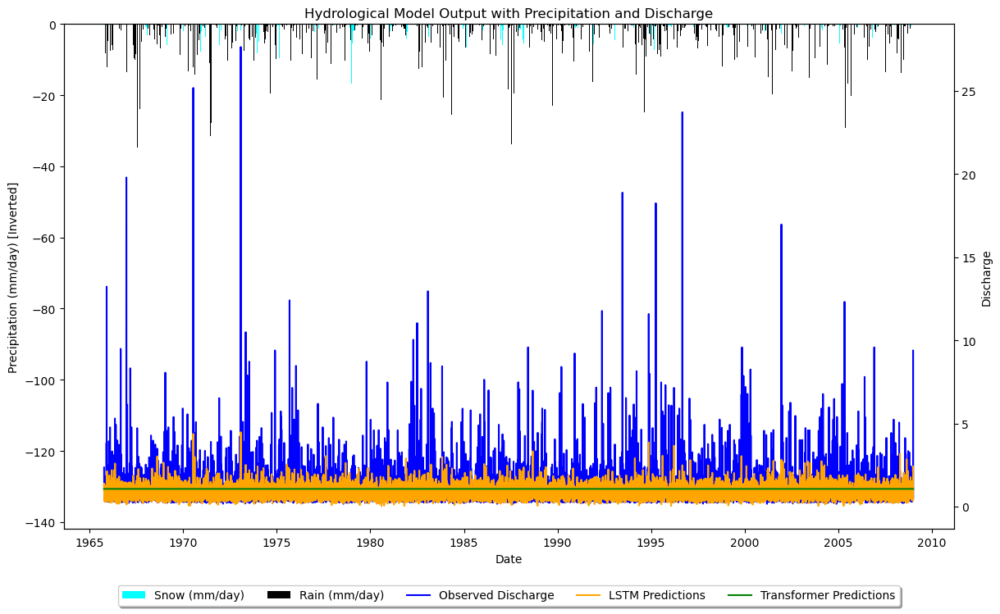

Total days with temperatures below zero (potential snow days): 612


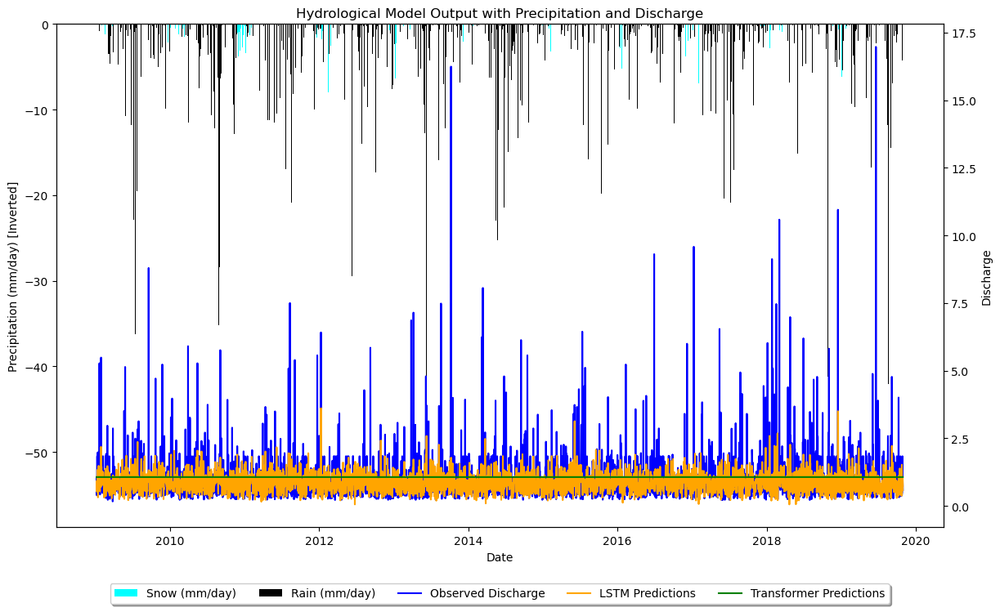


Training Basin 2: 312_Modry_potok

312_Modry_potok - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.595333593445181
Mean Discharge: 4.940355006735968
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.999927651016609
Discharge Standard Deviation: 6.330897104644125
Discharge Quantiles: 0.25    1.761
0.50    2.758
0.75    5.250
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
312_Modry_potok - LSTM Train NSE: 0.085
312_Modry_potok - Transformer Train NSE: -0.004
312_Modry_potok - LSTM Test NSE: 0.103
312_Modry_potok - Transformer Test NSE: -0.001
Total days with temperatures below zero (potential snow days): 2556


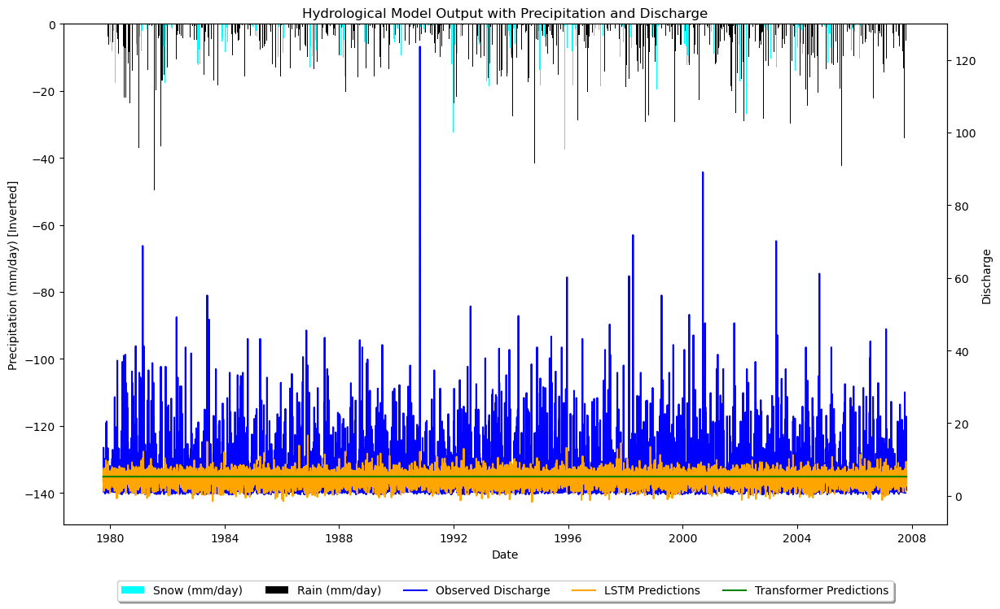

Total days with temperatures below zero (potential snow days): 563


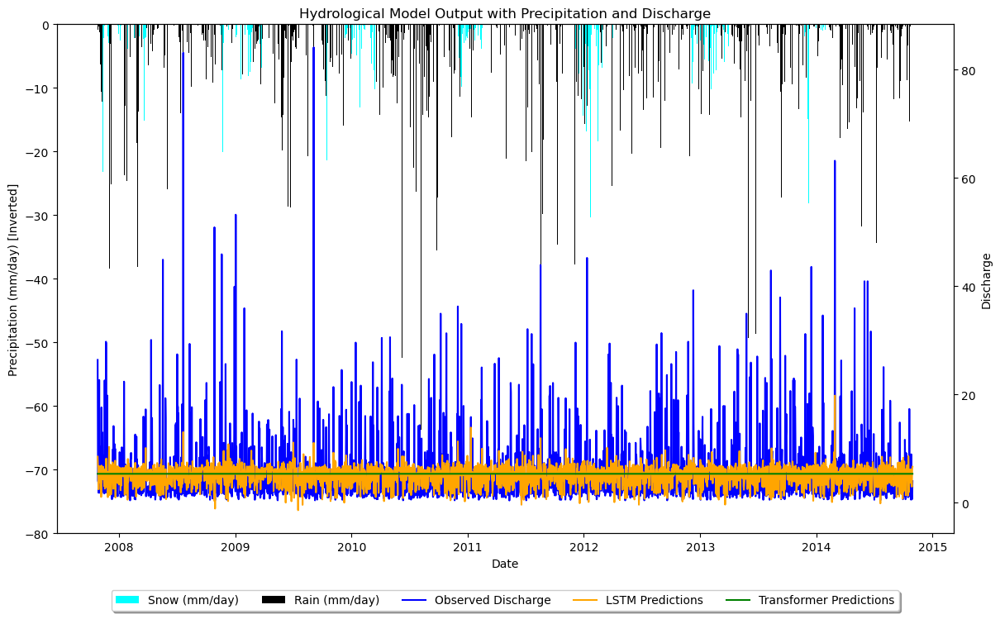


Training Basin 3: 114_Weisser_Regen

114_Weisser_Regen - Basic Statistical Analysis:
Mean Temperature: 6.629953427153994
Mean Precipitation: 3.079781310114407
Mean Discharge: 2.583744890018209
Temperature Standard Deviation: 7.788974818133604
Precipitation Standard Deviation: 6.459436318639271
Discharge Standard Deviation: 2.3221378260403447
Discharge Quantiles: 0.25    1.376
0.50    1.877
0.75    2.946
Name: Q, dtype: float64

494/494 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step
494/494 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
114_Weisser_Regen - LSTM Train NSE: 0.226
114_Weisser_Regen - Transformer Train NSE: -0.034
114_Weisser_Regen - LSTM Test NSE: 0.232
114_Weisser_Regen - Transformer Test NSE: -0.038
Total days with temperatures below zero (potential snow days): 3561


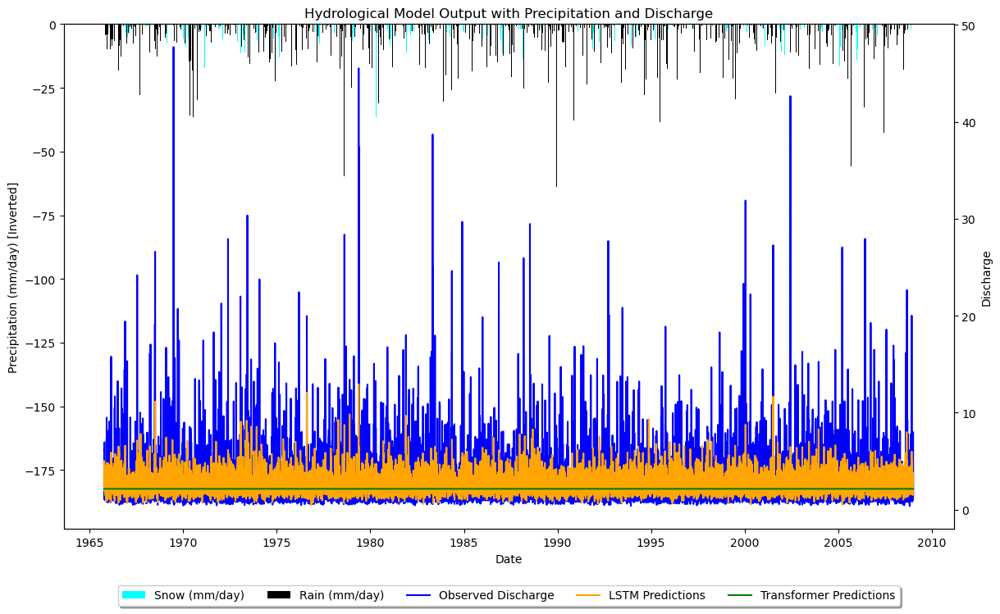

Total days with temperatures below zero (potential snow days): 788


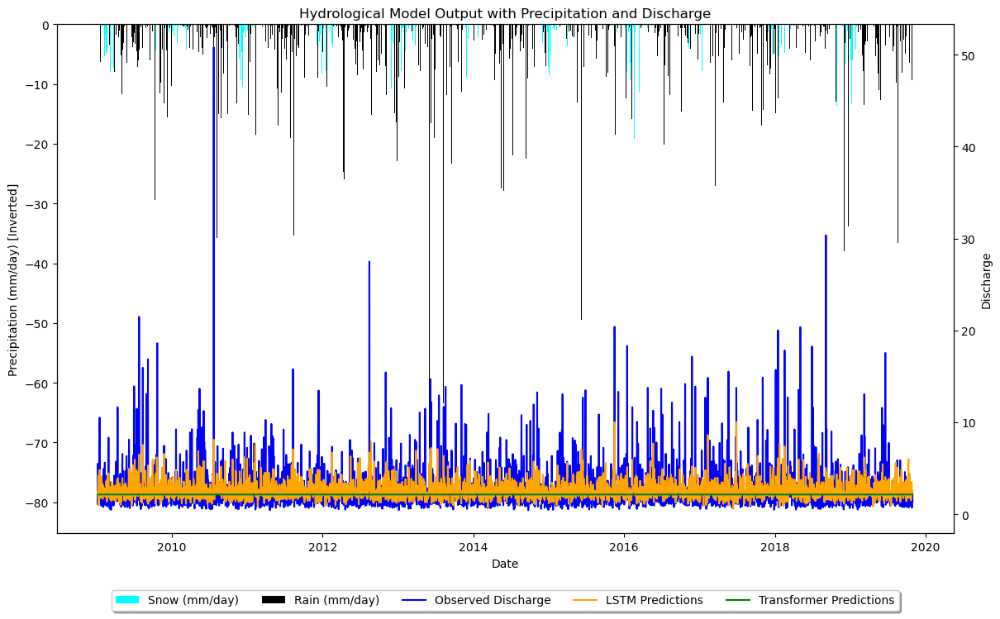


Training Basin 4: 102_Otava

102_Otava - Basic Statistical Analysis:
Mean Temperature: 4.868638314475224
Mean Precipitation: 3.358587592664846
Mean Discharge: 2.2838696839641046
Temperature Standard Deviation: 7.695653818627724
Precipitation Standard Deviation: 6.701040481393517
Discharge Standard Deviation: 2.1899589414683094
Discharge Quantiles: 0.25    1.140
0.50    1.590
0.75    2.582
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
102_Otava - LSTM Train NSE: 0.251
102_Otava - Transformer Train NSE: -0.003
102_Otava - LSTM Test NSE: 0.255
102_Otava - Transformer Test NSE: -0.003
Total days with temperatures below zero (potential snow days): 3016


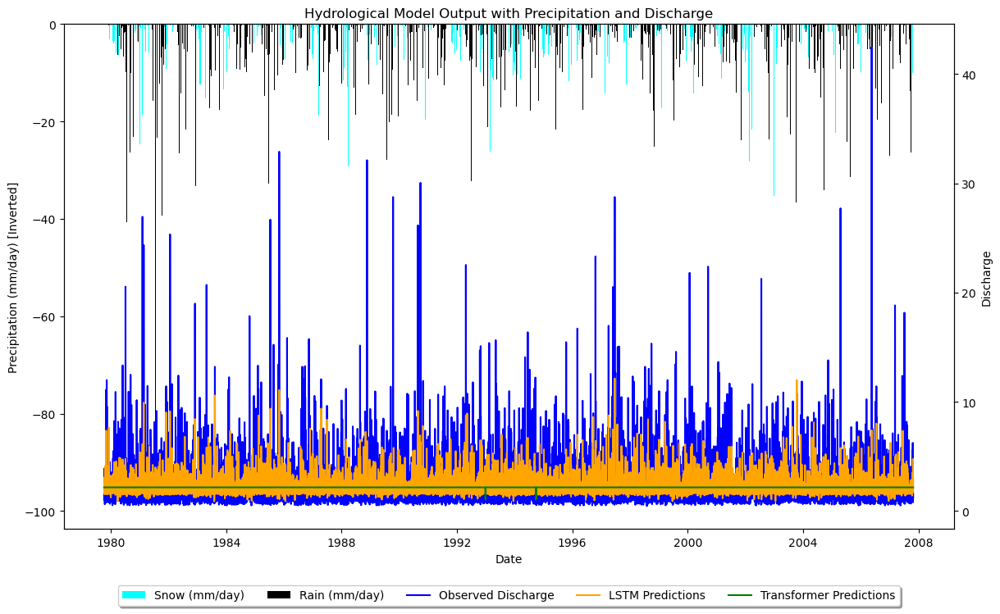

Total days with temperatures below zero (potential snow days): 647


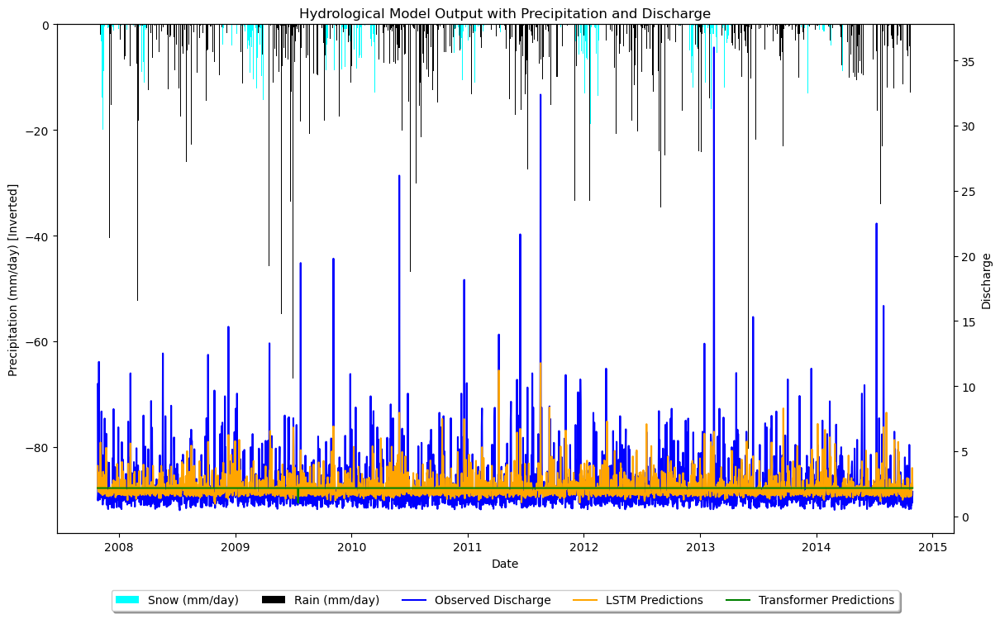


Training Basin 5: 512_Cerna_Opava

512_Cerna_Opava - Basic Statistical Analysis:
Mean Temperature: 6.326297307842372
Mean Precipitation: 3.1368162309793215
Mean Discharge: 1.462253684646206
Temperature Standard Deviation: 8.185740025774647
Precipitation Standard Deviation: 7.128695280522444
Discharge Standard Deviation: 1.646722592323802
Discharge Quantiles: 0.25    0.810000
0.50    1.149000
0.75    1.834922
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
512_Cerna_Opava - LSTM Train NSE: 0.303
512_Cerna_Opava - Transformer Train NSE: -0.027
512_Cerna_Opava - LSTM Test NSE: 0.274
512_Cerna_Opava - Transformer Test NSE: -0.015
Total days with temperatures below zero (potential snow days): 2505


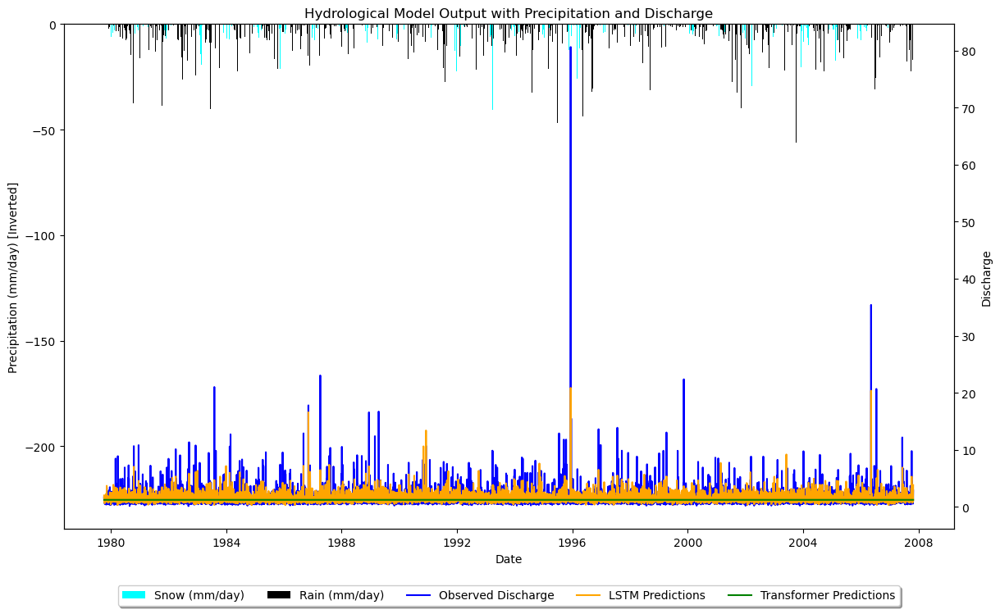

Total days with temperatures below zero (potential snow days): 543


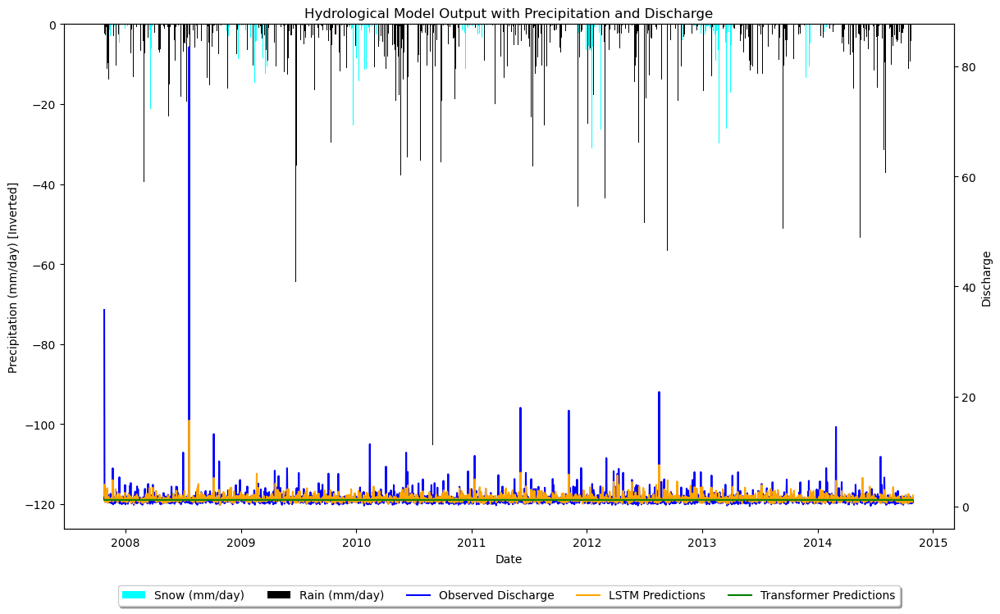


Training Basin 6: 603_Celadenka

603_Celadenka - Basic Statistical Analysis:
Mean Temperature: 8.16511119781506
Mean Precipitation: 2.681599687865782
Mean Discharge: 2.355688958252048
Temperature Standard Deviation: 8.450807677334353
Precipitation Standard Deviation: 6.848455245852255
Discharge Standard Deviation: 3.8259890684597404
Discharge Quantiles: 0.25    0.641
0.50    1.282
0.75    2.676
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
603_Celadenka - LSTM Train NSE: 0.342
603_Celadenka - Transformer Train NSE: -0.000
603_Celadenka - LSTM Test NSE: 0.298
603_Celadenka - Transformer Test NSE: -0.001
Total days with temperatures below zero (potential snow days): 1886


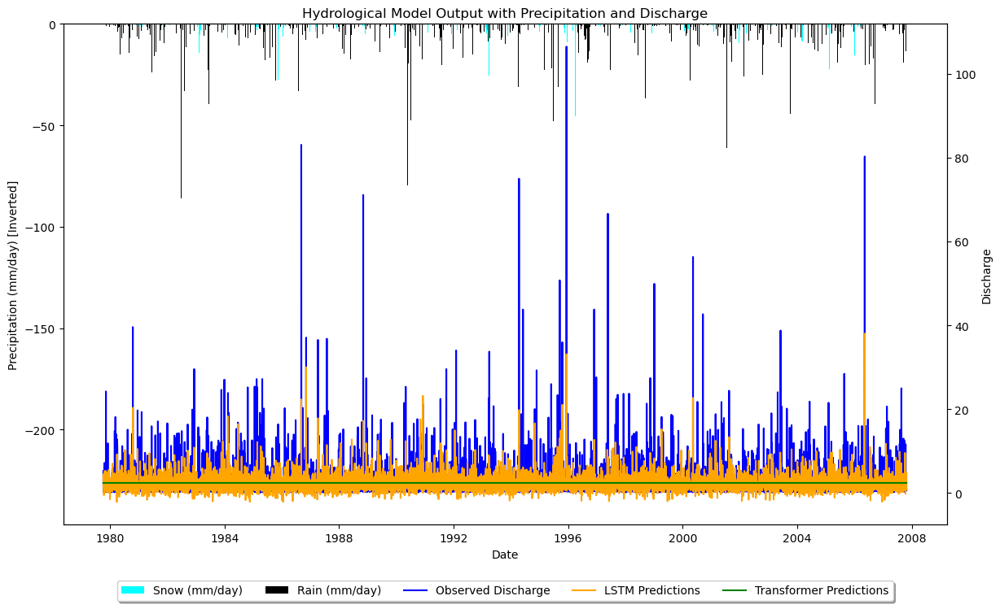

Total days with temperatures below zero (potential snow days): 429


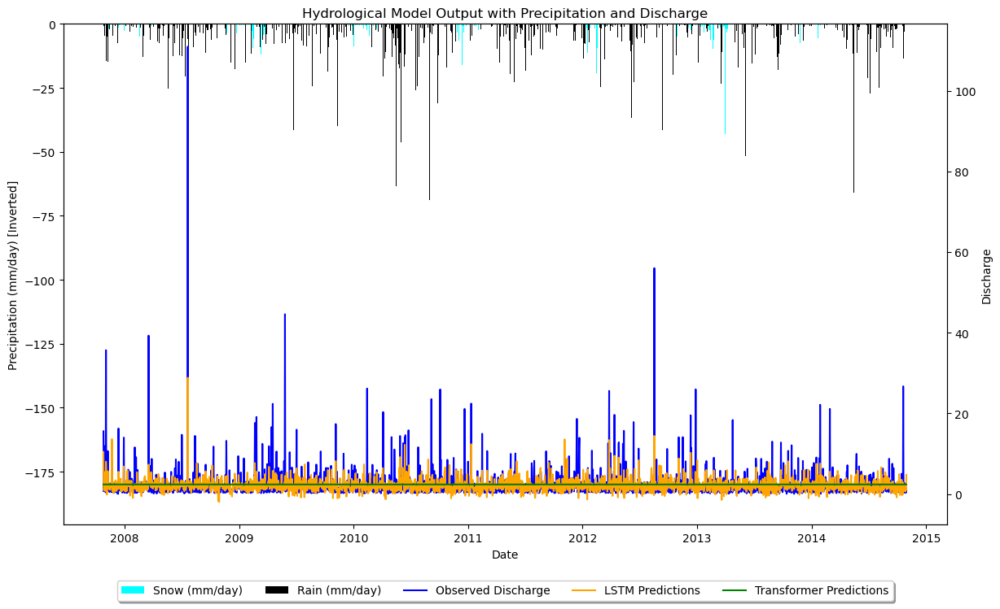


Training Basin 7: 404_Divoka_Orlice

404_Divoka_Orlice - Basic Statistical Analysis:
Mean Temperature: 7.201451424112369
Mean Precipitation: 3.0625985173624657
Mean Discharge: 1.9327801014436206
Temperature Standard Deviation: 8.26960164097481
Precipitation Standard Deviation: 6.581224289392818
Discharge Standard Deviation: 2.436633584943956
Discharge Quantiles: 0.25    0.675
0.50    1.170
0.75    2.228
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
404_Divoka_Orlice - LSTM Train NSE: 0.210
404_Divoka_Orlice - Transformer Train NSE: -0.002
404_Divoka_Orlice - LSTM Test NSE: 0.183
404_Divoka_Orlice - Transformer Test NSE: -0.000
Total days with temperatures below zero (potential snow days): 2306


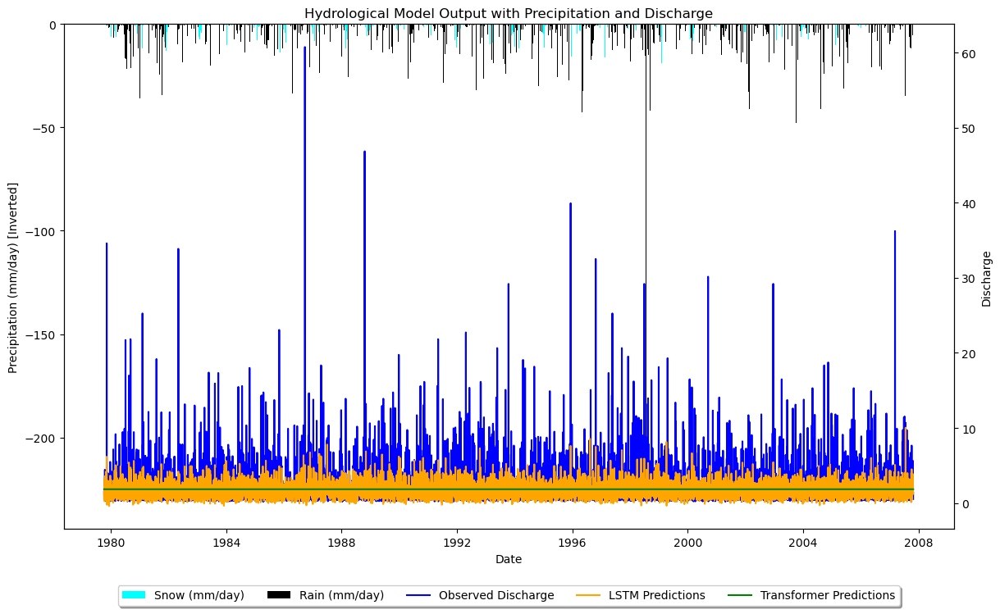

Total days with temperatures below zero (potential snow days): 522


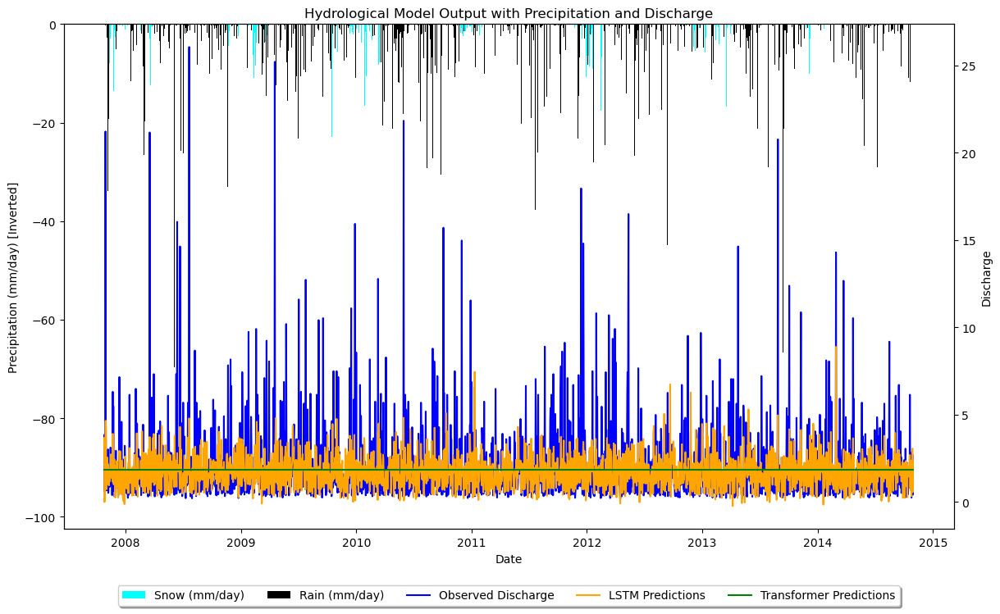


Training Basin 8: 511_Stribrny_potok

511_Stribrny_potok - Basic Statistical Analysis:
Mean Temperature: 7.979843932891144
Mean Precipitation: 3.022294186500195
Mean Discharge: 1.4712892703862661
Temperature Standard Deviation: 8.36514468946334
Precipitation Standard Deviation: 6.6003542464378055
Discharge Standard Deviation: 2.0365609507740725
Discharge Quantiles: 0.25    0.646
0.50    0.969
0.75    1.667
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
511_Stribrny_potok - LSTM Train NSE: 0.373
511_Stribrny_potok - Transformer Train NSE: -0.012
511_Stribrny_potok - LSTM Test NSE: 0.363
511_Stribrny_potok - Transformer Test NSE: -0.010
Total days with temperatures below zero (potential snow days): 1868


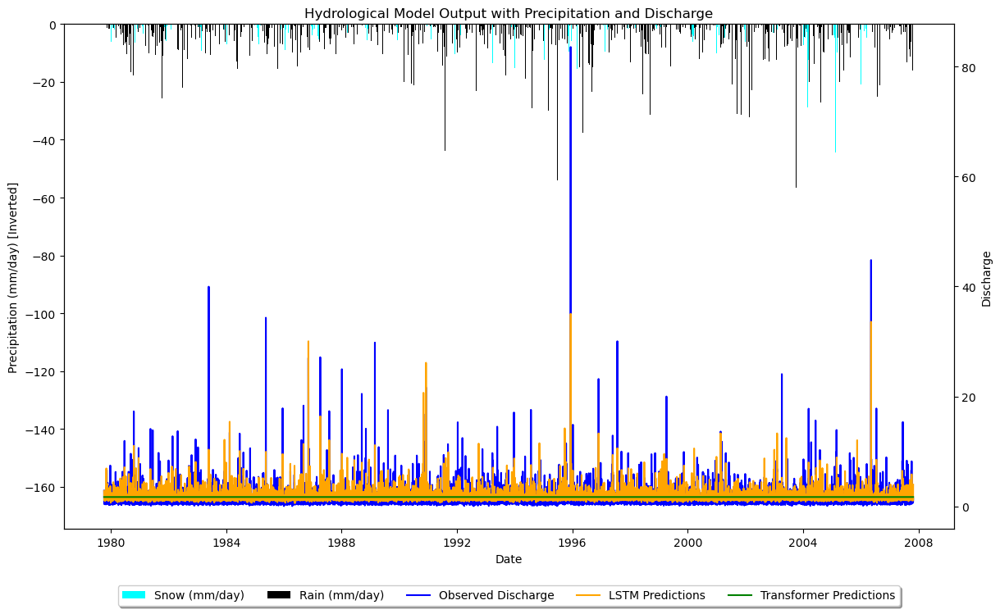

Total days with temperatures below zero (potential snow days): 432


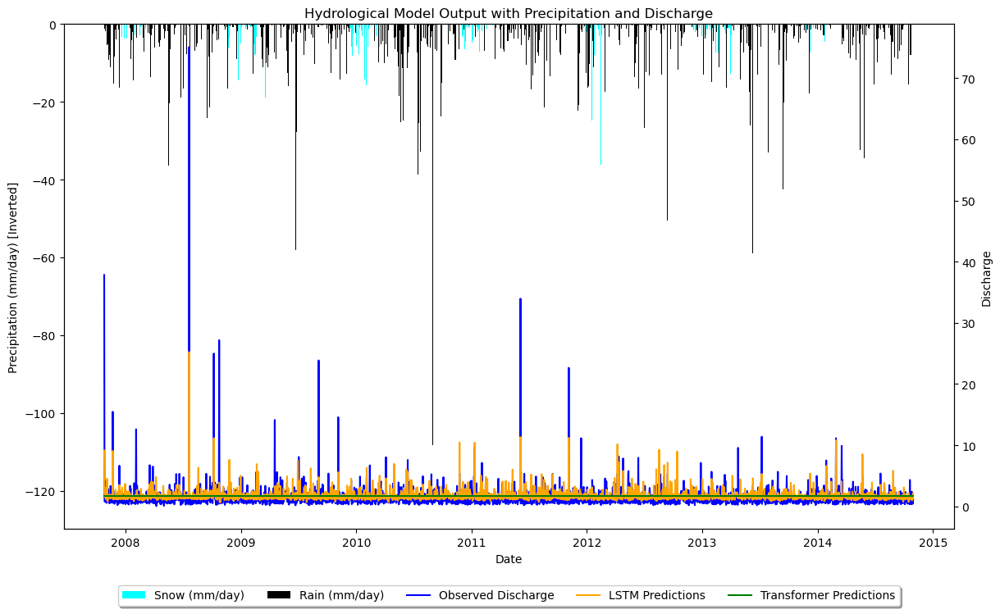


Training Basin 9: 604_Ostravice

604_Ostravice - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.0798751463129146
Mean Discharge: 1.7493648068669527
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 7.219983906739067
Discharge Standard Deviation: 2.857935074040359
Discharge Quantiles: 0.25    0.391
0.50    0.825
0.75    1.933
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
604_Ostravice - LSTM Train NSE: 0.300
604_Ostravice - Transformer Train NSE: -0.025
604_Ostravice - LSTM Test NSE: 0.284
604_Ostravice - Transformer Test NSE: -0.015
Total days with temperatures below zero (potential snow days): 3812


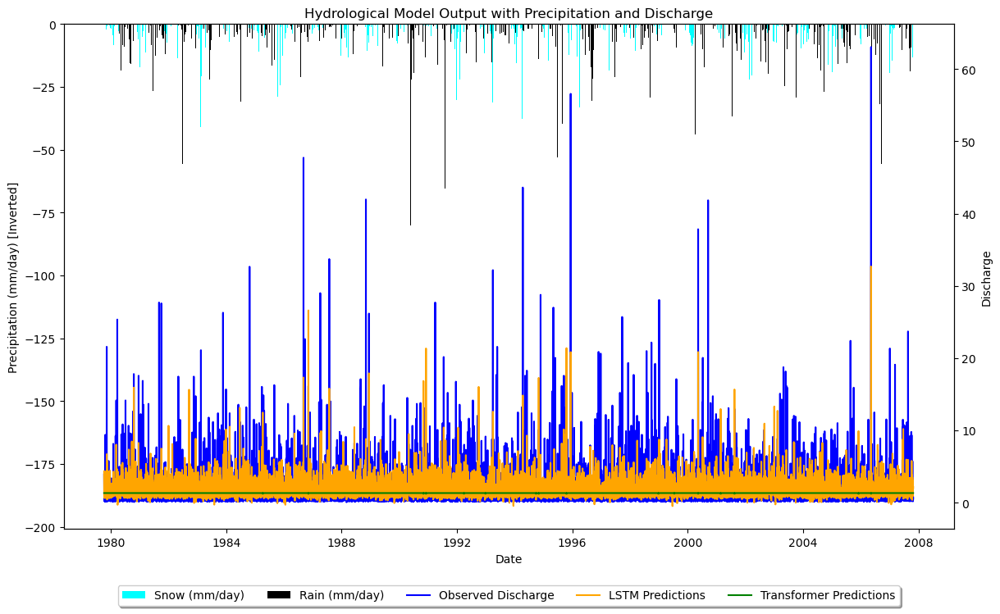

Total days with temperatures below zero (potential snow days): 869


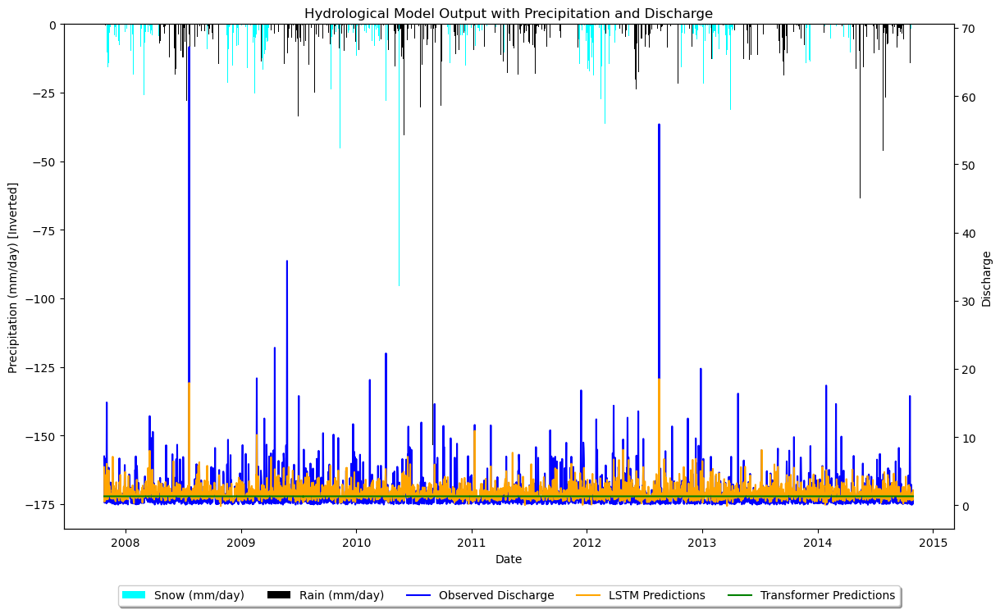


Training Basin 10: 109_Blanice

109_Blanice - Basic Statistical Analysis:
Mean Temperature: 7.74787218210519
Mean Precipitation: 1.8153726102223957
Mean Discharge: 0.8252644557159577
Temperature Standard Deviation: 8.073430757645605
Precipitation Standard Deviation: 4.847919971195846
Discharge Standard Deviation: 1.183389587884291
Discharge Quantiles: 0.25    0.331
0.50    0.507
0.75    0.912
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
109_Blanice - LSTM Train NSE: 0.241
109_Blanice - Transformer Train NSE: -0.088
109_Blanice - LSTM Test NSE: 0.264
109_Blanice - Transformer Test NSE: -0.041
Total days with temperatures below zero (potential snow days): 1849


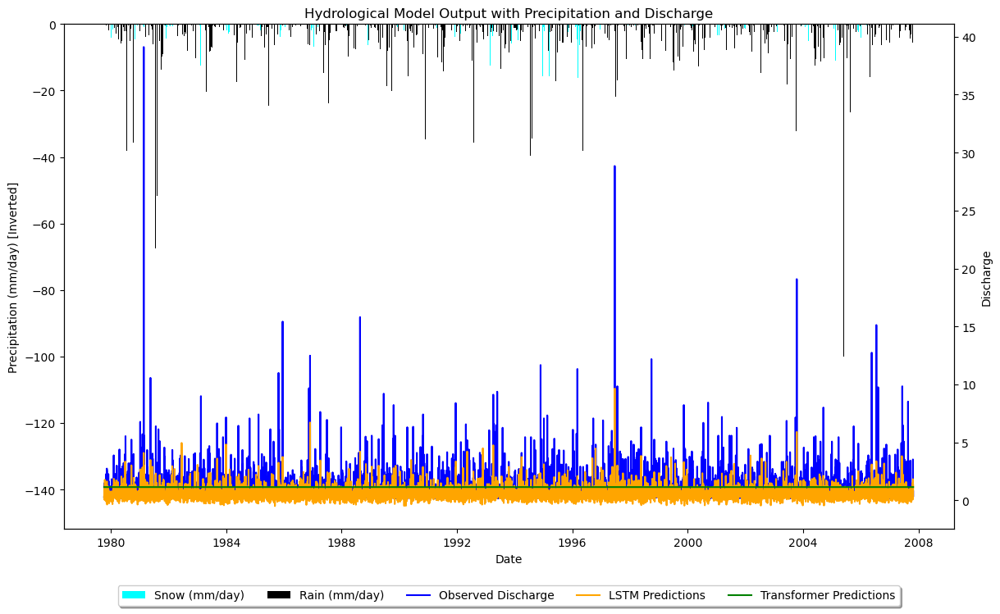

Total days with temperatures below zero (potential snow days): 445


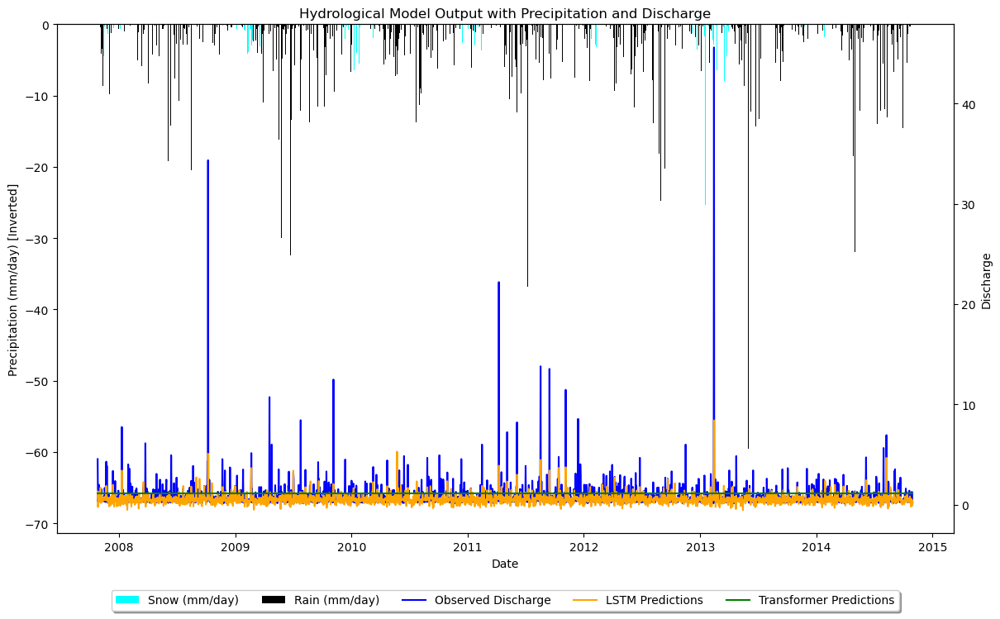


Training Basin 11: 201_Rolava

201_Rolava - Basic Statistical Analysis:
Mean Temperature: 8.422973078423722
Mean Precipitation: 2.5537026921576276
Mean Discharge: 2.6087846273897775
Temperature Standard Deviation: 7.8790997945895604
Precipitation Standard Deviation: 5.091468653730311
Discharge Standard Deviation: 2.361472633290819
Discharge Quantiles: 0.25    1.294
0.50    1.982
0.75    3.061
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
201_Rolava - LSTM Train NSE: 0.225
201_Rolava - Transformer Train NSE: -0.021
201_Rolava - LSTM Test NSE: 0.217
201_Rolava - Transformer Test NSE: -0.033
Total days with temperatures below zero (potential snow days): 1547


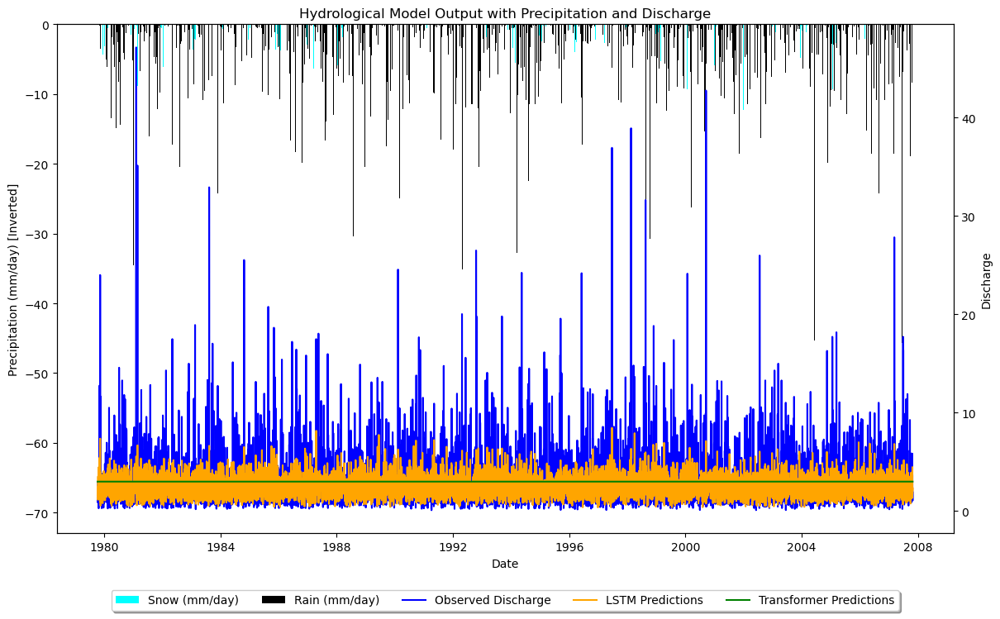

Total days with temperatures below zero (potential snow days): 347


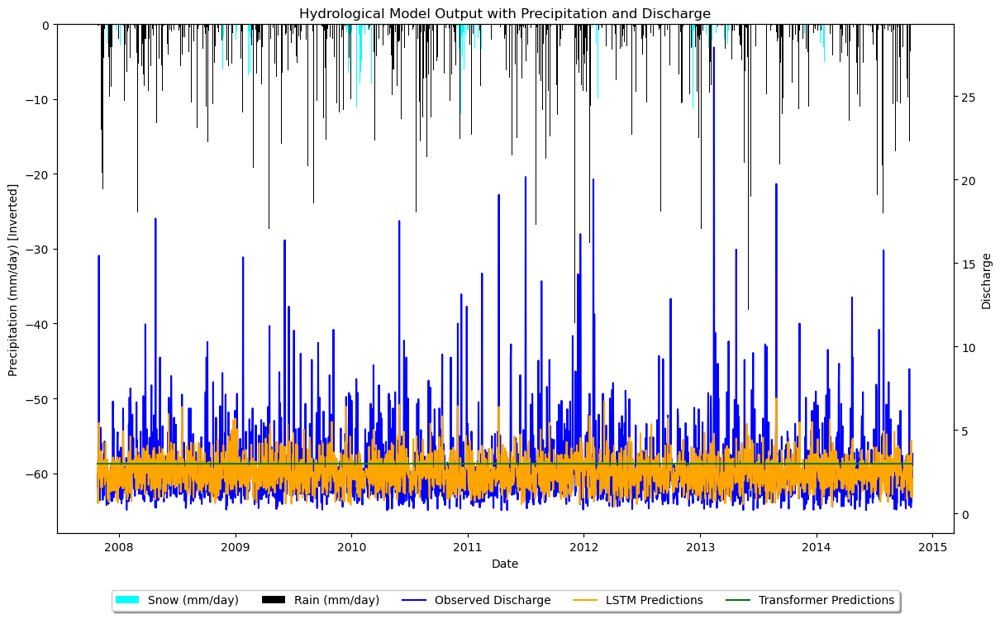


Training Basin 12: 610_Ropicanka

610_Ropicanka - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.1711900117050336
Mean Discharge: 2.1896516582130316
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 6.851775931308367
Discharge Standard Deviation: 3.403521963331183
Discharge Quantiles: 0.25    0.615
0.50    1.268
0.75    2.507
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
610_Ropicanka - LSTM Train NSE: 0.323
610_Ropicanka - Transformer Train NSE: -0.006
610_Ropicanka - LSTM Test NSE: 0.239
610_Ropicanka - Transformer Test NSE: -0.008
Total days with temperatures below zero (potential snow days): 3812


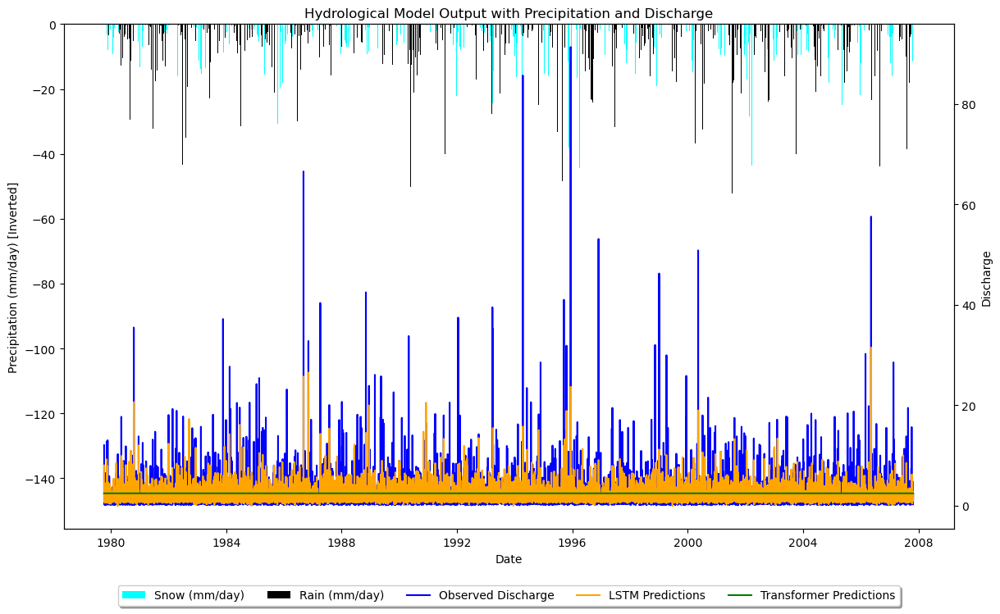

Total days with temperatures below zero (potential snow days): 869


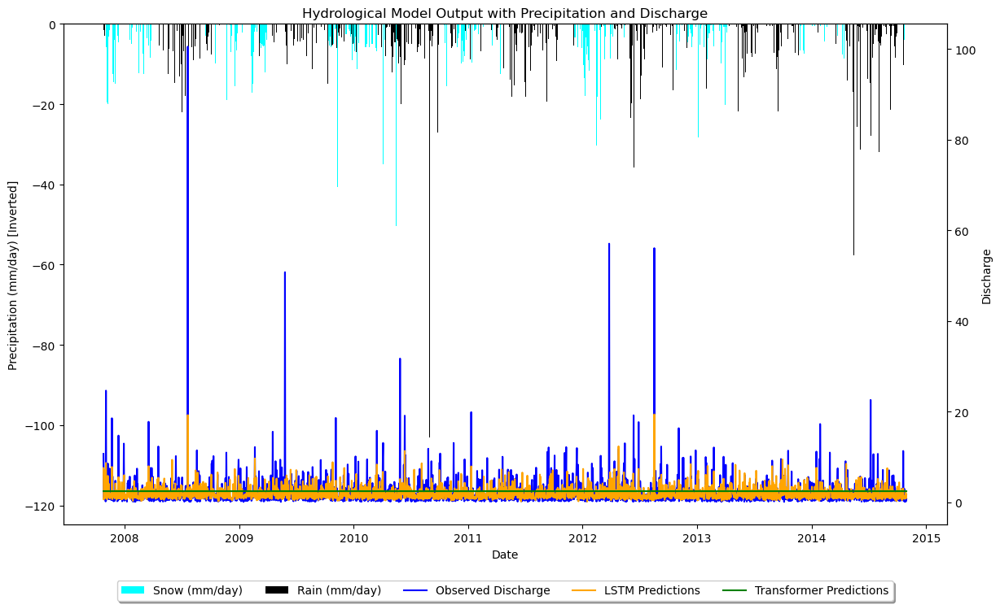


Training Basin 13: 608_Mohelnice

608_Mohelnice - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.8621693328131093
Mean Discharge: 2.4135822083495904
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 9.164753056514472
Discharge Standard Deviation: 3.729664958742944
Discharge Quantiles: 0.25    0.7285
0.50    1.4030
0.75    2.9290
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
608_Mohelnice - LSTM Train NSE: 0.340
608_Mohelnice - Transformer Train NSE: -0.014
608_Mohelnice - LSTM Test NSE: 0.317
608_Mohelnice - Transformer Test NSE: -0.016
Total days with temperatures below zero (potential snow days): 3812


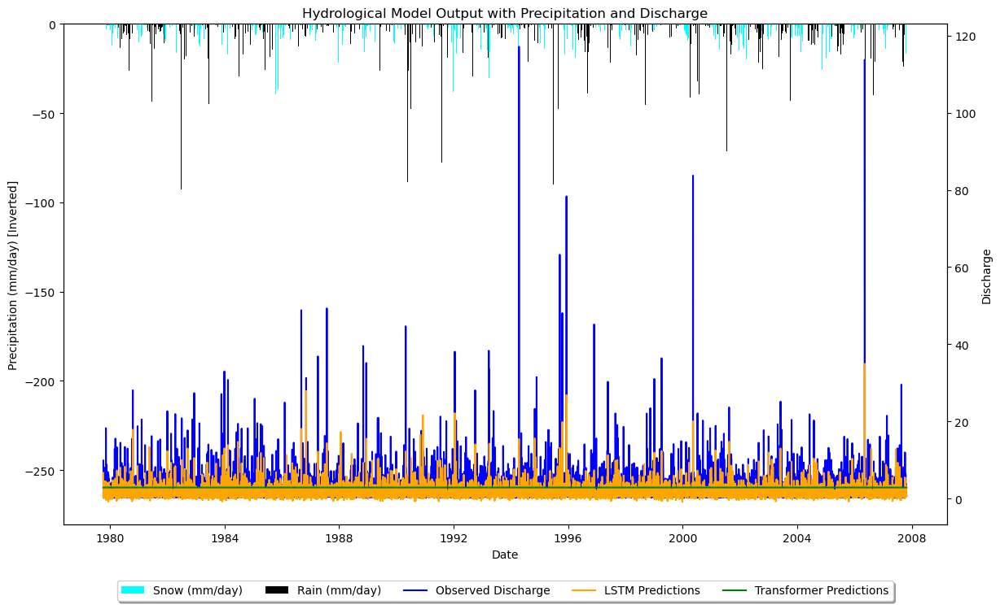

Total days with temperatures below zero (potential snow days): 869


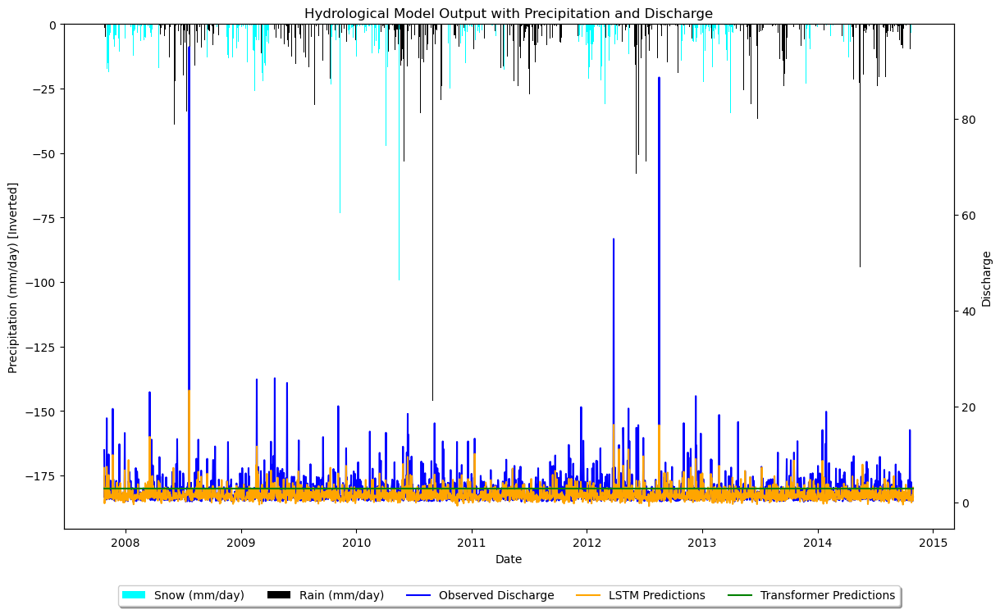


Training Basin 14: 103_Hamersky_potok

103_Hamersky_potok - Basic Statistical Analysis:
Mean Temperature: 4.868638314475224
Mean Precipitation: 3.358587592664846
Mean Discharge: 2.1576172454155285
Temperature Standard Deviation: 7.695653818627724
Precipitation Standard Deviation: 6.701040481393517
Discharge Standard Deviation: 1.841171274418571
Discharge Quantiles: 0.25    1.059
0.50    1.584
0.75    2.520
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
103_Hamersky_potok - LSTM Train NSE: 0.231
103_Hamersky_potok - Transformer Train NSE: 0.045
103_Hamersky_potok - LSTM Test NSE: 0.246
103_Hamersky_potok - Transformer Test NSE: 0.093
Total days with temperatures below zero (potential snow days): 3016


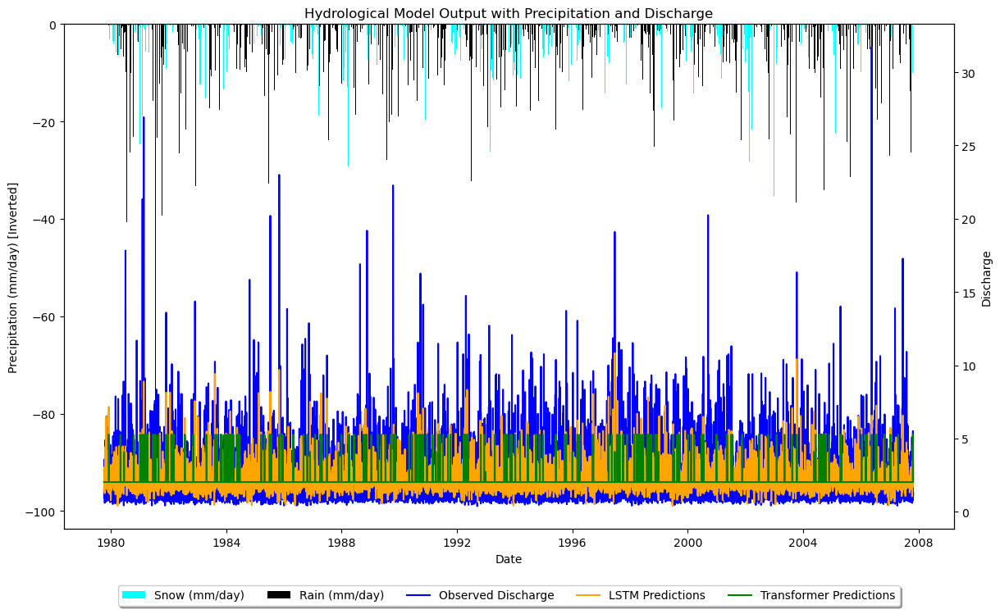

Total days with temperatures below zero (potential snow days): 647


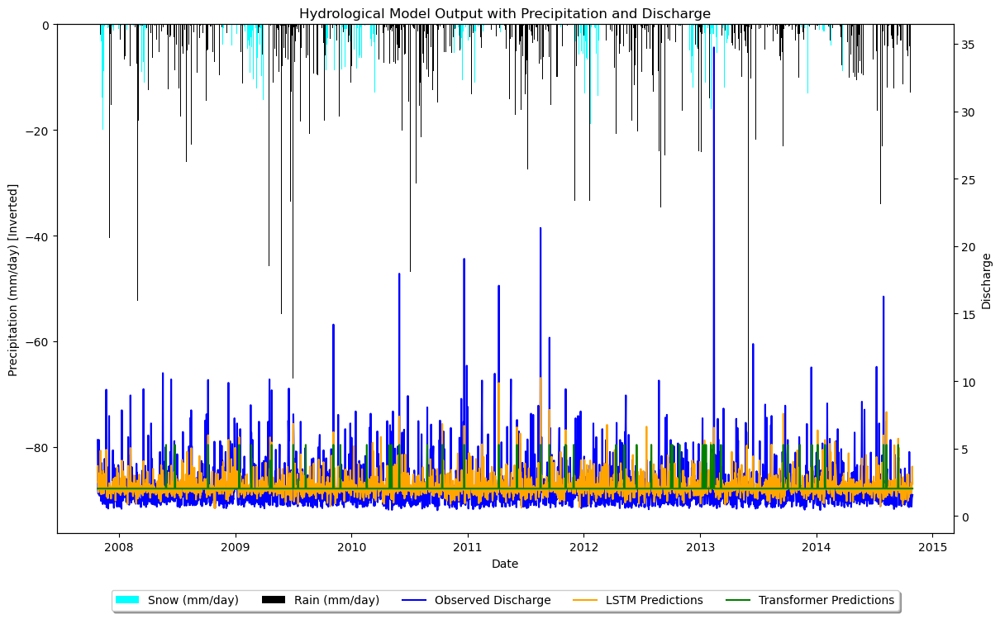


Training Basin 15: 108_Blanice

108_Blanice - Basic Statistical Analysis:
Mean Temperature: 7.74787218210519
Mean Precipitation: 1.8153726102223957
Mean Discharge: 0.9339522434646896
Temperature Standard Deviation: 8.073430757645605
Precipitation Standard Deviation: 4.847919971195846
Discharge Standard Deviation: 1.4429336872976044
Discharge Quantiles: 0.25    0.355
0.50    0.552
0.75    1.000
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
108_Blanice - LSTM Train NSE: 0.218
108_Blanice - Transformer Train NSE: -0.283
108_Blanice - LSTM Test NSE: 0.257
108_Blanice - Transformer Test NSE: -0.158
Total days with temperatures below zero (potential snow days): 1849


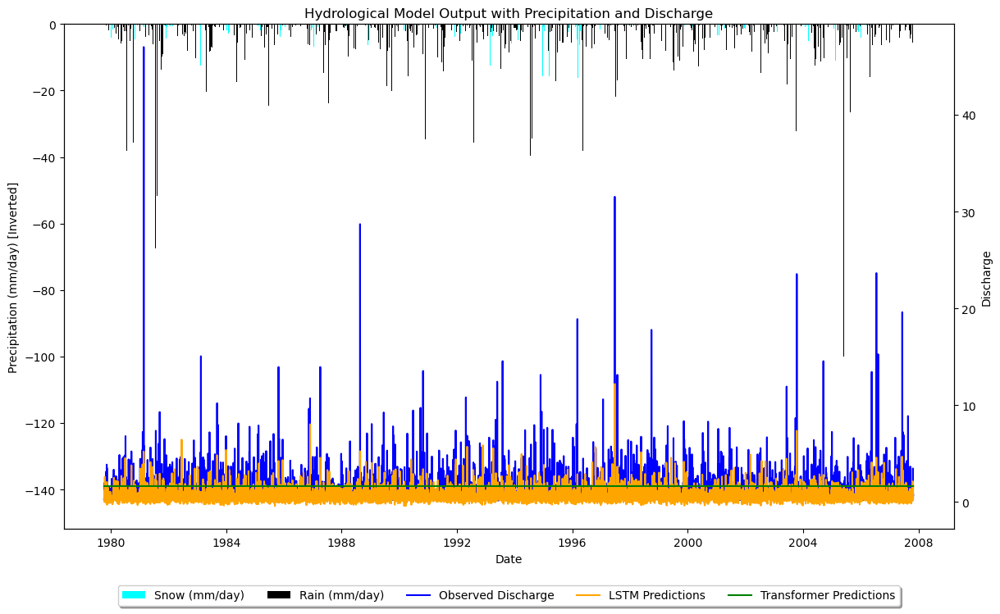

Total days with temperatures below zero (potential snow days): 445


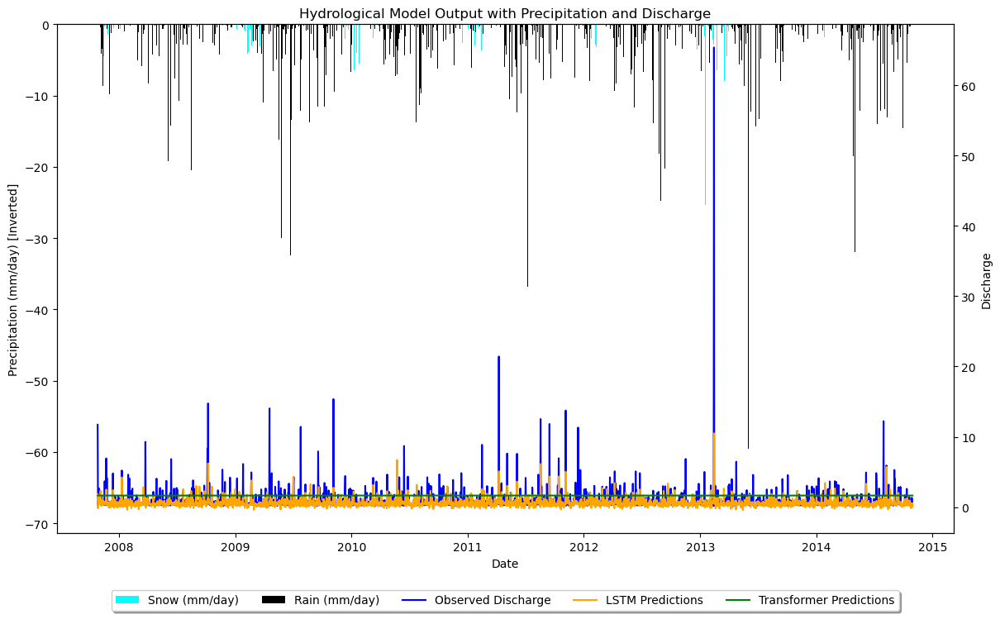


Training Basin 16: 302_Cerna_Nisa

302_Cerna_Nisa - Basic Statistical Analysis:
Mean Temperature: 5.313804135778384
Mean Precipitation: 3.355957861880609
Mean Discharge: 2.1144159968786576
Temperature Standard Deviation: 7.888714558849801
Precipitation Standard Deviation: 6.989966848241078
Discharge Standard Deviation: 1.9798604084711175
Discharge Quantiles: 0.25    1.204
0.50    1.737
0.75    2.507
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
302_Cerna_Nisa - LSTM Train NSE: 0.257
302_Cerna_Nisa - Transformer Train NSE: -0.041
302_Cerna_Nisa - LSTM Test NSE: 0.158
302_Cerna_Nisa - Transformer Test NSE: -0.082
Total days with temperatures below zero (potential snow days): 2930


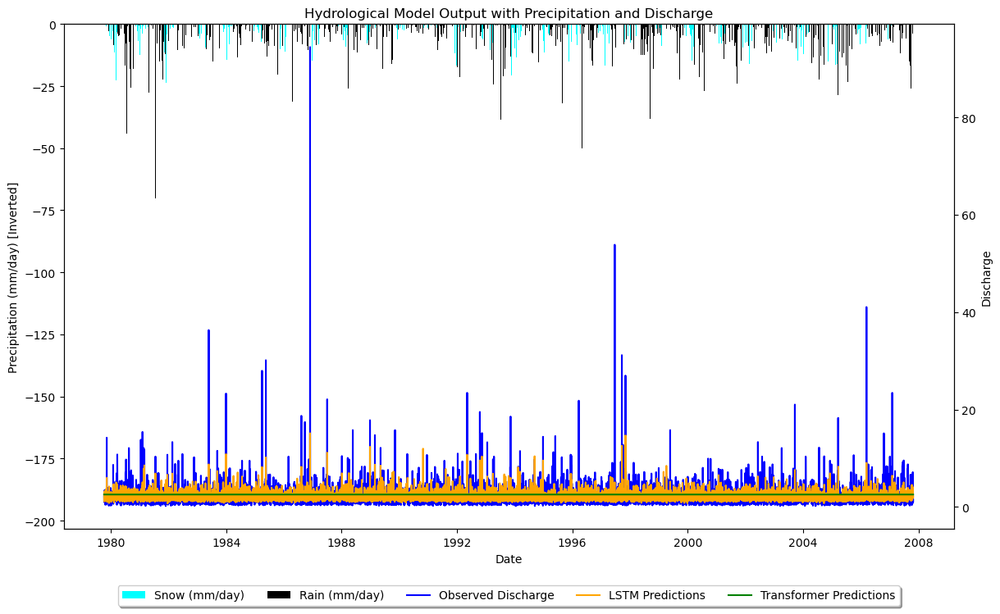

Total days with temperatures below zero (potential snow days): 639


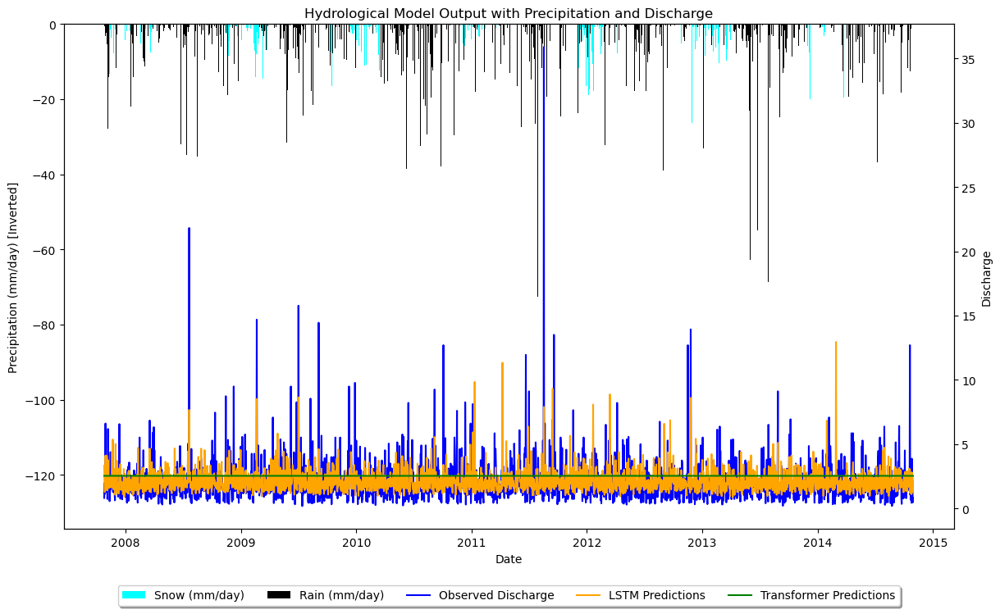


Training Basin 17: 101_Vydra

101_Vydra - Basic Statistical Analysis:
Mean Temperature: 4.868638314475224
Mean Precipitation: 3.358587592664846
Mean Discharge: 3.327230042918455
Temperature Standard Deviation: 7.695653818627724
Precipitation Standard Deviation: 6.701040481393517
Discharge Standard Deviation: 3.5341817359211367
Discharge Quantiles: 0.25    1.539
0.50    2.136
0.75    3.589
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
101_Vydra - LSTM Train NSE: 0.231
101_Vydra - Transformer Train NSE: -0.110
101_Vydra - LSTM Test NSE: 0.234
101_Vydra - Transformer Test NSE: -0.115
Total days with temperatures below zero (potential snow days): 3016


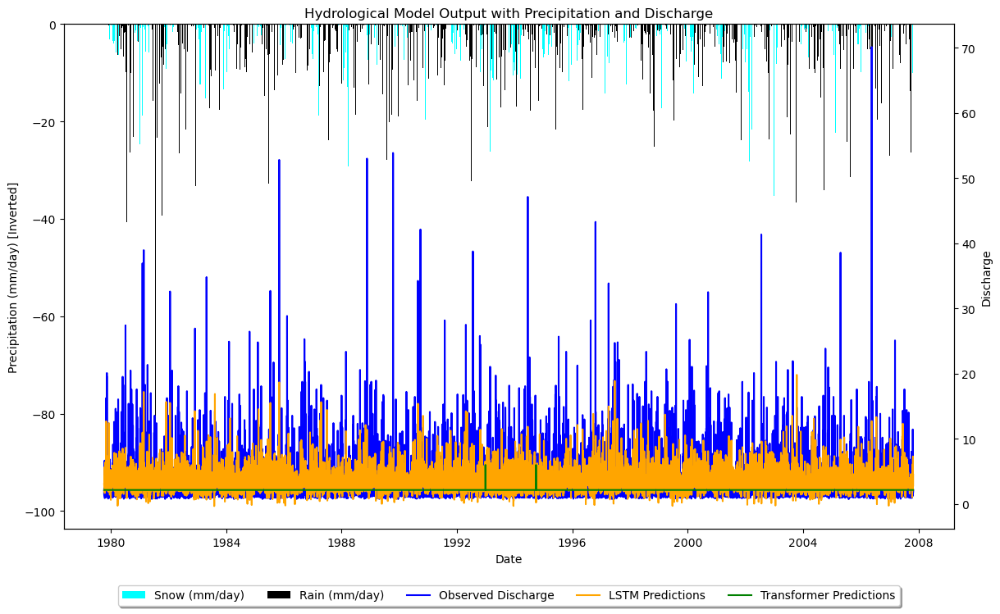

Total days with temperatures below zero (potential snow days): 647


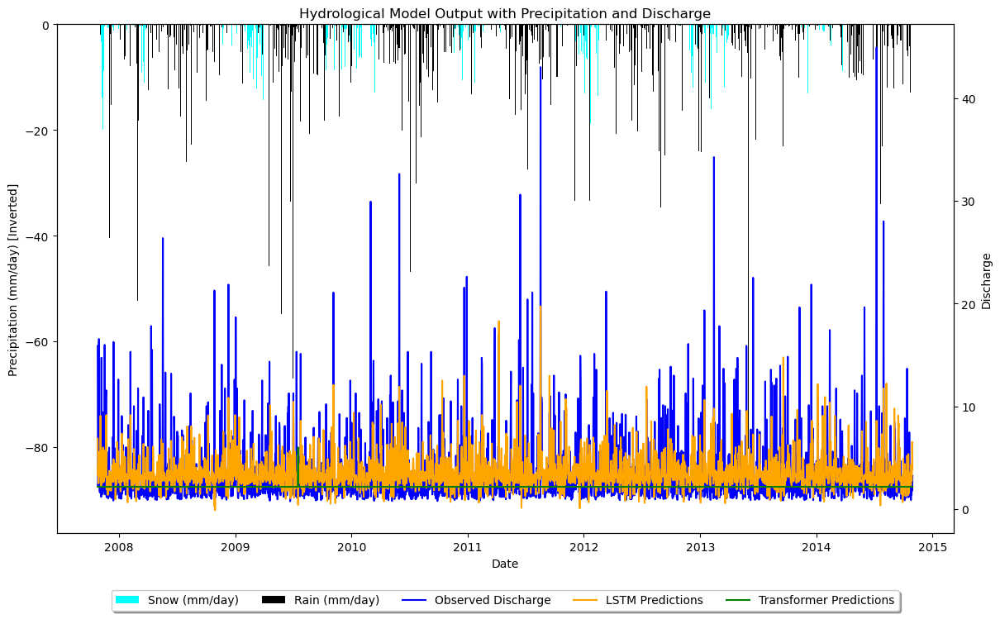


Training Basin 18: 311_Cista

311_Cista - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.2231681623097934
Mean Discharge: 1.4389297736242703
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.617562107619908
Discharge Standard Deviation: 1.7964408816627584
Discharge Quantiles: 0.25    0.507
0.50    0.826
0.75    1.708
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
311_Cista - LSTM Train NSE: 0.154
311_Cista - Transformer Train NSE: -0.004
311_Cista - LSTM Test NSE: 0.103
311_Cista - Transformer Test NSE: -0.007
Total days with temperatures below zero (potential snow days): 2556


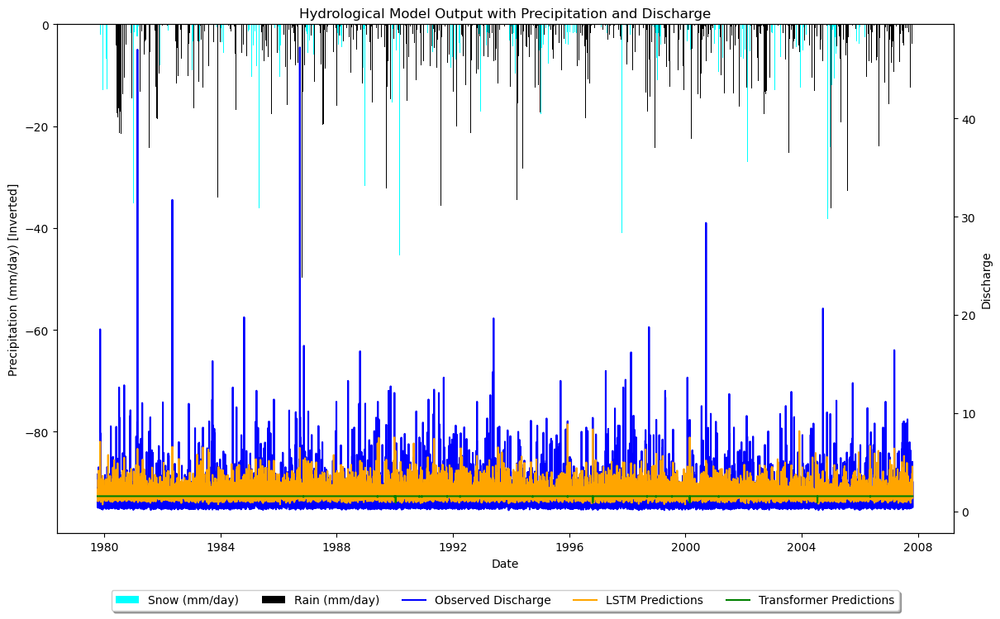

Total days with temperatures below zero (potential snow days): 563


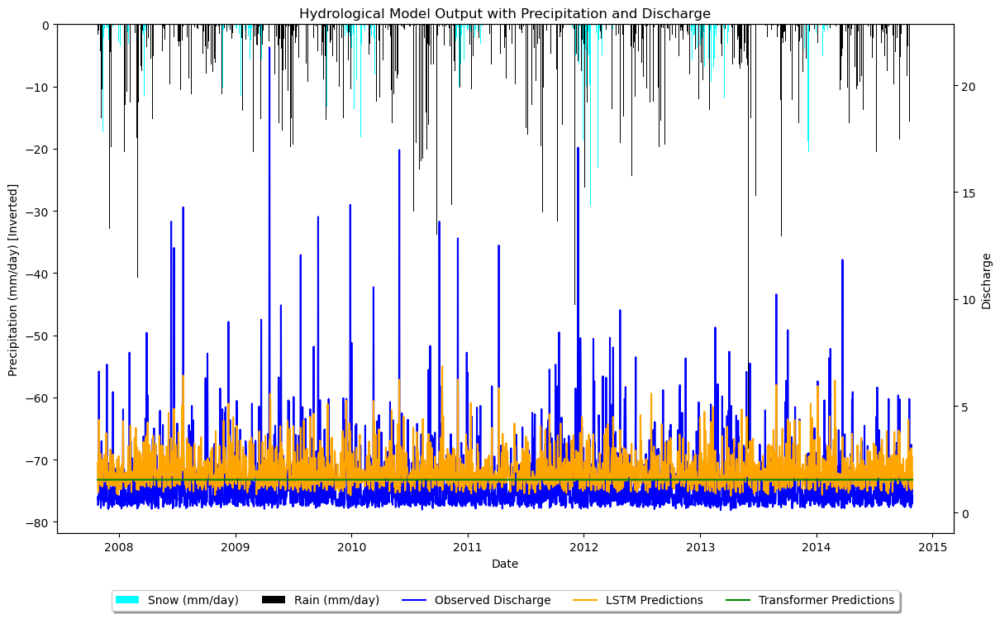


Training Basin 19: 609_Slavic

609_Slavic - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.1711900117050336
Mean Discharge: 2.5408478345688645
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 6.851775931308367
Discharge Standard Deviation: 4.797580649579615
Discharge Quantiles: 0.25    0.824
0.50    1.488
0.75    2.661
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
609_Slavic - LSTM Train NSE: 0.268
609_Slavic - Transformer Train NSE: -0.026
609_Slavic - LSTM Test NSE: 0.202
609_Slavic - Transformer Test NSE: -0.023
Total days with temperatures below zero (potential snow days): 3812


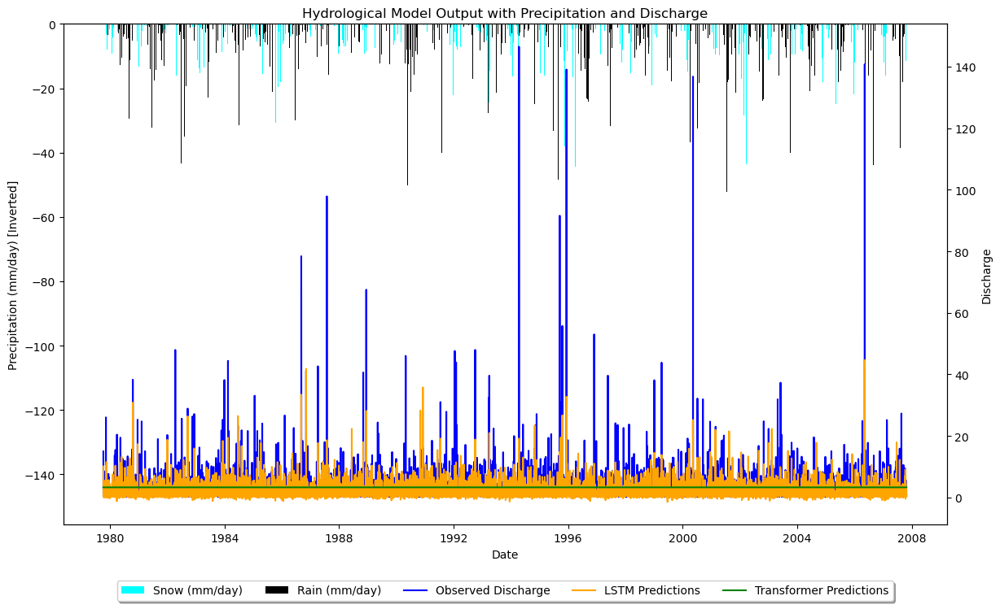

Total days with temperatures below zero (potential snow days): 869


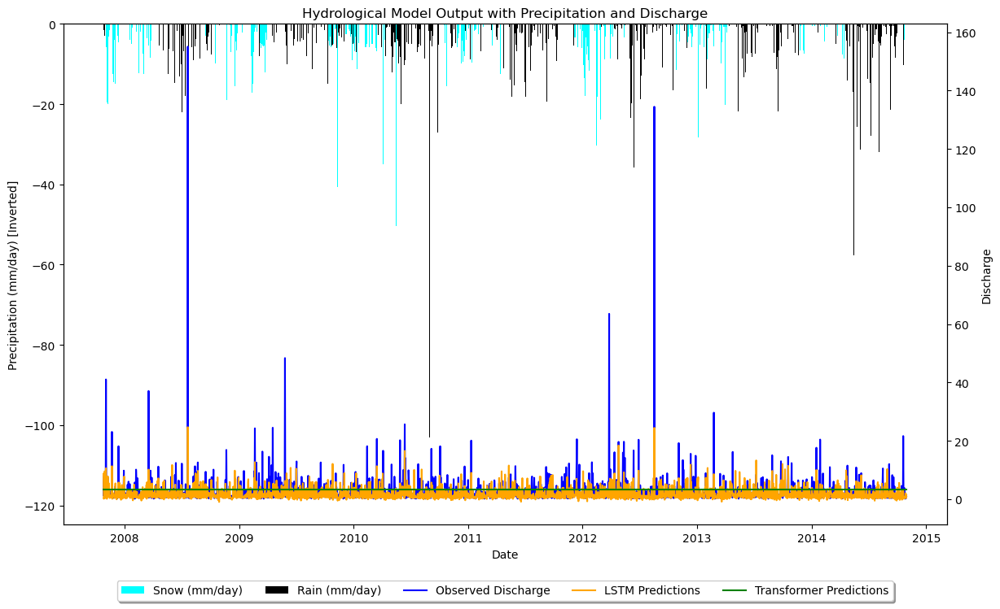


Training Basin 20: 606_Skalka

606_Skalka - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.1711900117050336
Mean Discharge: 2.2332355833008193
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 6.851775931308367
Discharge Standard Deviation: 3.9855407469056443
Discharge Quantiles: 0.25    0.617
0.50    1.125
0.75    2.533
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
606_Skalka - LSTM Train NSE: 0.193
606_Skalka - Transformer Train NSE: -0.009
606_Skalka - LSTM Test NSE: 0.123
606_Skalka - Transformer Test NSE: -0.006
Total days with temperatures below zero (potential snow days): 3812


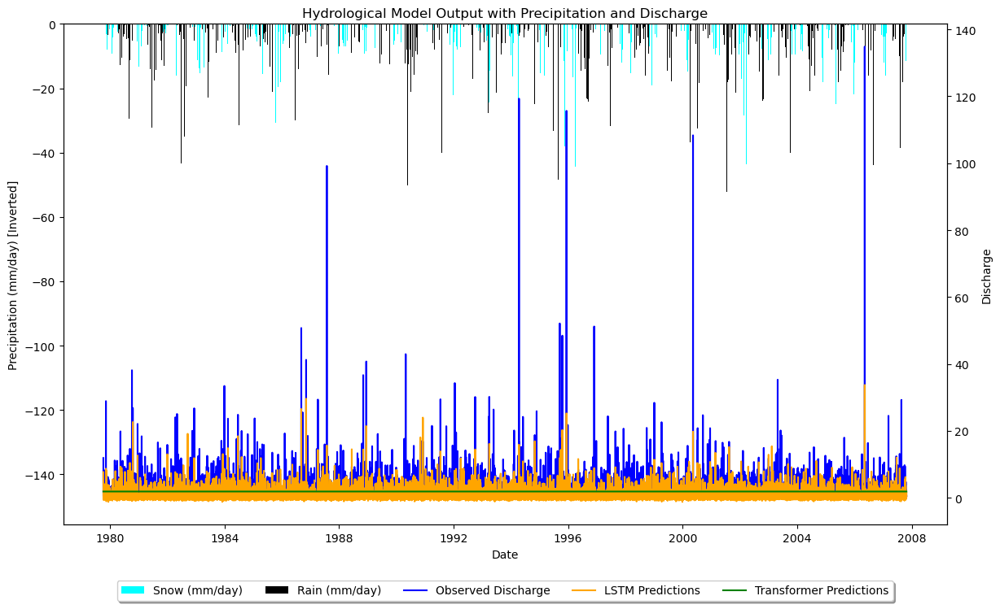

Total days with temperatures below zero (potential snow days): 869


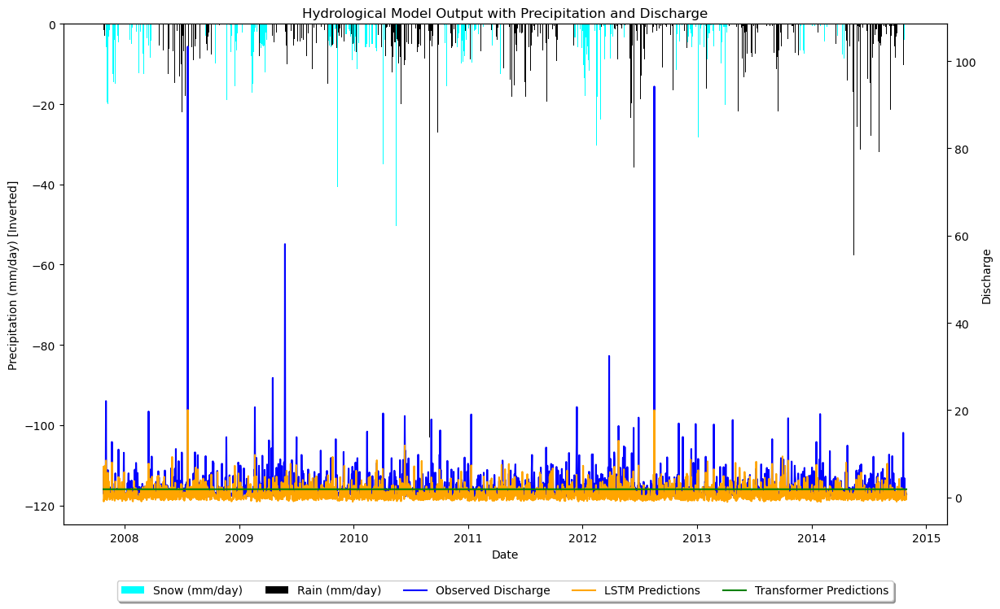


Training Basin 21: 503_Moravice

503_Moravice - Basic Statistical Analysis:
Mean Temperature: 6.326297307842372
Mean Precipitation: 1.8722044479126025
Mean Discharge: 1.332636597737027
Temperature Standard Deviation: 8.185740025774647
Precipitation Standard Deviation: 4.423038702221348
Discharge Standard Deviation: 1.3253937894451167
Discharge Quantiles: 0.25    0.548
0.50    0.871
0.75    1.624
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
503_Moravice - LSTM Train NSE: 0.187
503_Moravice - Transformer Train NSE: -0.089
503_Moravice - LSTM Test NSE: 0.157
503_Moravice - Transformer Test NSE: -0.118
Total days with temperatures below zero (potential snow days): 2505


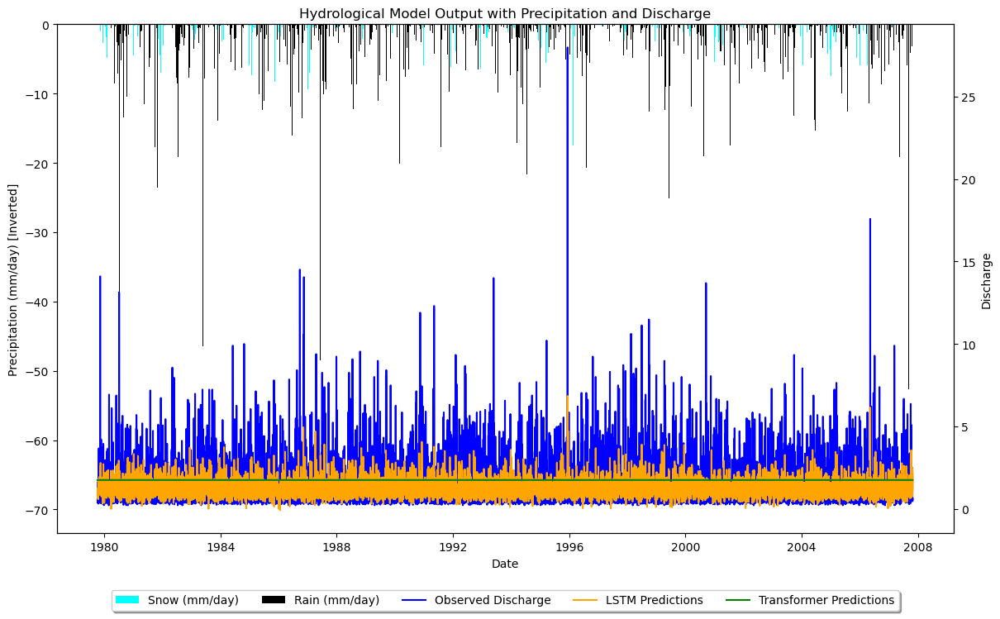

Total days with temperatures below zero (potential snow days): 543


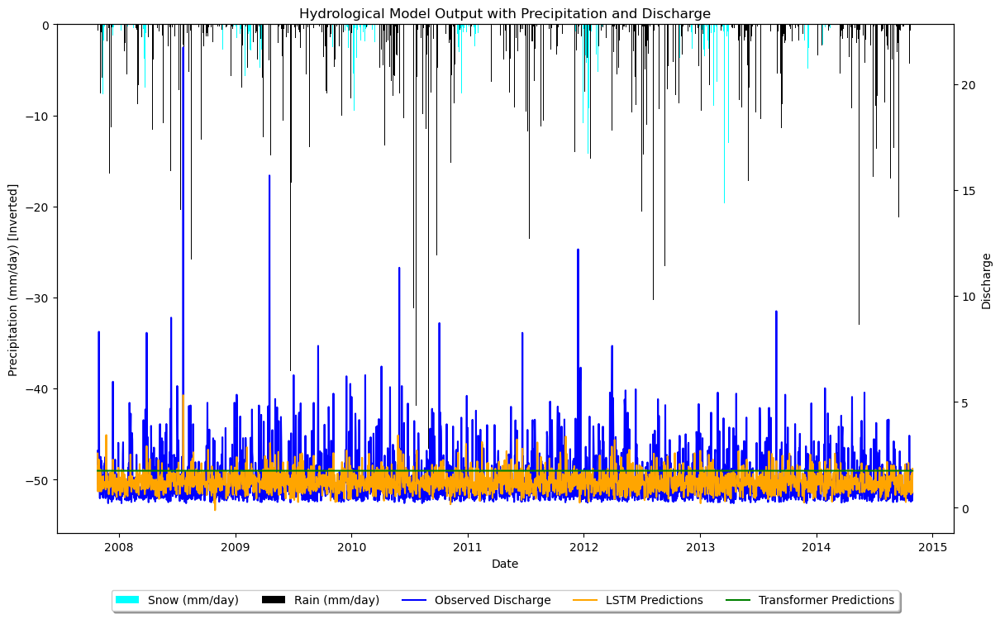


Training Basin 22: 308_Jizerka

308_Jizerka - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.595333593445181
Mean Discharge: 2.4985508388607096
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.999927651016609
Discharge Standard Deviation: 2.718550899071114
Discharge Quantiles: 0.25    0.979
0.50    1.609
0.75    2.932
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
308_Jizerka - LSTM Train NSE: 0.154
308_Jizerka - Transformer Train NSE: -0.000
308_Jizerka - LSTM Test NSE: 0.158
308_Jizerka - Transformer Test NSE: -0.000
Total days with temperatures below zero (potential snow days): 2556


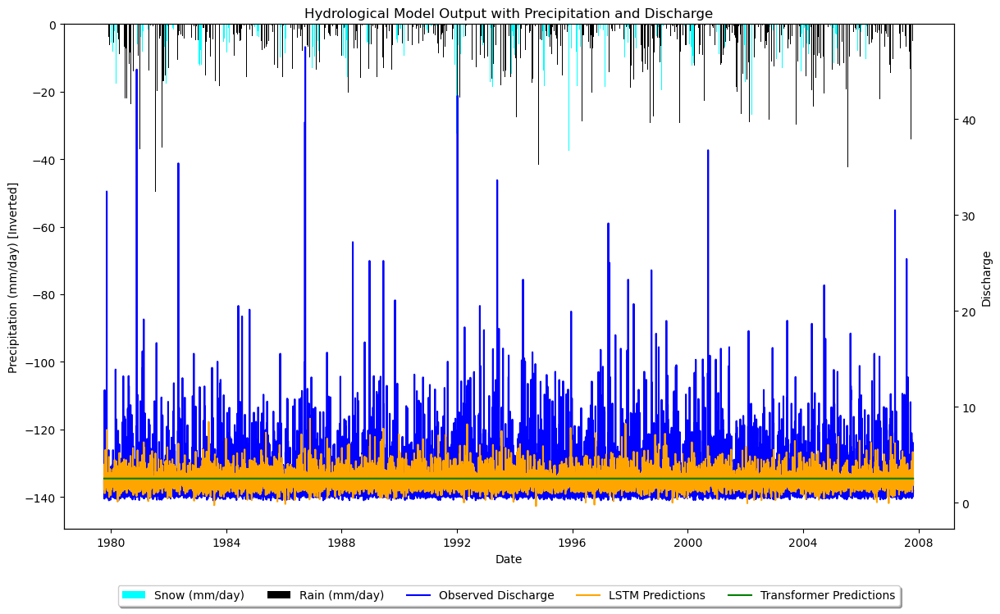

Total days with temperatures below zero (potential snow days): 563


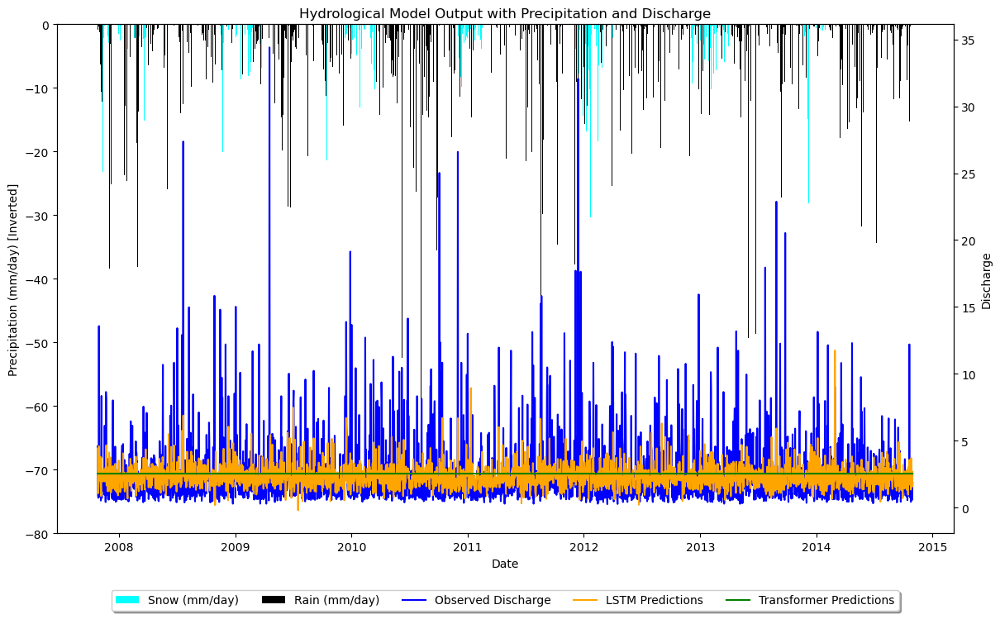


Training Basin 23: 301_Jerice

301_Jerice - Basic Statistical Analysis:
Mean Temperature: 5.313804135778384
Mean Precipitation: 3.355957861880609
Mean Discharge: 1.2579170503316426
Temperature Standard Deviation: 7.888714558849801
Precipitation Standard Deviation: 6.989966848241078
Discharge Standard Deviation: 1.8693331747571325
Discharge Quantiles: 0.25    0.502
0.50    0.819
0.75    1.387
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
301_Jerice - LSTM Train NSE: 0.242
301_Jerice - Transformer Train NSE: -0.097
301_Jerice - LSTM Test NSE: 0.268
301_Jerice - Transformer Test NSE: -0.142
Total days with temperatures below zero (potential snow days): 2930


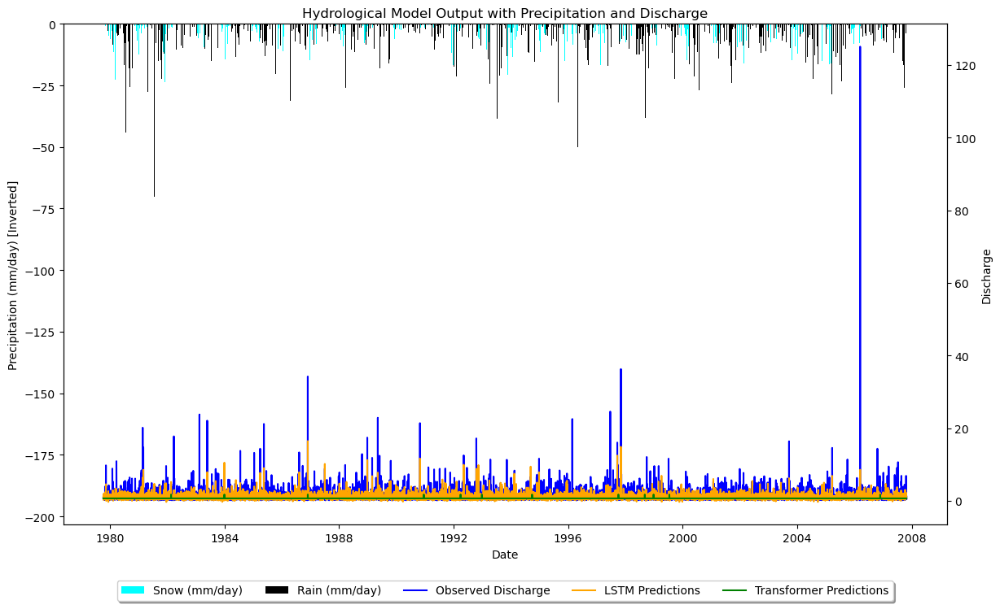

Total days with temperatures below zero (potential snow days): 639


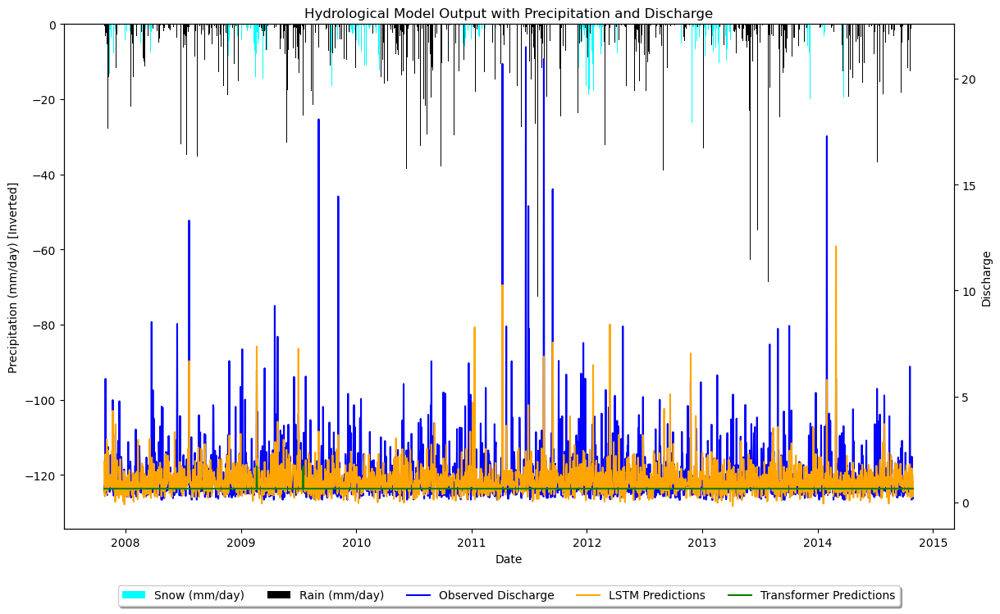


Training Basin 24: 611_Lesti

611_Lesti - Basic Statistical Analysis:
Mean Temperature: 7.788084276238782
Mean Precipitation: 3.06538431525556
Mean Discharge: 1.4866935622317599
Temperature Standard Deviation: 8.14585525866932
Precipitation Standard Deviation: 6.807939367616383
Discharge Standard Deviation: 2.7572559548061095
Discharge Quantiles: 0.25    0.366
0.50    0.698
0.75    1.578
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
611_Lesti - LSTM Train NSE: 0.312
611_Lesti - Transformer Train NSE: -0.043
611_Lesti - LSTM Test NSE: 0.221
611_Lesti - Transformer Test NSE: 0.035
Total days with temperatures below zero (potential snow days): 1929


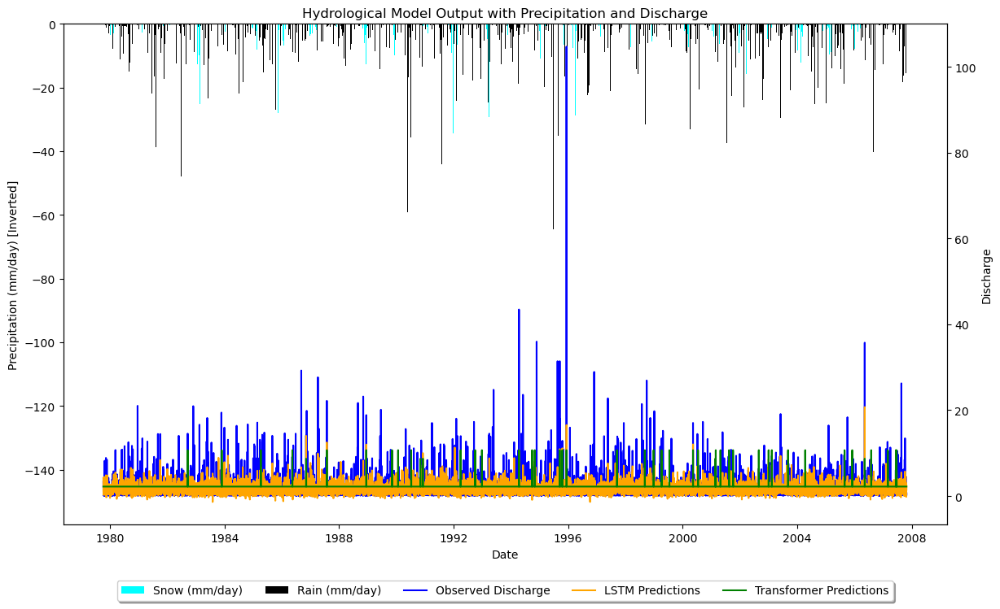

Total days with temperatures below zero (potential snow days): 414


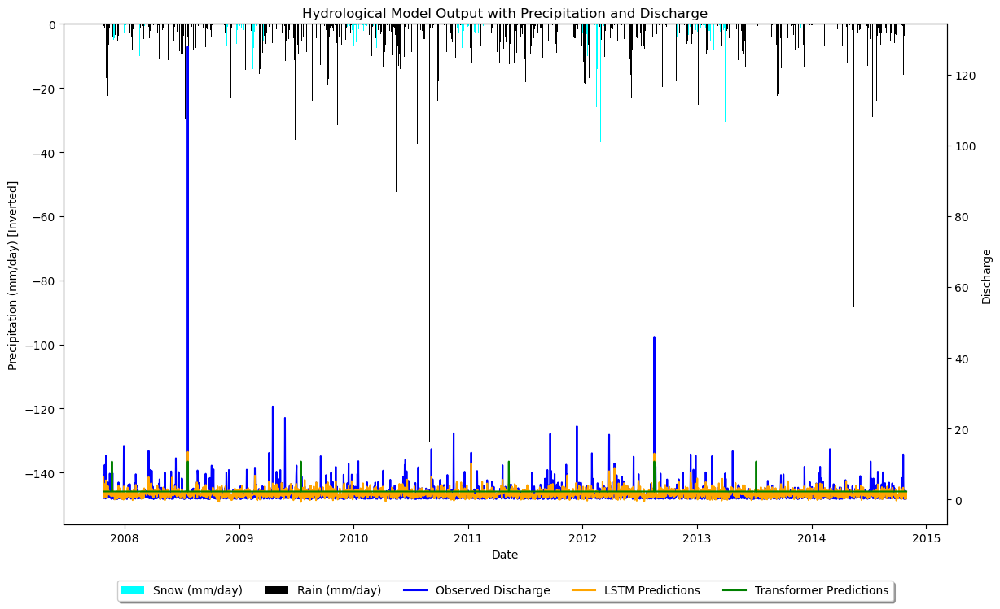


Training Basin 25: 403_Zdobnice

403_Zdobnice - Basic Statistical Analysis:
Mean Temperature: 7.201451424112369
Mean Precipitation: 3.0625985173624657
Mean Discharge: 2.006898088177916
Temperature Standard Deviation: 8.26960164097481
Precipitation Standard Deviation: 6.581224289392818
Discharge Standard Deviation: 2.3398468890280424
Discharge Quantiles: 0.25    0.740
0.50    1.223
0.75    2.394
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
403_Zdobnice - LSTM Train NSE: 0.114
403_Zdobnice - Transformer Train NSE: -0.071
403_Zdobnice - LSTM Test NSE: 0.045
403_Zdobnice - Transformer Test NSE: -0.103
Total days with temperatures below zero (potential snow days): 2306


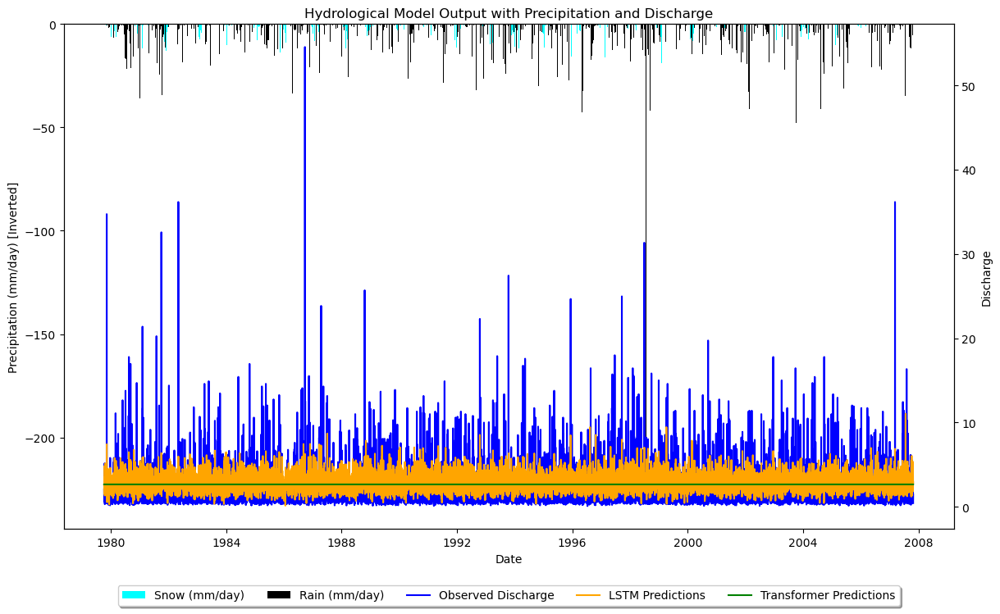

Total days with temperatures below zero (potential snow days): 522


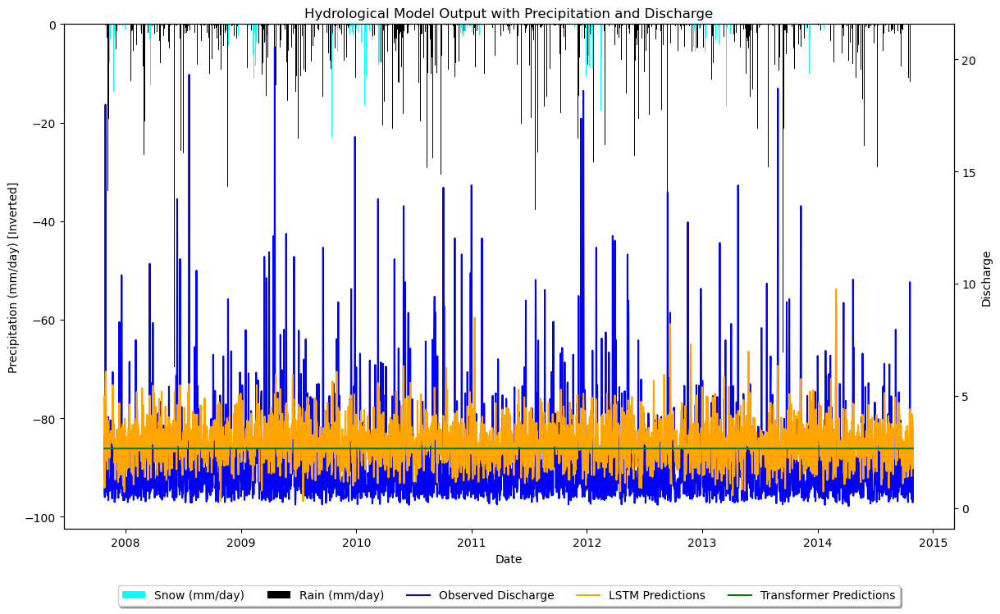


Training Basin 26: 107_Tepla_Vltava

107_Tepla_Vltava - Basic Statistical Analysis:
Mean Temperature: 5.822629730784238
Mean Precipitation: 2.3626219274287945
Mean Discharge: 1.483062114709325
Temperature Standard Deviation: 7.759383960052831
Precipitation Standard Deviation: 5.188586150868839
Discharge Standard Deviation: 1.4656230848649667
Discharge Quantiles: 0.25    0.717
0.50    1.031
0.75    1.738
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
107_Tepla_Vltava - LSTM Train NSE: 0.284
107_Tepla_Vltava - Transformer Train NSE: -0.044
107_Tepla_Vltava - LSTM Test NSE: 0.304
107_Tepla_Vltava - Transformer Test NSE: -0.038
Total days with temperatures below zero (potential snow days): 2466


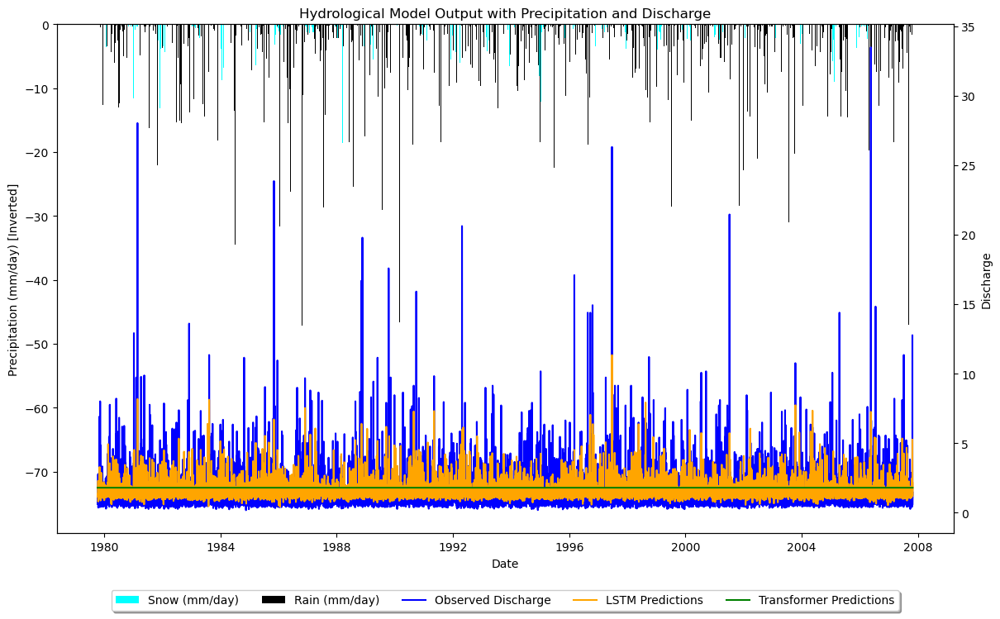

Total days with temperatures below zero (potential snow days): 600


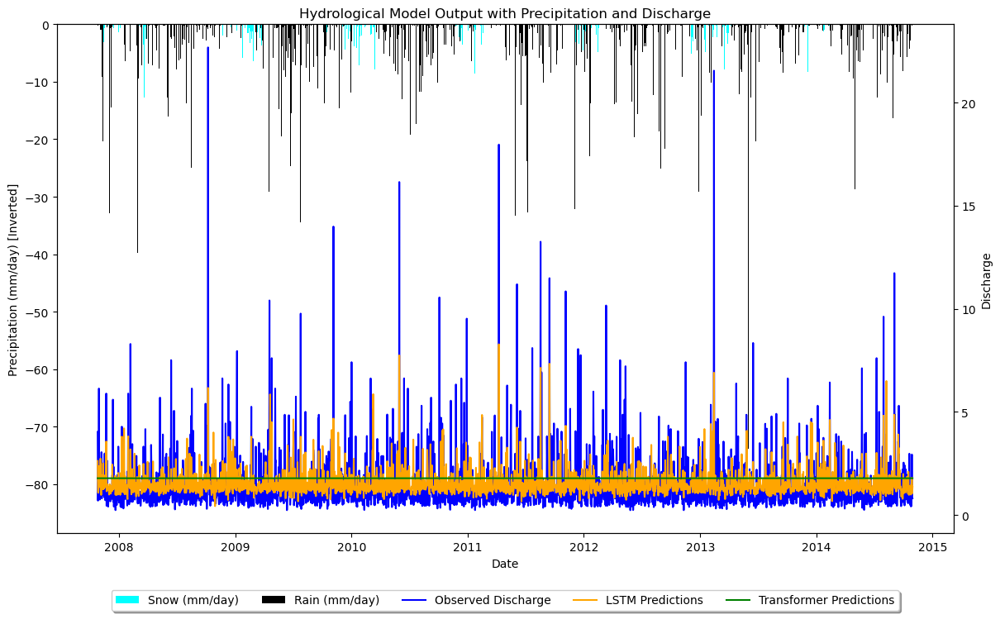


Training Basin 27: 401_Bela

401_Bela - Basic Statistical Analysis:
Mean Temperature: 7.201451424112369
Mean Precipitation: 3.0625985173624657
Mean Discharge: 1.0536520483808036
Temperature Standard Deviation: 8.26960164097481
Precipitation Standard Deviation: 6.581224289392818
Discharge Standard Deviation: 1.392974397368794
Discharge Quantiles: 0.25    0.359
0.50    0.658
0.75    1.231
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
401_Bela - LSTM Train NSE: 0.264
401_Bela - Transformer Train NSE: -0.016
401_Bela - LSTM Test NSE: 0.244
401_Bela - Transformer Test NSE: -0.011
Total days with temperatures below zero (potential snow days): 2306


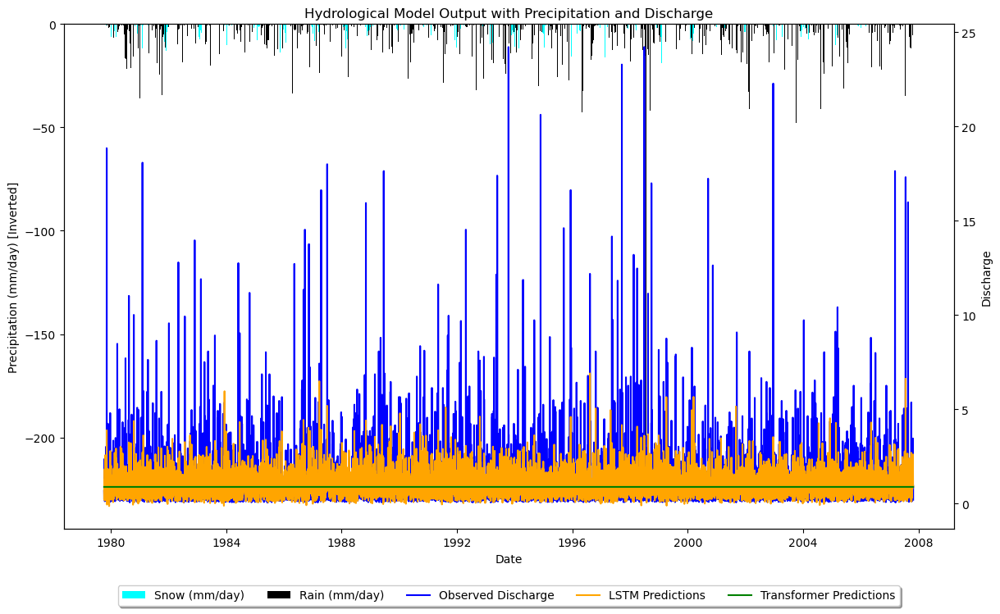

Total days with temperatures below zero (potential snow days): 522


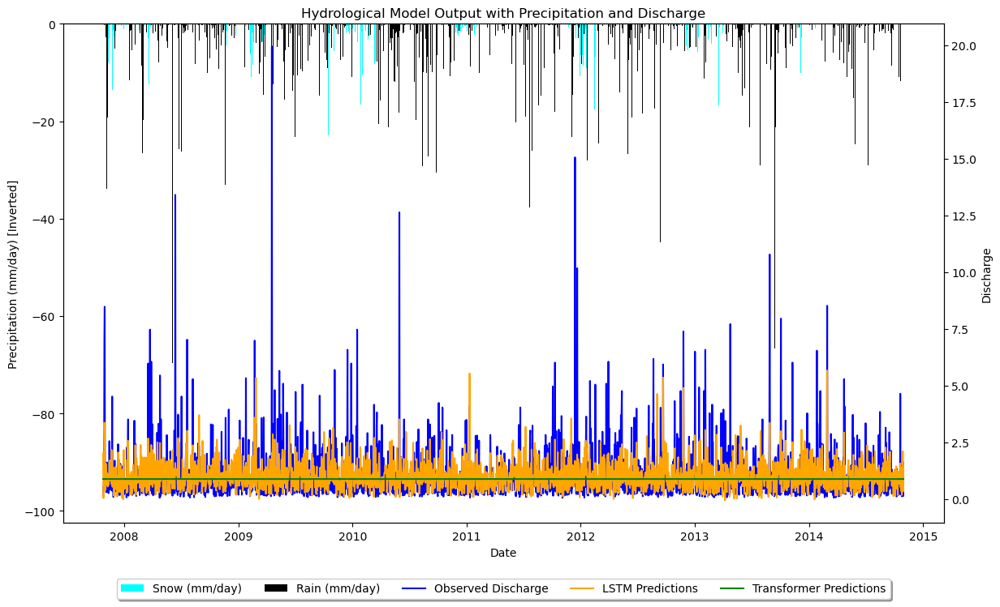


Training Basin 28: 110_Stassky_potok

110_Stassky_potok - Basic Statistical Analysis:
Mean Temperature: 4.868638314475224
Mean Precipitation: 3.0550682793601247
Mean Discharge: 1.3532540443663323
Temperature Standard Deviation: 7.695653818627724
Precipitation Standard Deviation: 6.269507271155537
Discharge Standard Deviation: 1.2340989916849643
Discharge Quantiles: 0.25    0.698
0.50    1.012
0.75    1.615
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
110_Stassky_potok - LSTM Train NSE: 0.249
110_Stassky_potok - Transformer Train NSE: -0.010
110_Stassky_potok - LSTM Test NSE: 0.234
110_Stassky_potok - Transformer Test NSE: -0.003
Total days with temperatures below zero (potential snow days): 3016


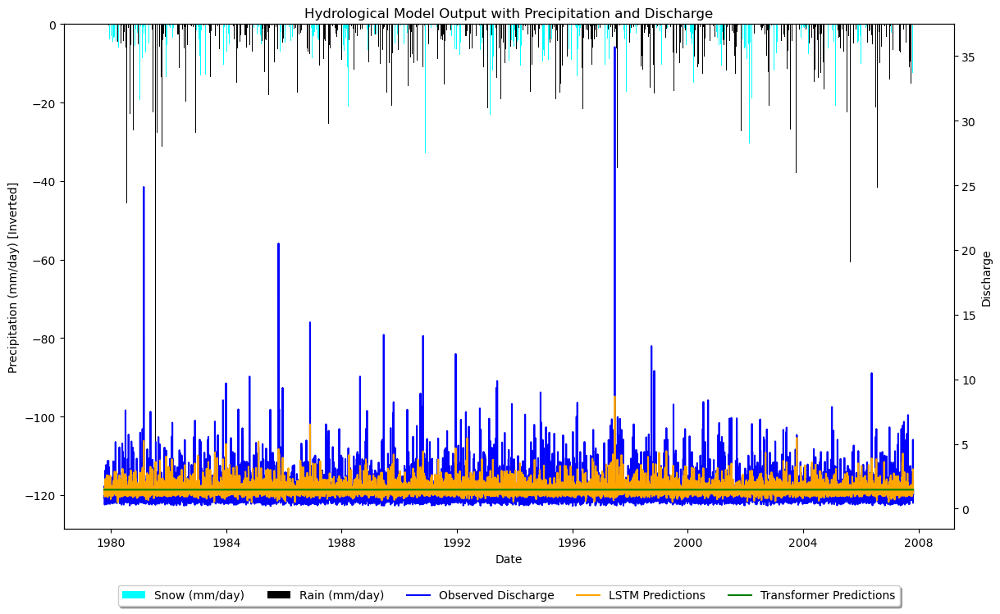

Total days with temperatures below zero (potential snow days): 647


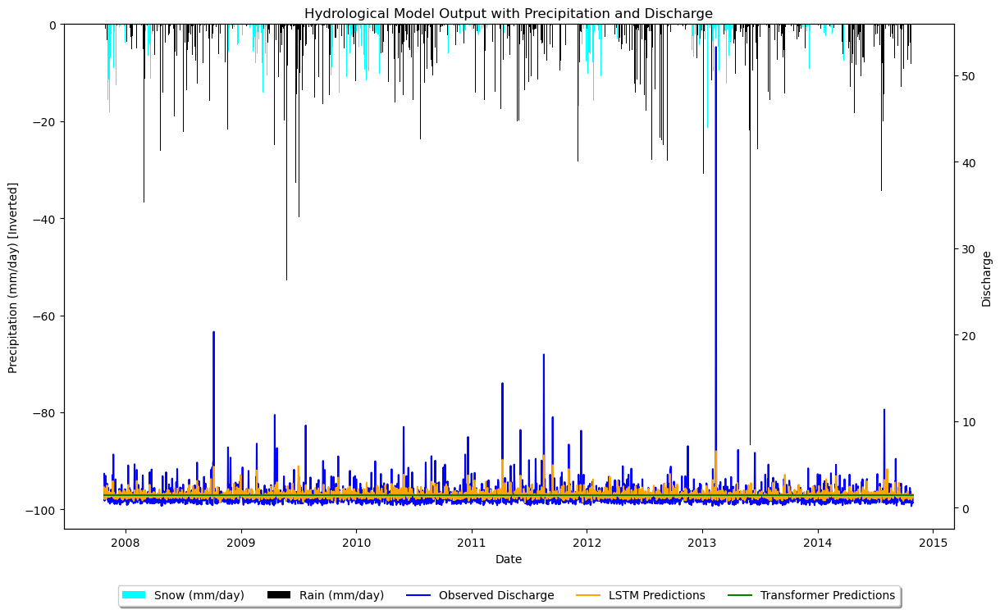


Training Basin 29: 113_Schwarzach

113_Schwarzach - Basic Statistical Analysis:
Mean Temperature: 8.39698795180723
Mean Precipitation: 2.3017312949276096
Mean Discharge: 1.177506001691794
Temperature Standard Deviation: 7.9315680173371454
Precipitation Standard Deviation: 4.879498066558739
Discharge Standard Deviation: 1.3147646317603725
Discharge Quantiles: 0.25    0.541
0.50    0.799
0.75    1.356
Name: Q, dtype: float64

494/494 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step
494/494 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
113_Schwarzach - LSTM Train NSE: 0.343
113_Schwarzach - Transformer Train NSE: -0.000
113_Schwarzach - LSTM Test NSE: 0.336
113_Schwarzach - Transformer Test NSE: -0.001
Total days with temperatures below zero (potential snow days): 2466


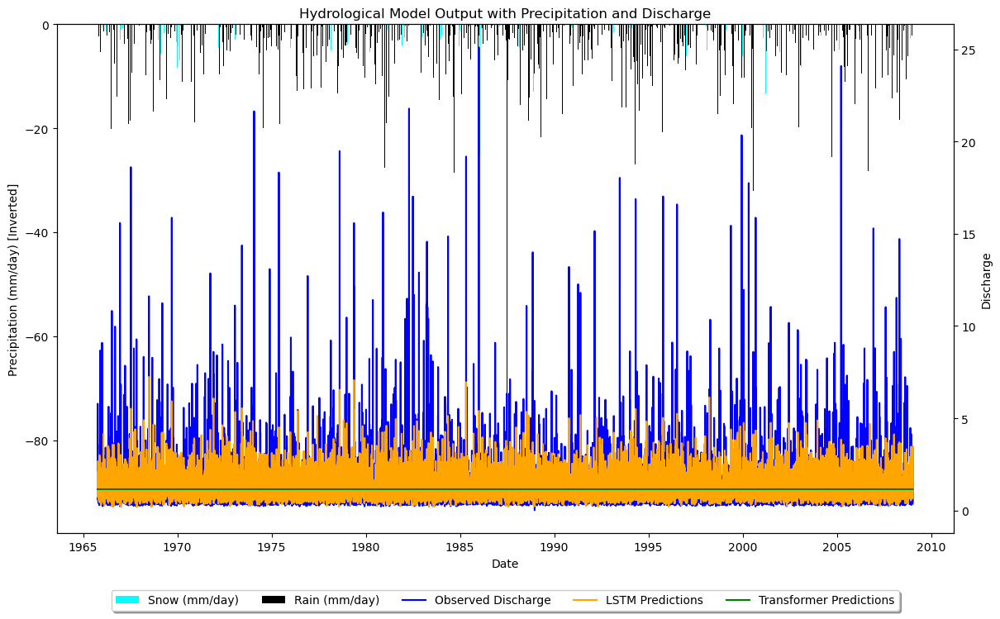

Total days with temperatures below zero (potential snow days): 532


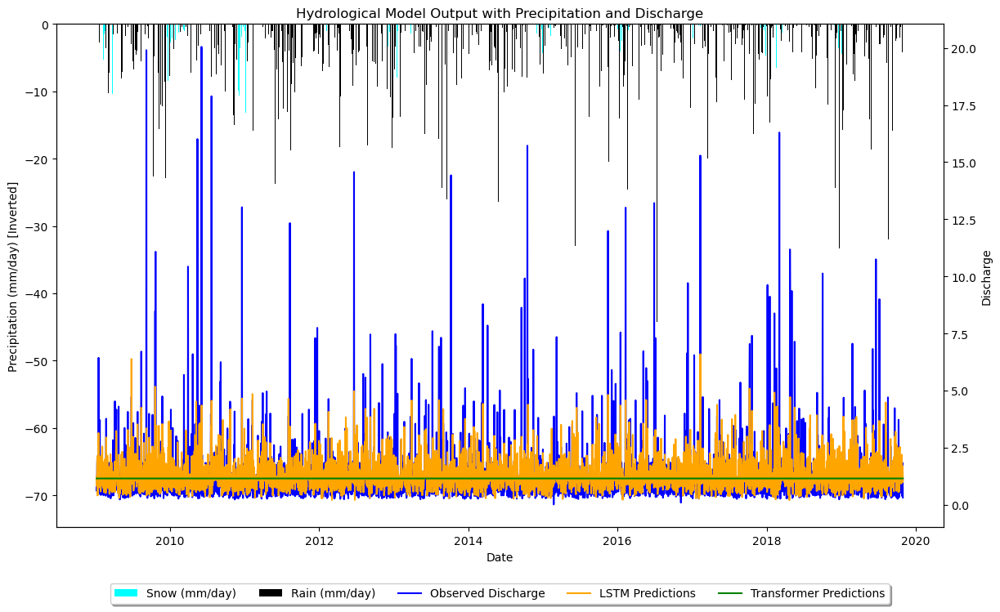


Training Basin 30: 313_Upa

313_Upa - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.2231681623097934
Mean Discharge: 2.709098088177917
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.617562107619908
Discharge Standard Deviation: 2.583727466202987
Discharge Quantiles: 0.25    1.175
0.50    1.876
0.75    3.182
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
313_Upa - LSTM Train NSE: 0.083
313_Upa - Transformer Train NSE: -0.028
313_Upa - LSTM Test NSE: 0.122
313_Upa - Transformer Test NSE: -0.027
Total days with temperatures below zero (potential snow days): 2556


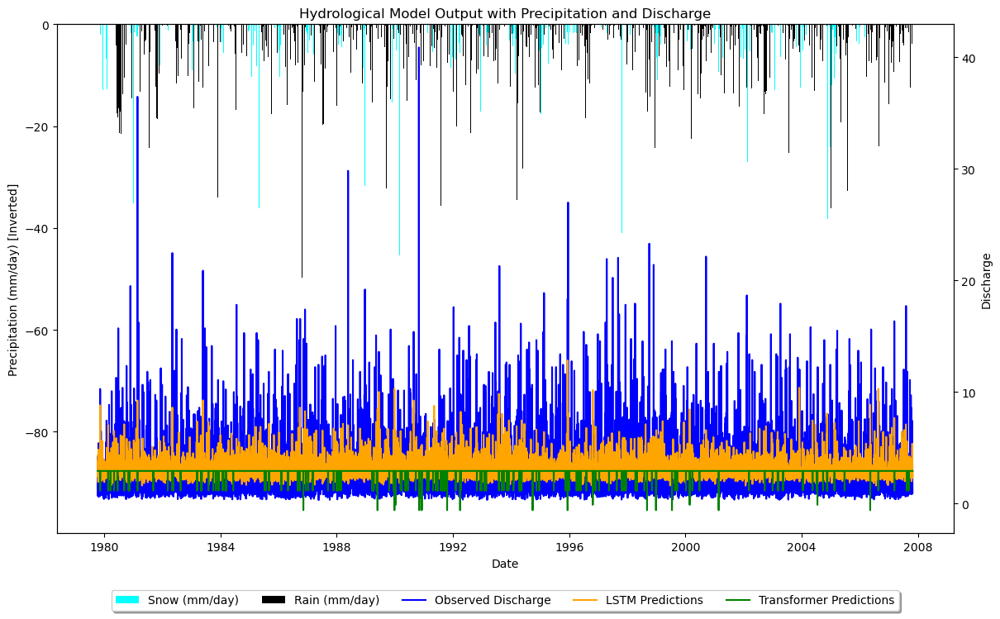

Total days with temperatures below zero (potential snow days): 563


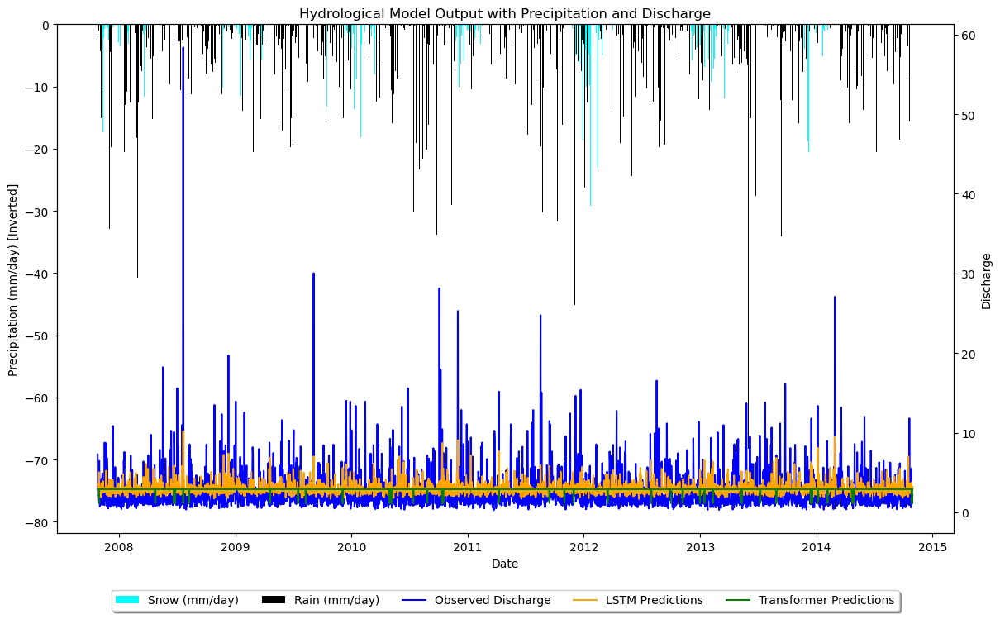


Training Basin 31: 513_Opava

513_Opava - Basic Statistical Analysis:
Mean Temperature: 6.326297307842372
Mean Precipitation: 3.1368162309793215
Mean Discharge: 1.4770746452247012
Temperature Standard Deviation: 8.185740025774647
Precipitation Standard Deviation: 7.128695280522444
Discharge Standard Deviation: 1.7471043523270822
Discharge Quantiles: 0.25    0.733
0.50    1.059
0.75    1.712
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
513_Opava - LSTM Train NSE: 0.350
513_Opava - Transformer Train NSE: -0.004
513_Opava - LSTM Test NSE: 0.314
513_Opava - Transformer Test NSE: -0.002
Total days with temperatures below zero (potential snow days): 2505


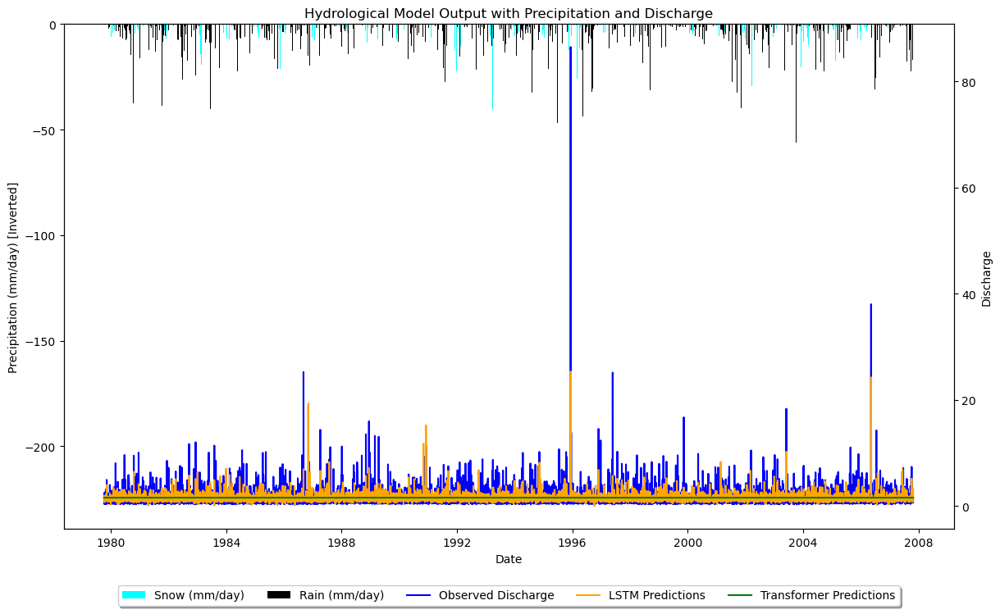

Total days with temperatures below zero (potential snow days): 543


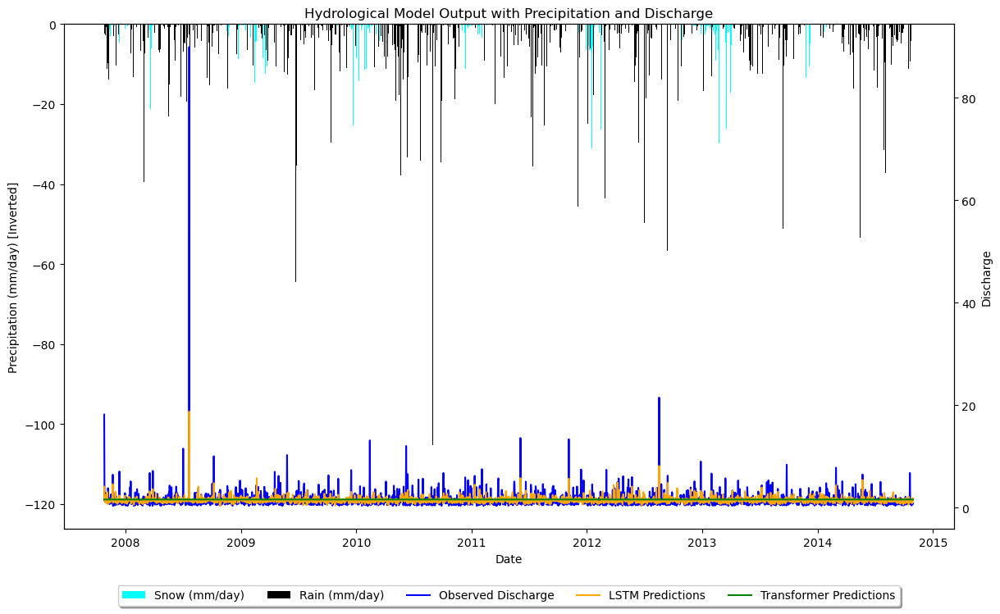


Training Basin 32: 508_Telcsky_potok

508_Telcsky_potok - Basic Statistical Analysis:
Mean Temperature: 7.979843932891144
Mean Precipitation: 3.022294186500195
Mean Discharge: 1.7813353101833787
Temperature Standard Deviation: 8.36514468946334
Precipitation Standard Deviation: 6.6003542464378055
Discharge Standard Deviation: 2.160083858367827
Discharge Quantiles: 0.25    0.828
0.50    1.219
0.75    2.052
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
508_Telcsky_potok - LSTM Train NSE: 0.183
508_Telcsky_potok - Transformer Train NSE: 0.019
508_Telcsky_potok - LSTM Test NSE: 0.164
508_Telcsky_potok - Transformer Test NSE: -0.002
Total days with temperatures below zero (potential snow days): 1868


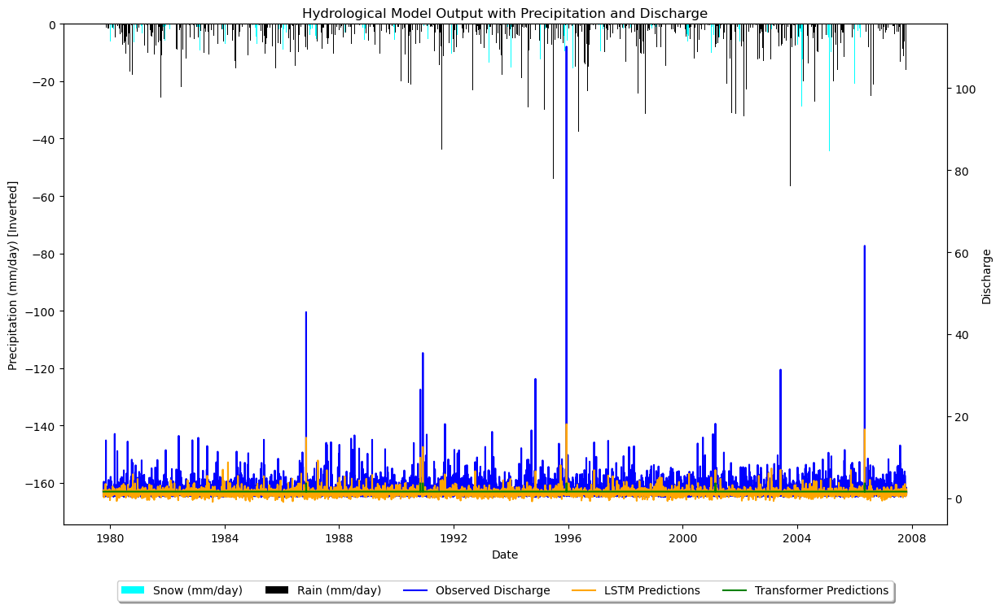

Total days with temperatures below zero (potential snow days): 432


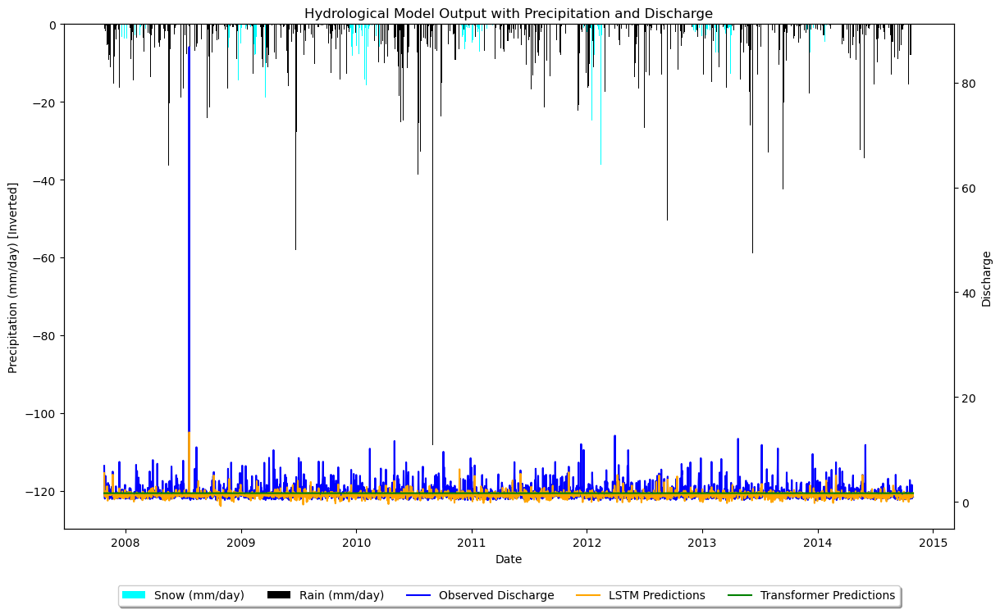


Training Basin 33: 317_Kamenice

317_Kamenice - Basic Statistical Analysis:
Mean Temperature: 5.25481076863051
Mean Precipitation: 3.711517752633633
Mean Discharge: 1.9537208739758098
Temperature Standard Deviation: 7.970379263235973
Precipitation Standard Deviation: 7.318570553577057
Discharge Standard Deviation: 2.404541235071691
Discharge Quantiles: 0.25    0.759
0.50    1.184
0.75    2.165
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
317_Kamenice - LSTM Train NSE: 0.204
317_Kamenice - Transformer Train NSE: -0.006
317_Kamenice - LSTM Test NSE: 0.215
317_Kamenice - Transformer Test NSE: -0.011
Total days with temperatures below zero (potential snow days): 2943


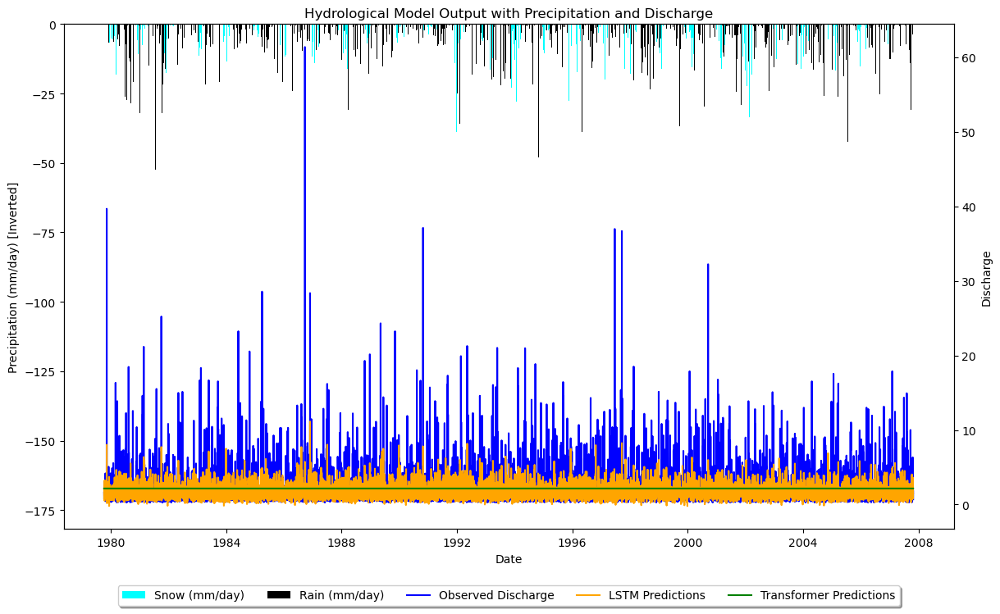

Total days with temperatures below zero (potential snow days): 671


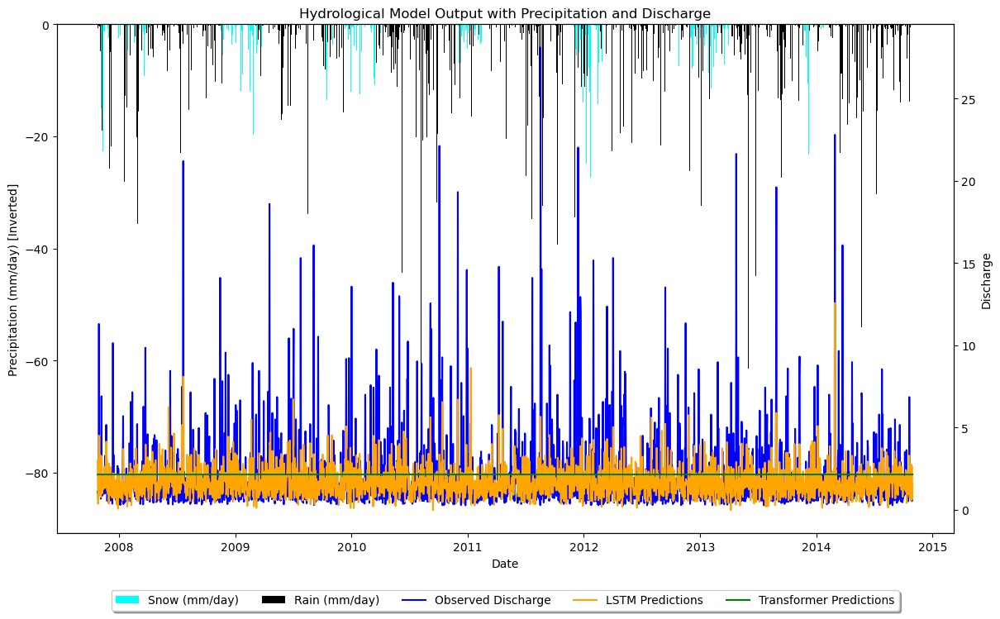


Training Basin 34: 314_Upa

314_Upa - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.2231681623097934
Mean Discharge: 2.357585061637401
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.617562107619908
Discharge Standard Deviation: 2.2251626680562415
Discharge Quantiles: 0.25    1.092
0.50    1.659
0.75    2.733
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
314_Upa - LSTM Train NSE: 0.096
314_Upa - Transformer Train NSE: -0.048
314_Upa - LSTM Test NSE: 0.110
314_Upa - Transformer Test NSE: -0.035
Total days with temperatures below zero (potential snow days): 2556


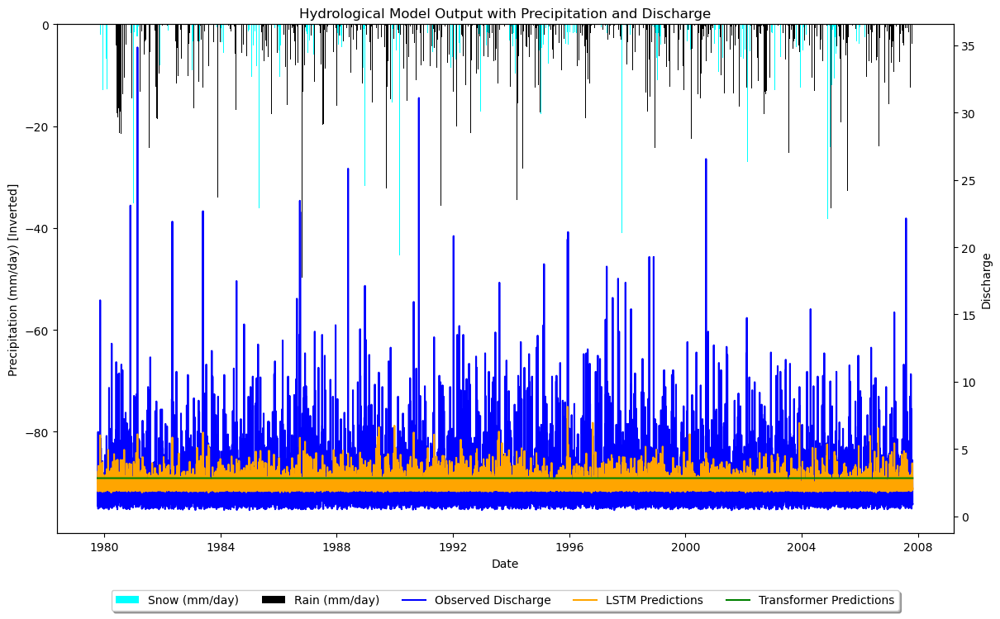

Total days with temperatures below zero (potential snow days): 563


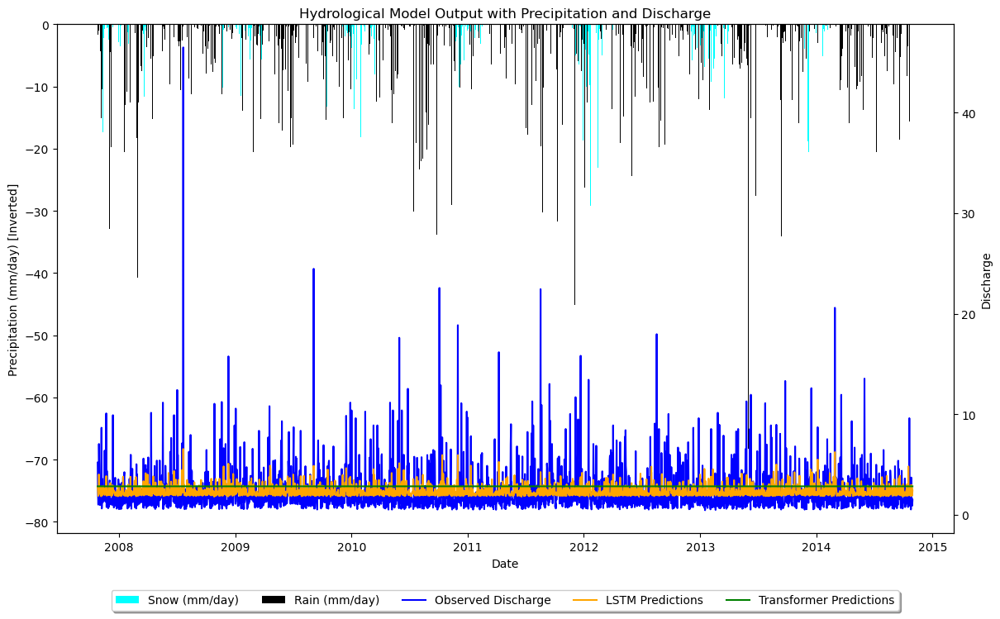


Training Basin 35: 509_Morava

509_Morava - Basic Statistical Analysis:
Mean Temperature: 7.979843932891144
Mean Precipitation: 2.431822083495903
Mean Discharge: 1.5360866172454155
Temperature Standard Deviation: 8.36514468946334
Precipitation Standard Deviation: 5.4530954186824765
Discharge Standard Deviation: 1.528618270449348
Discharge Quantiles: 0.25    0.733
0.50    1.084
0.75    1.814
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
509_Morava - LSTM Train NSE: 0.189
509_Morava - Transformer Train NSE: -0.000
509_Morava - LSTM Test NSE: 0.151
509_Morava - Transformer Test NSE: -0.001
Total days with temperatures below zero (potential snow days): 1868


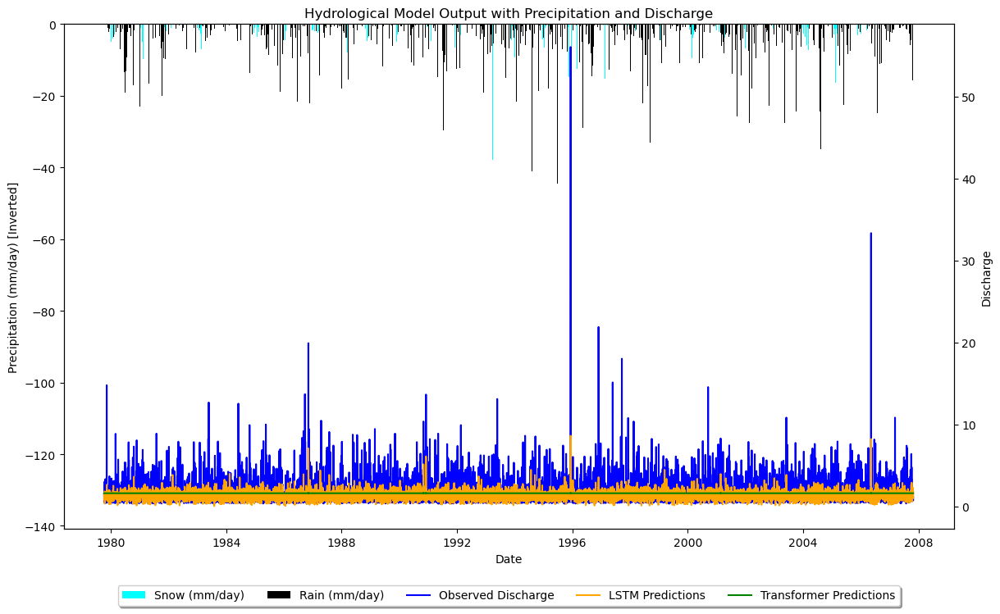

Total days with temperatures below zero (potential snow days): 432


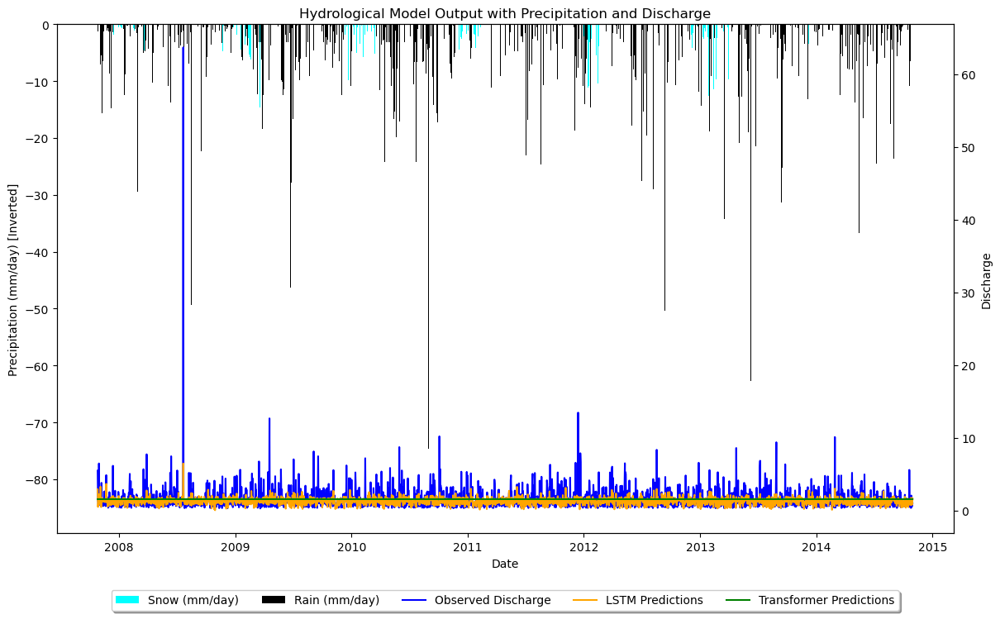


Training Basin 36: 106_Volynka

106_Volynka - Basic Statistical Analysis:
Mean Temperature: 4.868638314475224
Mean Precipitation: 2.100483808037456
Mean Discharge: 0.657078345688646
Temperature Standard Deviation: 7.695653818627724
Precipitation Standard Deviation: 5.078226035034153
Discharge Standard Deviation: 0.8733341021529014
Discharge Quantiles: 0.25    0.252
0.50    0.419
0.75    0.744
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
106_Volynka - LSTM Train NSE: 0.286
106_Volynka - Transformer Train NSE: -0.128
106_Volynka - LSTM Test NSE: 0.336
106_Volynka - Transformer Test NSE: -0.081
Total days with temperatures below zero (potential snow days): 3016


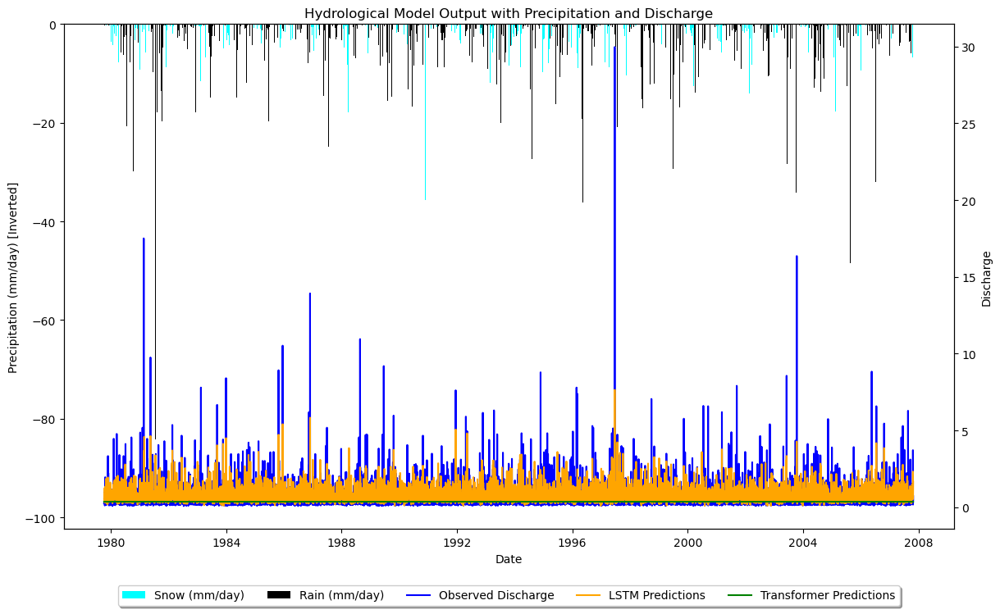

Total days with temperatures below zero (potential snow days): 647


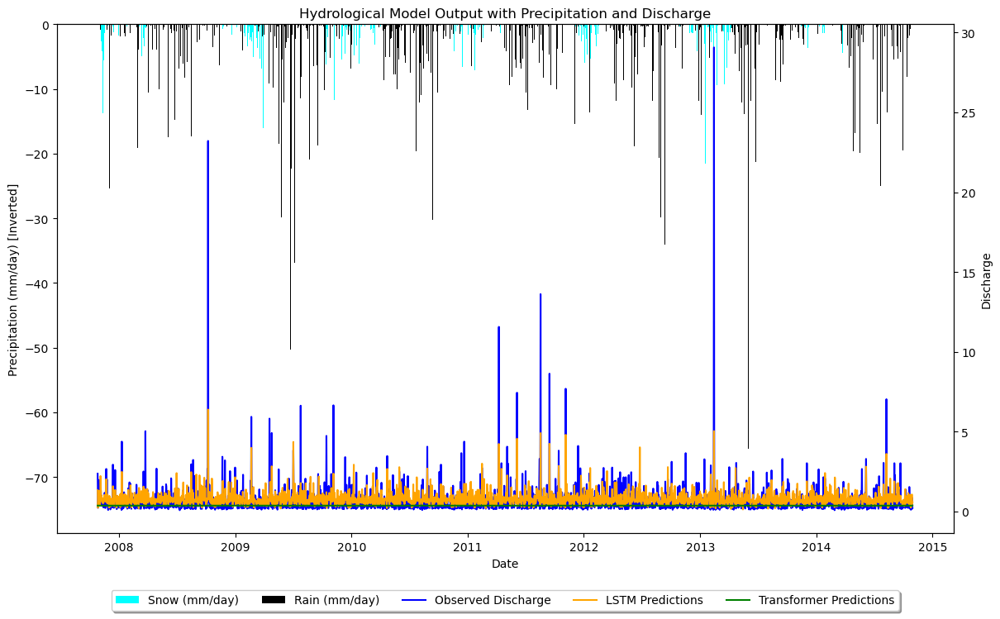


Training Basin 37: 310_Male_Labe

310_Male_Labe - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.2231681623097934
Mean Discharge: 1.9937476394849785
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.617562107619908
Discharge Standard Deviation: 2.1286069055115684
Discharge Quantiles: 0.25    0.807
0.50    1.305
0.75    2.350
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
310_Male_Labe - LSTM Train NSE: 0.193
310_Male_Labe - Transformer Train NSE: -0.003
310_Male_Labe - LSTM Test NSE: 0.175
310_Male_Labe - Transformer Test NSE: -0.001
Total days with temperatures below zero (potential snow days): 2556


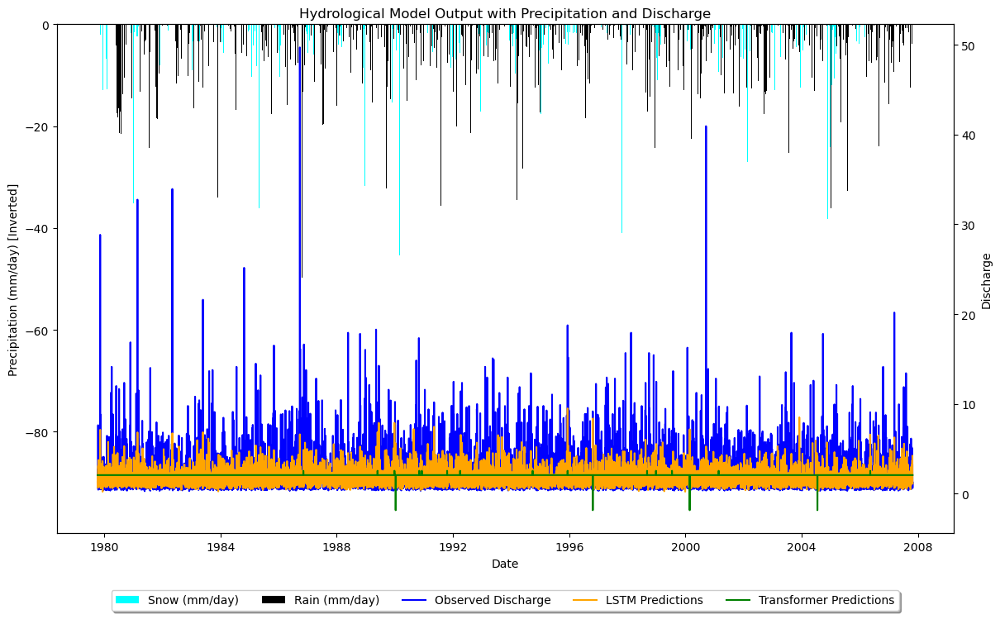

Total days with temperatures below zero (potential snow days): 563


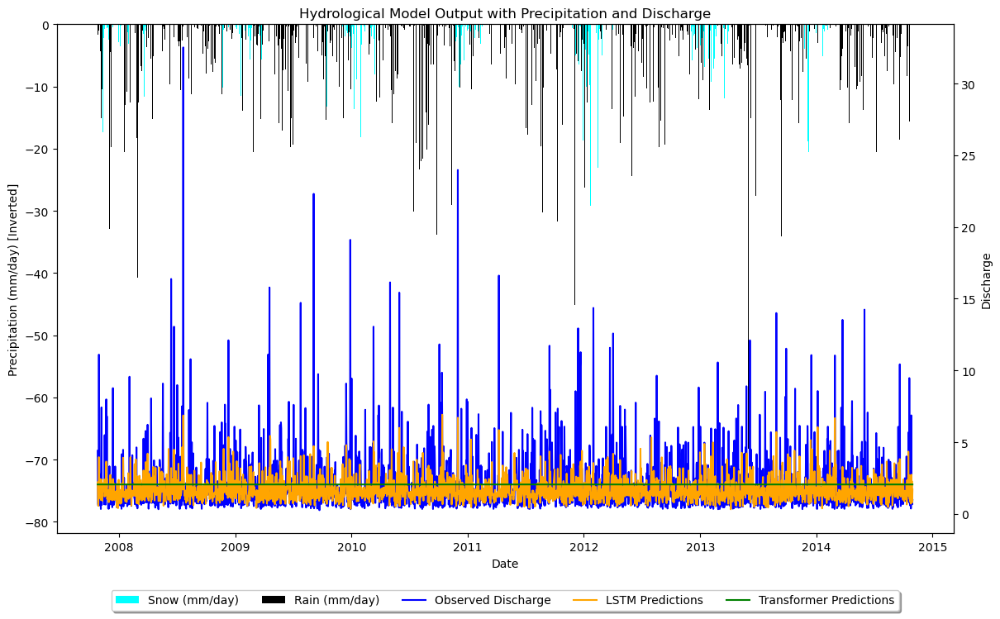


Training Basin 38: 203_Cerna

203_Cerna - Basic Statistical Analysis:
Mean Temperature: 8.422973078423722
Mean Precipitation: 2.5537026921576276
Mean Discharge: 0.7411724923474502
Temperature Standard Deviation: 7.8790997945895604
Precipitation Standard Deviation: 5.091468653730311
Discharge Standard Deviation: 1.6406490536420462
Discharge Quantiles: 0.25    0.245
0.50    0.333
0.75    0.549
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
203_Cerna - LSTM Train NSE: 0.048
203_Cerna - Transformer Train NSE: -0.003
203_Cerna - LSTM Test NSE: 0.044
203_Cerna - Transformer Test NSE: -0.002
Total days with temperatures below zero (potential snow days): 1547


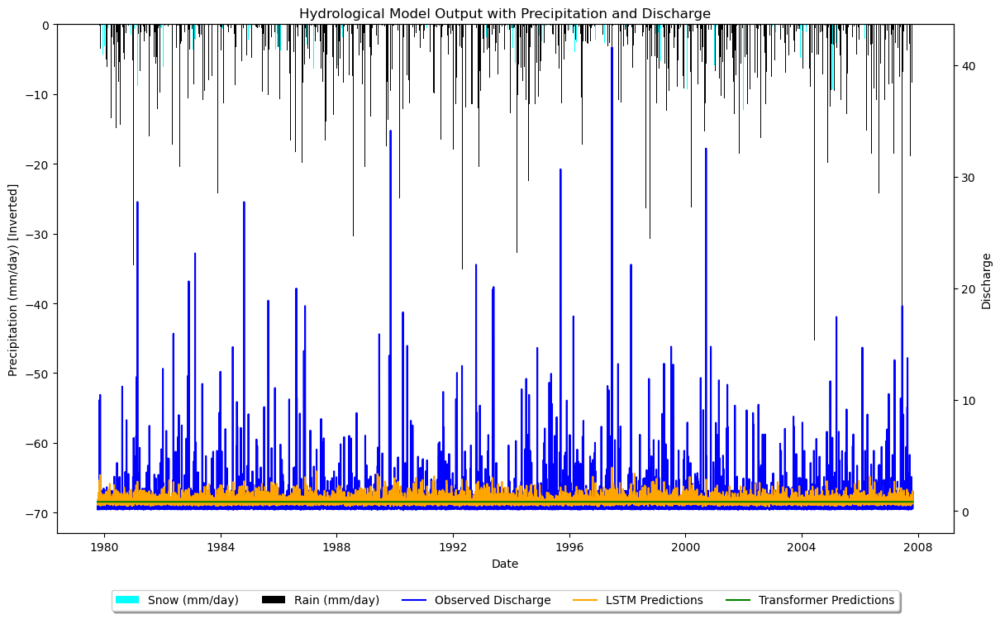

Total days with temperatures below zero (potential snow days): 347


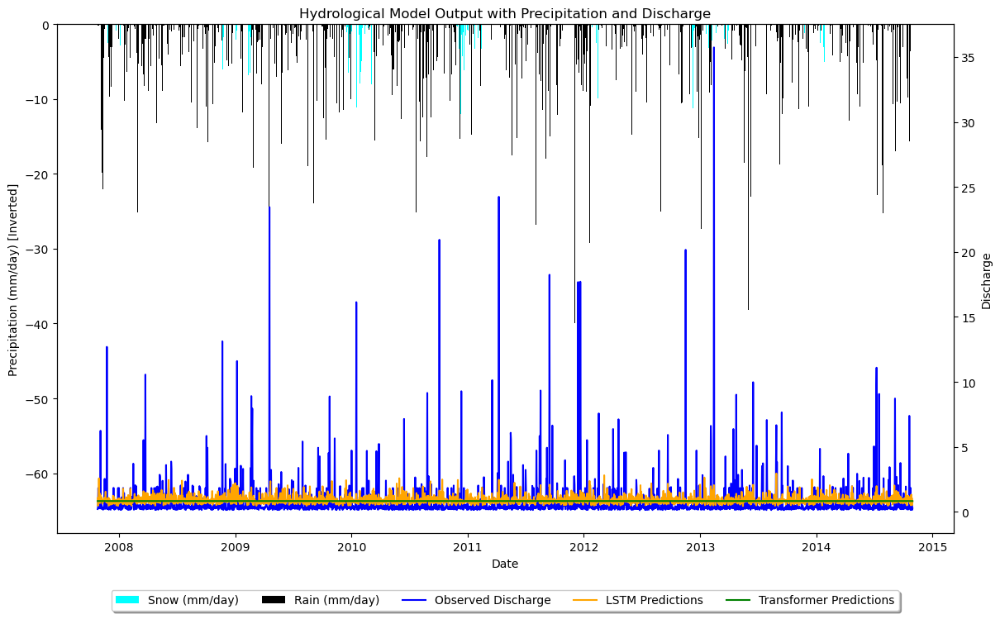


Training Basin 39: 305_Smeda

305_Smeda - Basic Statistical Analysis:
Mean Temperature: 5.313804135778384
Mean Precipitation: 3.355957861880609
Mean Discharge: 1.9389458415819782
Temperature Standard Deviation: 7.888714558849801
Precipitation Standard Deviation: 6.989966848241078
Discharge Standard Deviation: 2.6112482317959804
Discharge Quantiles: 0.25    0.794
0.50    1.309
0.75    2.188
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
305_Smeda - LSTM Train NSE: 0.314
305_Smeda - Transformer Train NSE: -0.038
305_Smeda - LSTM Test NSE: 0.248
305_Smeda - Transformer Test NSE: -0.019
Total days with temperatures below zero (potential snow days): 2930


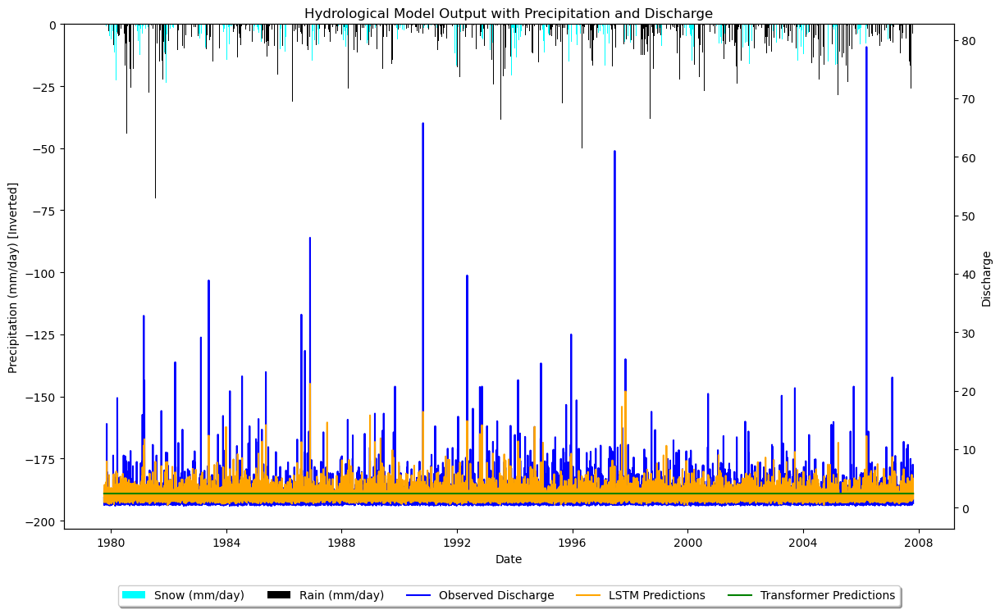

Total days with temperatures below zero (potential snow days): 639


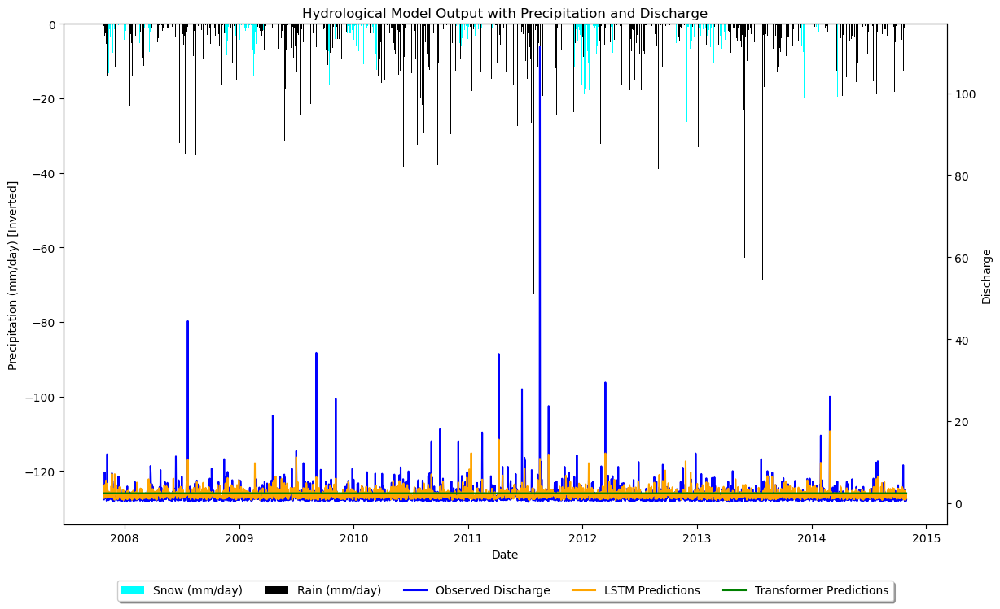


Training Basin 40: 502_Desna

502_Desna - Basic Statistical Analysis:
Mean Temperature: 7.979843932891144
Mean Precipitation: 1.867296137339056
Mean Discharge: 1.3484321498244245
Temperature Standard Deviation: 8.36514468946334
Precipitation Standard Deviation: 4.525176125247118
Discharge Standard Deviation: 1.391774511378354
Discharge Quantiles: 0.25    0.633
0.50    0.945
0.75    1.578
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
502_Desna - LSTM Train NSE: 0.166
502_Desna - Transformer Train NSE: -0.012
502_Desna - LSTM Test NSE: 0.129
502_Desna - Transformer Test NSE: -0.007
Total days with temperatures below zero (potential snow days): 1868


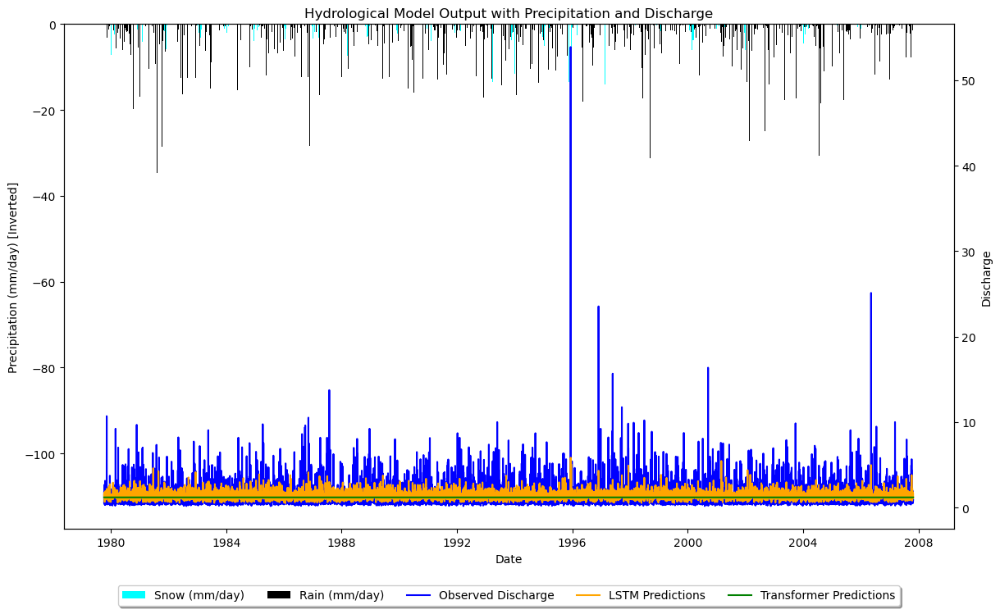

Total days with temperatures below zero (potential snow days): 432


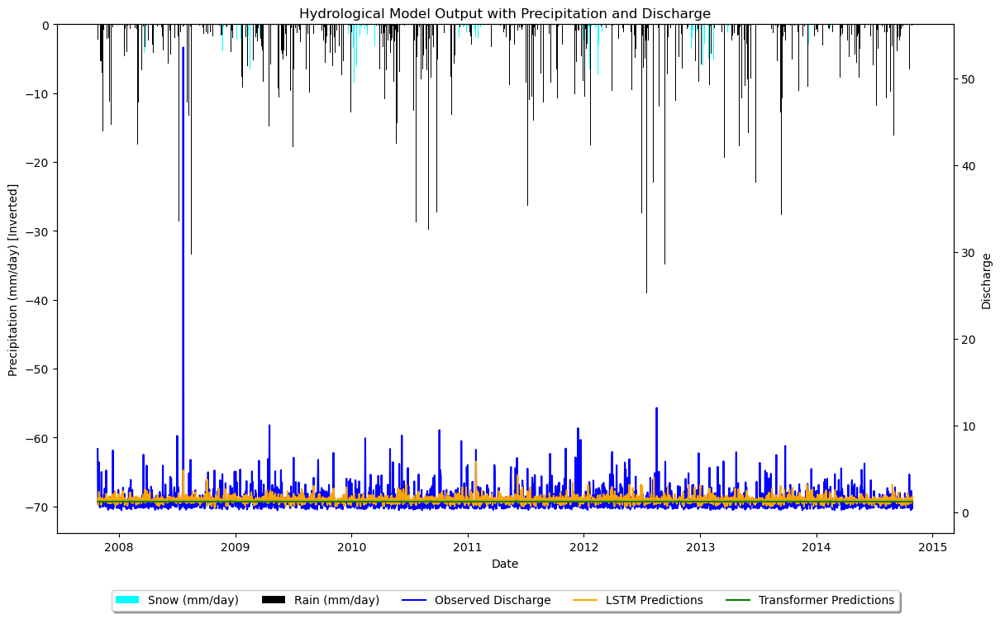


Training Basin 41: 112_Studena_Vltava

112_Studena_Vltava - Basic Statistical Analysis:
Mean Temperature: 5.822629730784238
Mean Precipitation: 2.3626219274287945
Mean Discharge: 1.8188232539992195
Temperature Standard Deviation: 7.759383960052831
Precipitation Standard Deviation: 5.188586150868839
Discharge Standard Deviation: 2.0021992214530684
Discharge Quantiles: 0.25    0.768
0.50    1.139
0.75    2.067
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
112_Studena_Vltava - LSTM Train NSE: 0.292
112_Studena_Vltava - Transformer Train NSE: -0.002
112_Studena_Vltava - LSTM Test NSE: 0.273
112_Studena_Vltava - Transformer Test NSE: -0.003
Total days with temperatures below zero (potential snow days): 2466


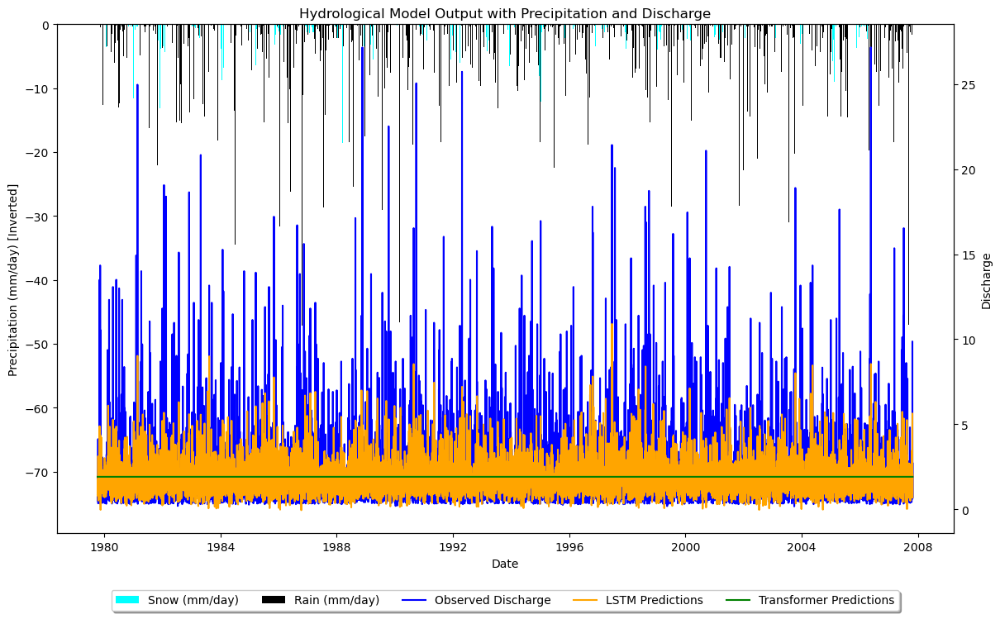

Total days with temperatures below zero (potential snow days): 600


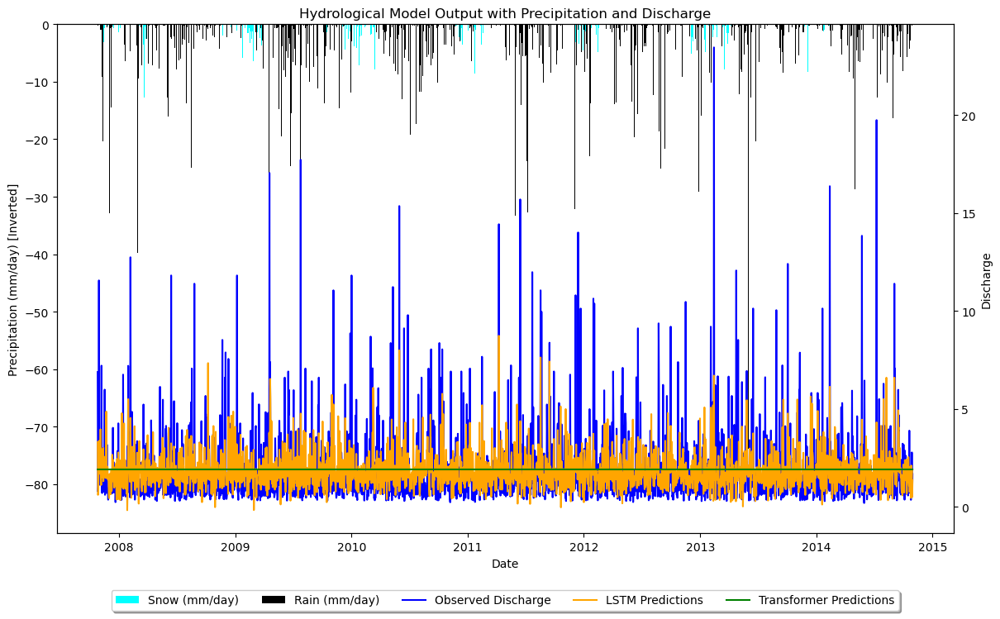


Training Basin 42: 402_Knezna

402_Knezna - Basic Statistical Analysis:
Mean Temperature: 7.201451424112369
Mean Precipitation: 3.0625985173624657
Mean Discharge: 1.0627641825985172
Temperature Standard Deviation: 8.26960164097481
Precipitation Standard Deviation: 6.581224289392818
Discharge Standard Deviation: 1.4987833022764647
Discharge Quantiles: 0.25    0.302
0.50    0.621
0.75    1.283
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
402_Knezna - LSTM Train NSE: 0.209
402_Knezna - Transformer Train NSE: -0.005
402_Knezna - LSTM Test NSE: 0.145
402_Knezna - Transformer Test NSE: -0.020
Total days with temperatures below zero (potential snow days): 2306


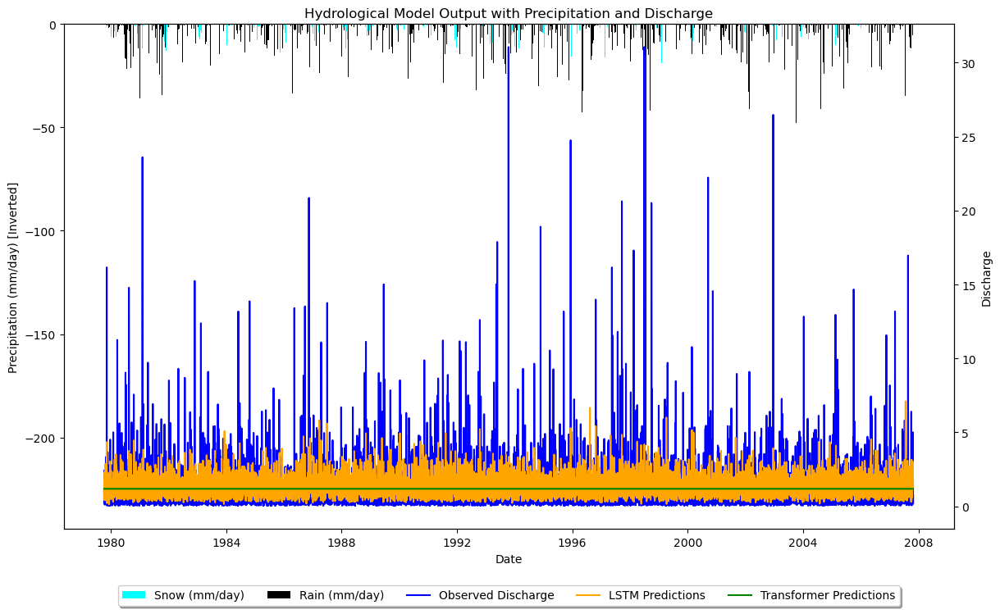

Total days with temperatures below zero (potential snow days): 522


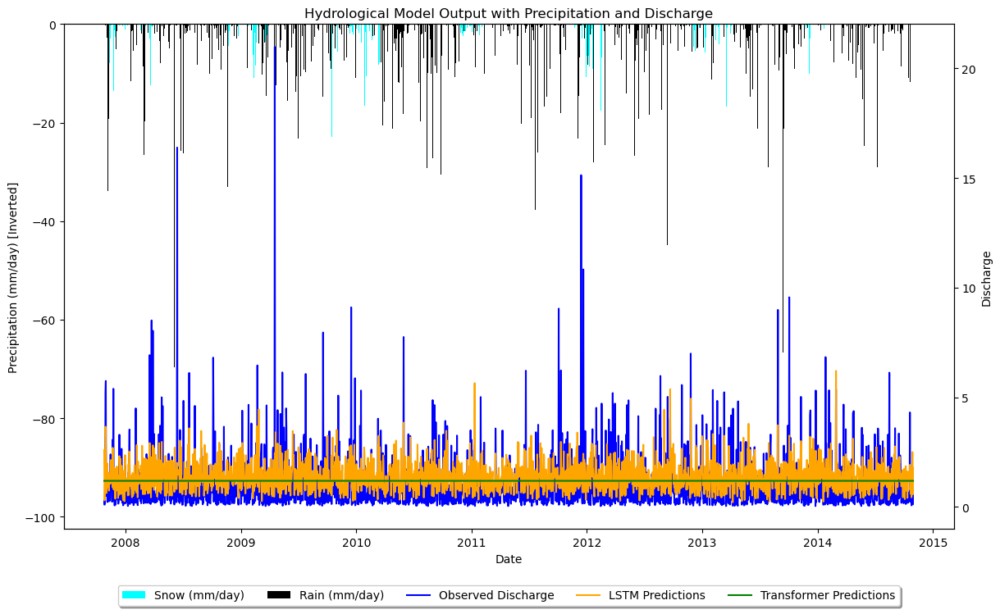


Training Basin 43: 605_Moravka

605_Moravka - Basic Statistical Analysis:
Mean Temperature: 3.272344908310574
Mean Precipitation: 3.8621693328131093
Mean Discharge: 2.3186923136948887
Temperature Standard Deviation: 7.995202923367258
Precipitation Standard Deviation: 9.164753056514472
Discharge Standard Deviation: 3.897785426973518
Discharge Quantiles: 0.25    0.662
0.50    1.245
0.75    2.658
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
605_Moravka - LSTM Train NSE: 0.274
605_Moravka - Transformer Train NSE: -0.002
605_Moravka - LSTM Test NSE: 0.256
605_Moravka - Transformer Test NSE: -0.004
Total days with temperatures below zero (potential snow days): 3812


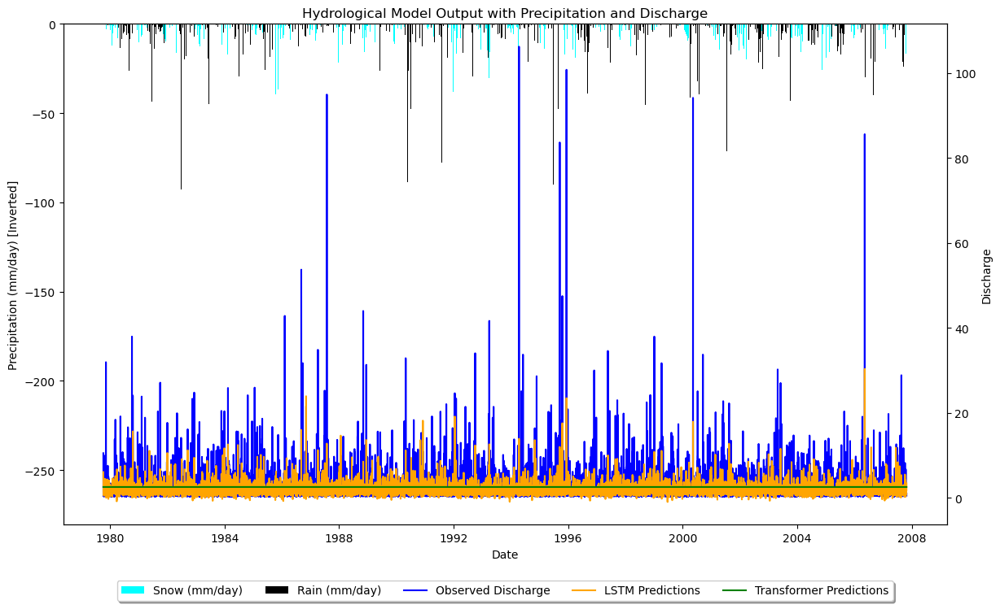

Total days with temperatures below zero (potential snow days): 869


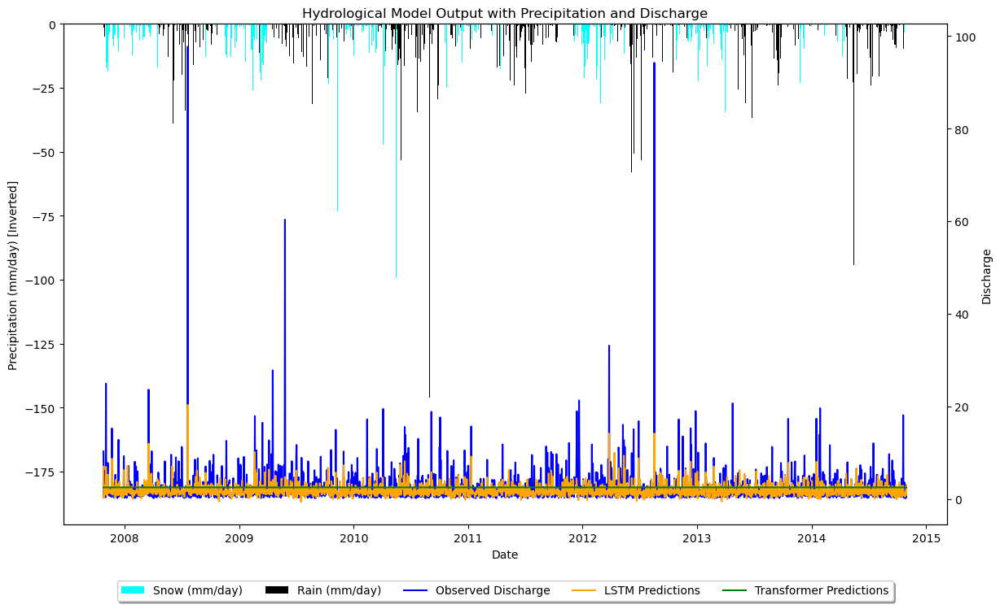


Training Basin 44: 205_Natzschung

205_Natzschung - Basic Statistical Analysis:
Mean Temperature: 6.098547129695252
Mean Precipitation: 2.179755998785056
Mean Discharge: 1.6060374889855067
Temperature Standard Deviation: 7.809715900488548
Precipitation Standard Deviation: 4.847599519535984
Discharge Standard Deviation: 1.7519093588623718
Discharge Quantiles: 0.25    0.613
0.50    1.090
0.75    1.896
Name: Q, dtype: float64

494/494 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step
494/494 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
205_Natzschung - LSTM Train NSE: 0.128
205_Natzschung - Transformer Train NSE: -0.003
205_Natzschung - LSTM Test NSE: 0.142
205_Natzschung - Transformer Test NSE: -0.002
Total days with temperatures below zero (potential snow days): 4088


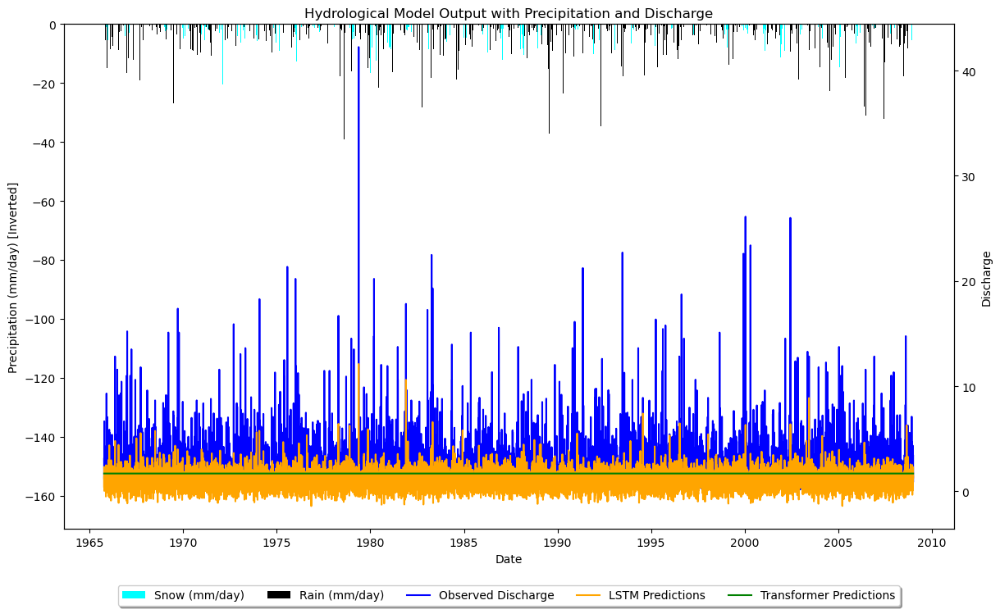

Total days with temperatures below zero (potential snow days): 840


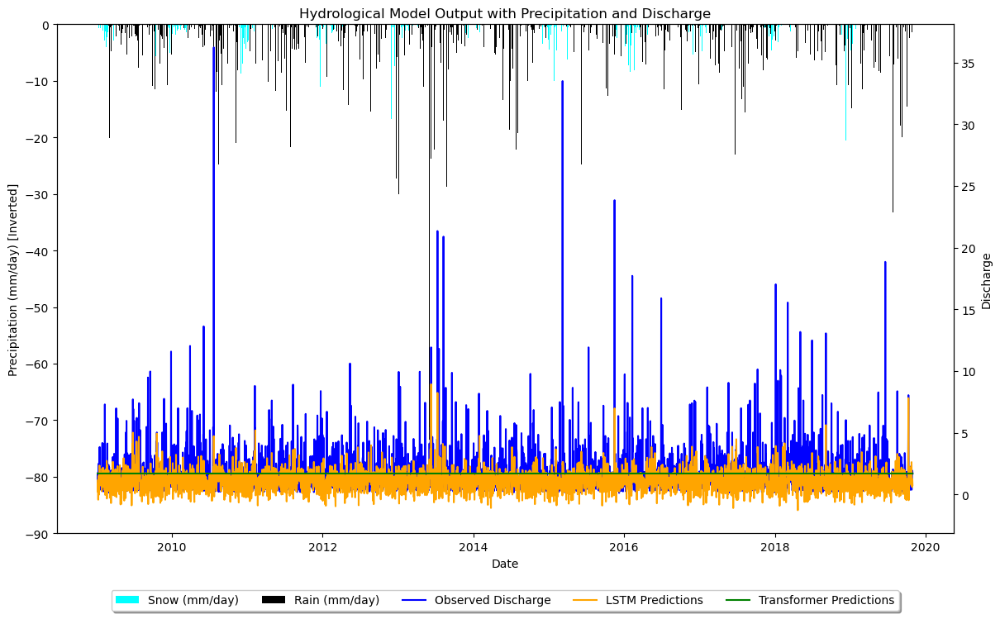


Training Basin 45: 506_Morava

506_Morava - Basic Statistical Analysis:
Mean Temperature: 7.979843932891144
Mean Precipitation: 2.326476785017557
Mean Discharge: 1.6546465079984394
Temperature Standard Deviation: 8.36514468946334
Precipitation Standard Deviation: 5.037494242795941
Discharge Standard Deviation: 1.7493962611869016
Discharge Quantiles: 0.25    0.7475
0.50    1.1370
0.75    1.9970
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
506_Morava - LSTM Train NSE: 0.145
506_Morava - Transformer Train NSE: -0.003
506_Morava - LSTM Test NSE: 0.100
506_Morava - Transformer Test NSE: -0.003
Total days with temperatures below zero (potential snow days): 1868


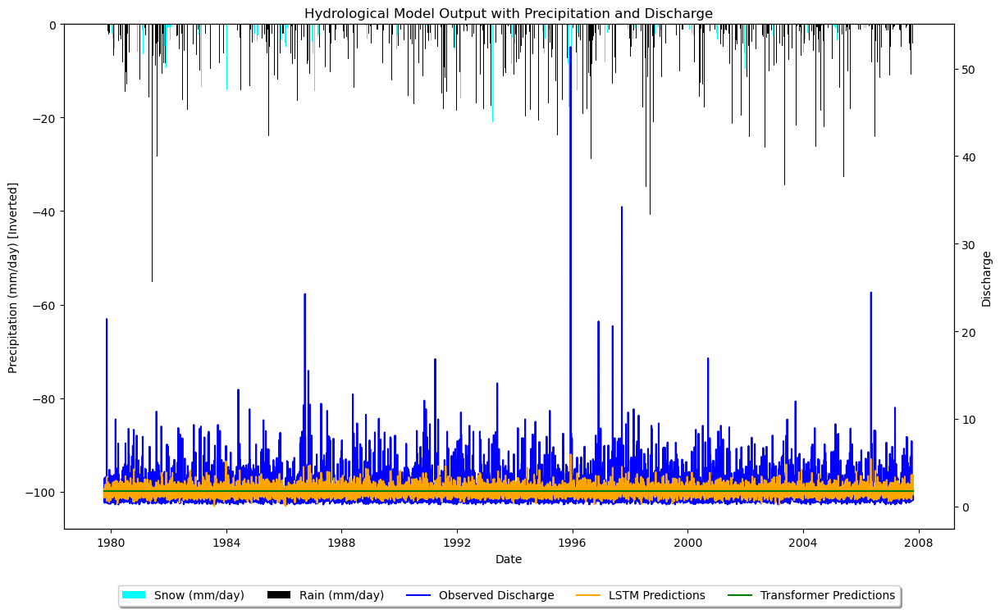

Total days with temperatures below zero (potential snow days): 432


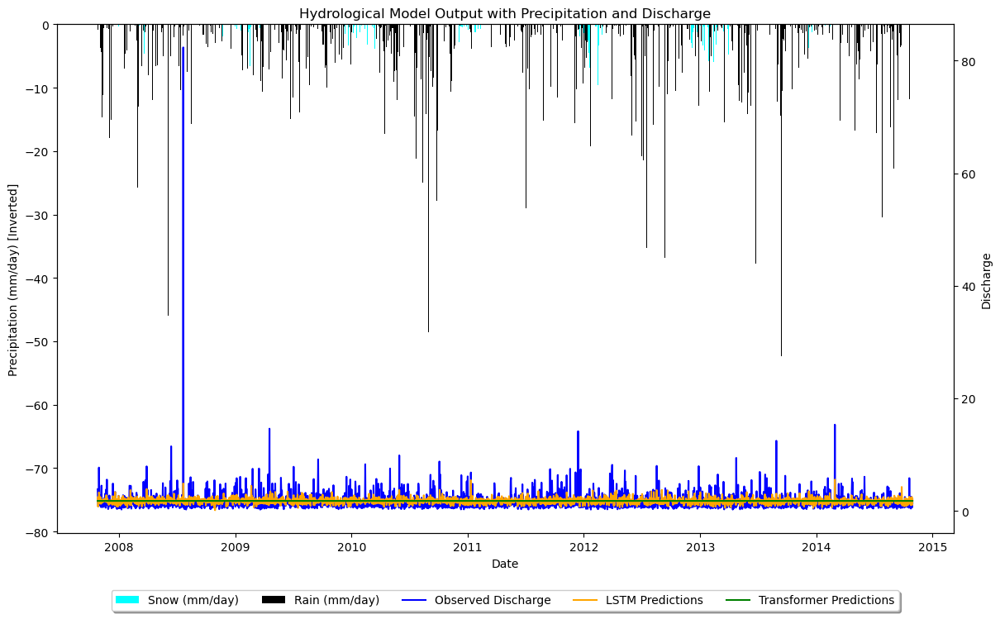


Training Basin 46: 405_Ticha_Orlice

405_Ticha_Orlice - Basic Statistical Analysis:
Mean Temperature: 7.201451424112369
Mean Precipitation: 2.326476785017557
Mean Discharge: 1.40123136948888
Temperature Standard Deviation: 8.26960164097481
Precipitation Standard Deviation: 5.037494242795941
Discharge Standard Deviation: 1.8504762823642888
Discharge Quantiles: 0.25    0.540
0.50    0.921
0.75    1.605
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
405_Ticha_Orlice - LSTM Train NSE: 0.232
405_Ticha_Orlice - Transformer Train NSE: -0.061
405_Ticha_Orlice - LSTM Test NSE: 0.186
405_Ticha_Orlice - Transformer Test NSE: -0.037
Total days with temperatures below zero (potential snow days): 2306


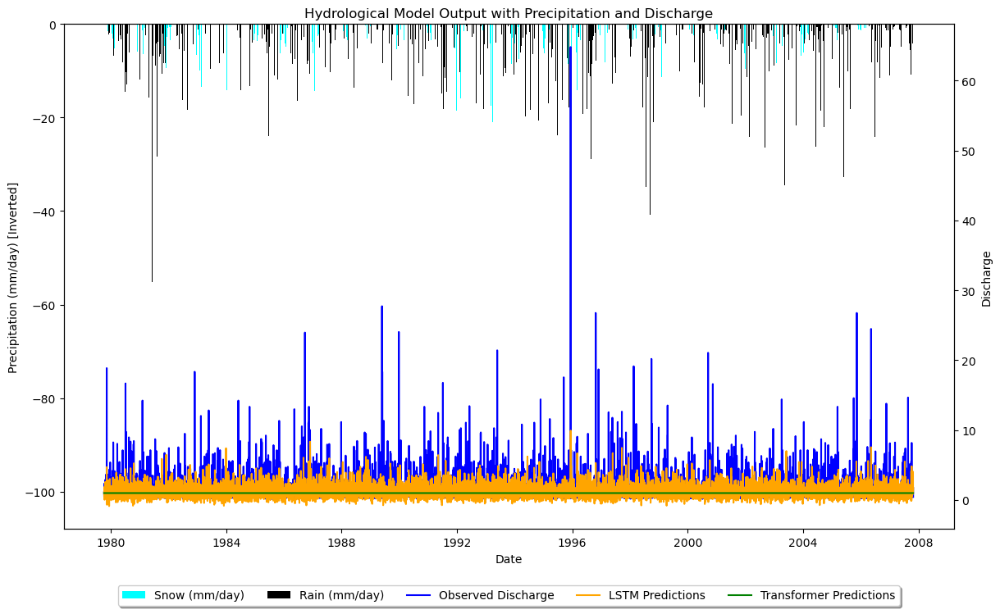

Total days with temperatures below zero (potential snow days): 522


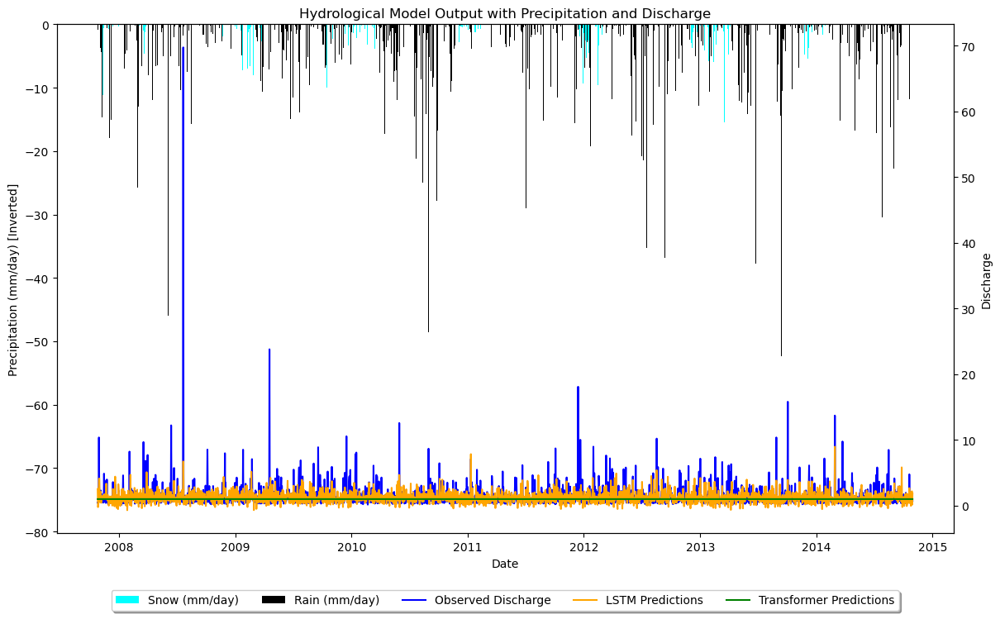


Training Basin 47: 111_Tepla_Vltava

111_Tepla_Vltava - Basic Statistical Analysis:
Mean Temperature: 5.822629730784238
Mean Precipitation: 2.3626219274287945
Mean Discharge: 1.4430366757705813
Temperature Standard Deviation: 7.759383960052831
Precipitation Standard Deviation: 5.188586150868839
Discharge Standard Deviation: 1.4843524006719409
Discharge Quantiles: 0.25    0.6440
0.50    0.9280
0.75    1.6185
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
111_Tepla_Vltava - LSTM Train NSE: 0.322
111_Tepla_Vltava - Transformer Train NSE: -0.002
111_Tepla_Vltava - LSTM Test NSE: 0.303
111_Tepla_Vltava - Transformer Test NSE: -0.004
Total days with temperatures below zero (potential snow days): 2466


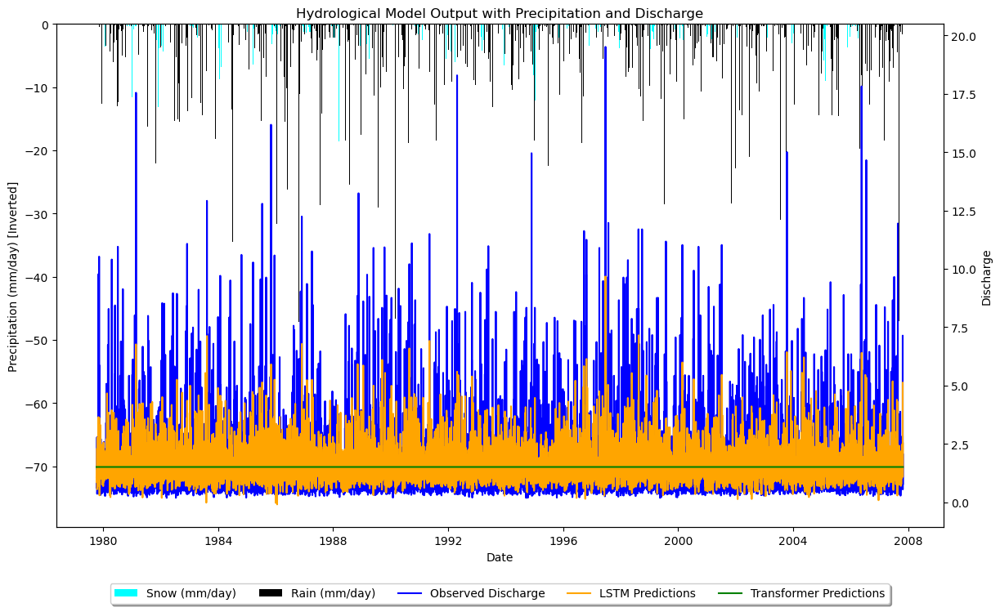

Total days with temperatures below zero (potential snow days): 600


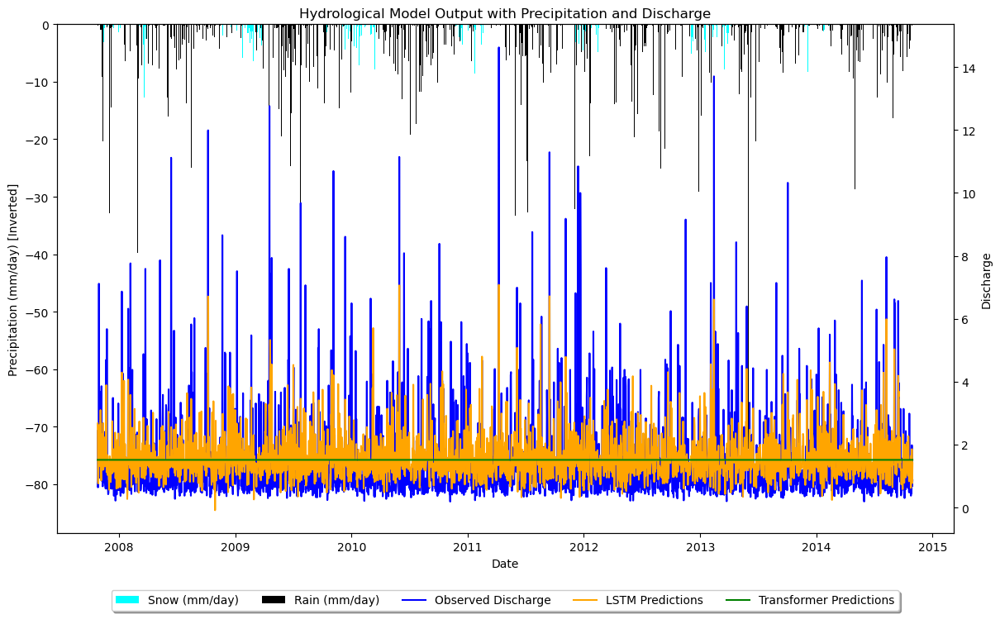


Training Basin 48: 316_Cerna_Desna

316_Cerna_Desna - Basic Statistical Analysis:
Mean Temperature: 5.25481076863051
Mean Precipitation: 3.711517752633633
Mean Discharge: 3.333658562567971
Temperature Standard Deviation: 7.970379263235973
Precipitation Standard Deviation: 7.318570553577057
Discharge Standard Deviation: 5.763748681154177
Discharge Quantiles: 0.25    1.150
0.50    1.728
0.75    2.916
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
316_Cerna_Desna - LSTM Train NSE: 0.195
316_Cerna_Desna - Transformer Train NSE: -0.139
316_Cerna_Desna - LSTM Test NSE: 0.225
316_Cerna_Desna - Transformer Test NSE: -0.161
Total days with temperatures below zero (potential snow days): 2943


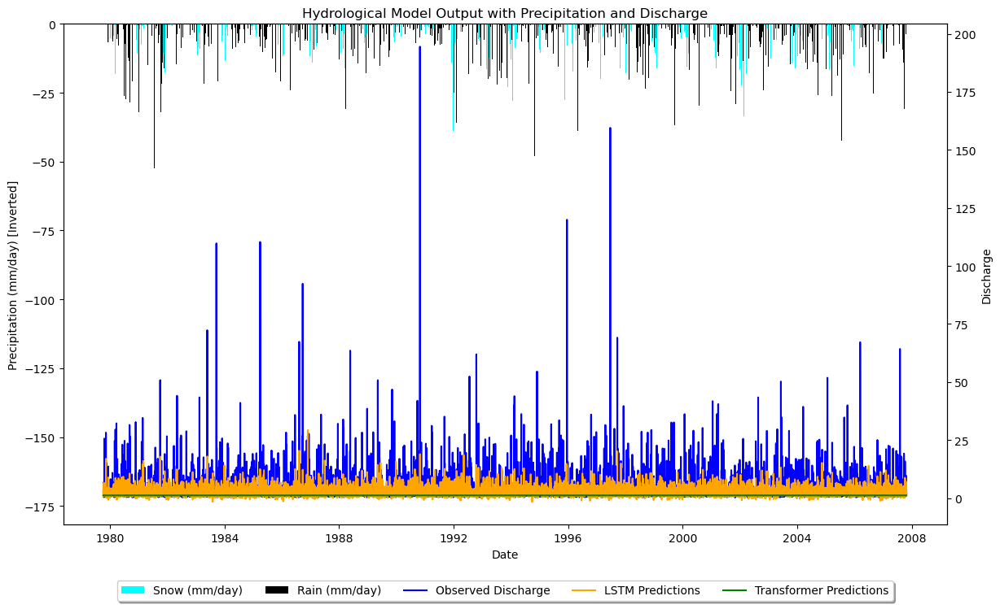

Total days with temperatures below zero (potential snow days): 671


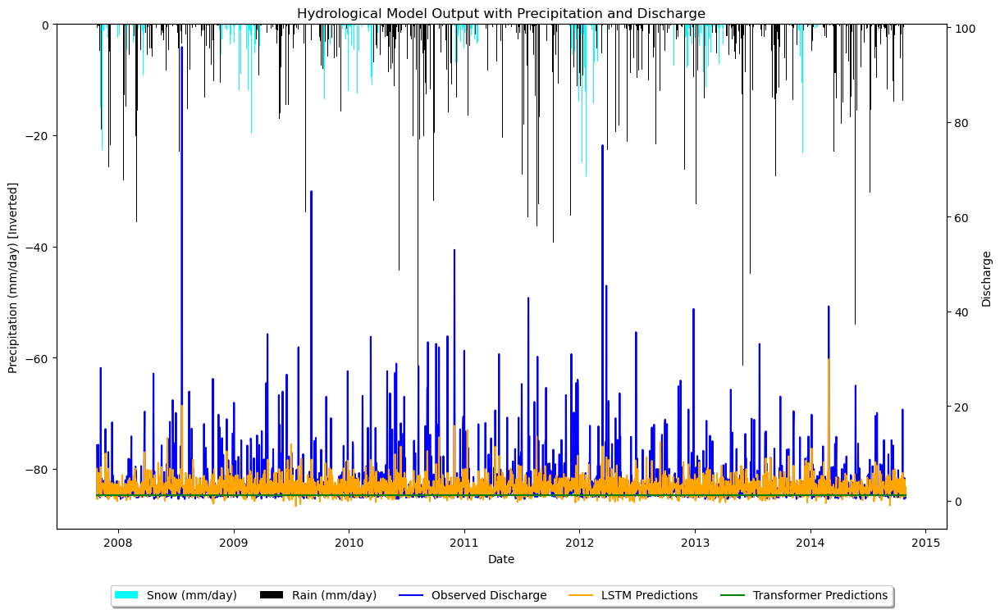


Training Basin 49: 115_Sausswasser

115_Sausswasser - Basic Statistical Analysis:
Mean Temperature: 5.742558469170802
Mean Precipitation: 2.358600789713476
Mean Discharge: 2.148557889916963
Temperature Standard Deviation: 7.653470940038166
Precipitation Standard Deviation: 5.264971150279375
Discharge Standard Deviation: 2.194709308217053
Discharge Quantiles: 0.25    1.040
0.50    1.560
0.75    2.369
Name: Q, dtype: float64

494/494 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step
494/494 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
124/124 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
115_Sausswasser - LSTM Train NSE: 0.158
115_Sausswasser - Transformer Train NSE: -0.023
115_Sausswasser - LSTM Test NSE: 0.160
115_Sausswasser - Transformer Test NSE: -0.023
Total days with temperatures below zero (potential snow days): 3894


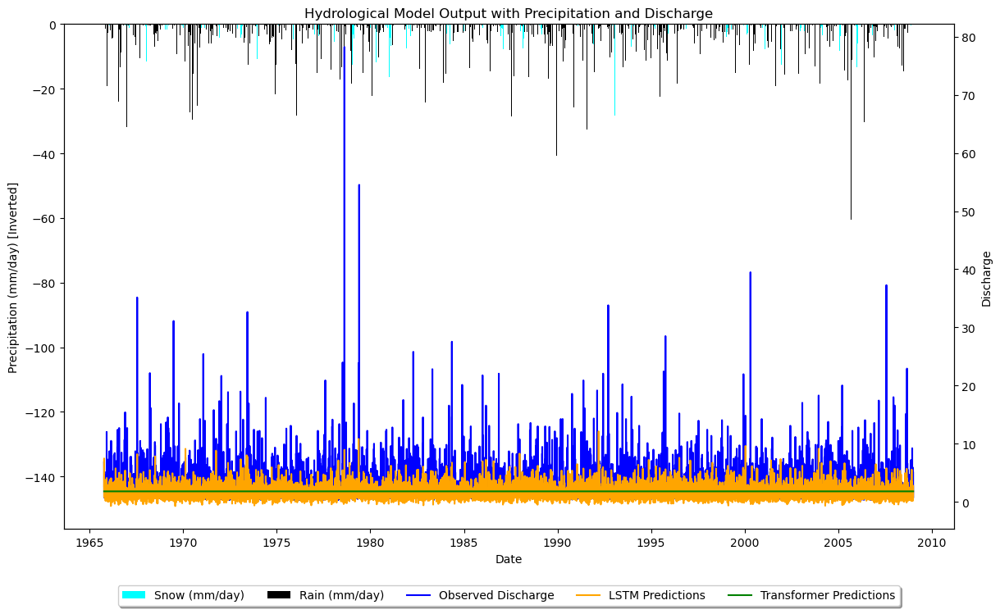

Total days with temperatures below zero (potential snow days): 848


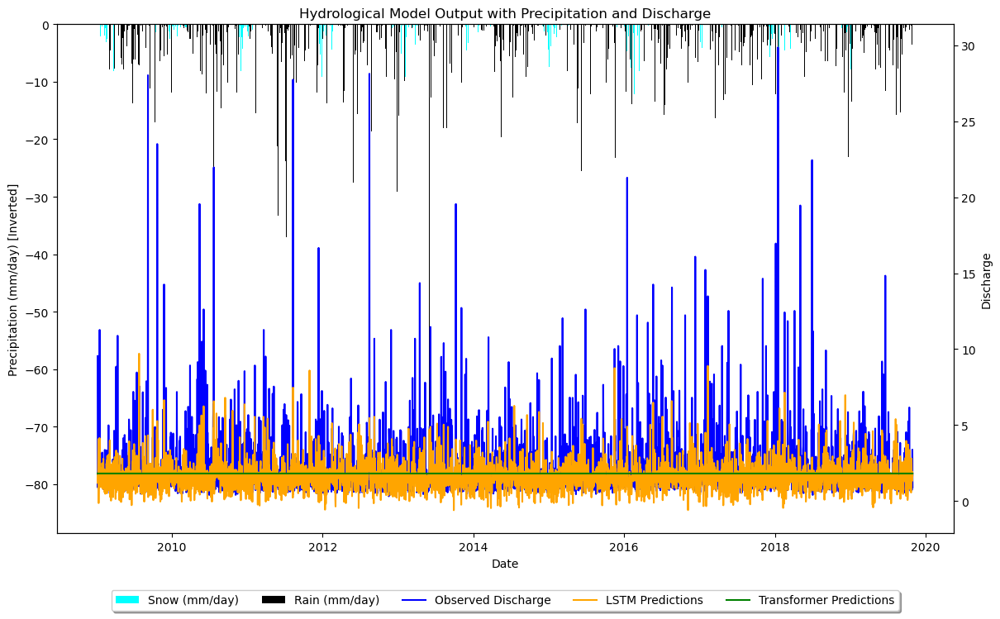


Training Basin 50: 307_Mumlava

307_Mumlava - Basic Statistical Analysis:
Mean Temperature: 5.904502536090519
Mean Precipitation: 3.595333593445181
Mean Discharge: 3.3898934841982054
Temperature Standard Deviation: 7.807997415874178
Precipitation Standard Deviation: 6.999927651016609
Discharge Standard Deviation: 3.952820277381592
Discharge Quantiles: 0.25    1.339
0.50    2.021
0.75    3.672
Name: Q, dtype: float64

321/321 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
321/321 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
307_Mumlava - LSTM Train NSE: 0.176
307_Mumlava - Transformer Train NSE: -0.034
307_Mumlava - LSTM Test NSE: 0.209
307_Mumlava - Transformer Test NSE: -0.027
Total days with temperatures below zero (potential snow days): 2556


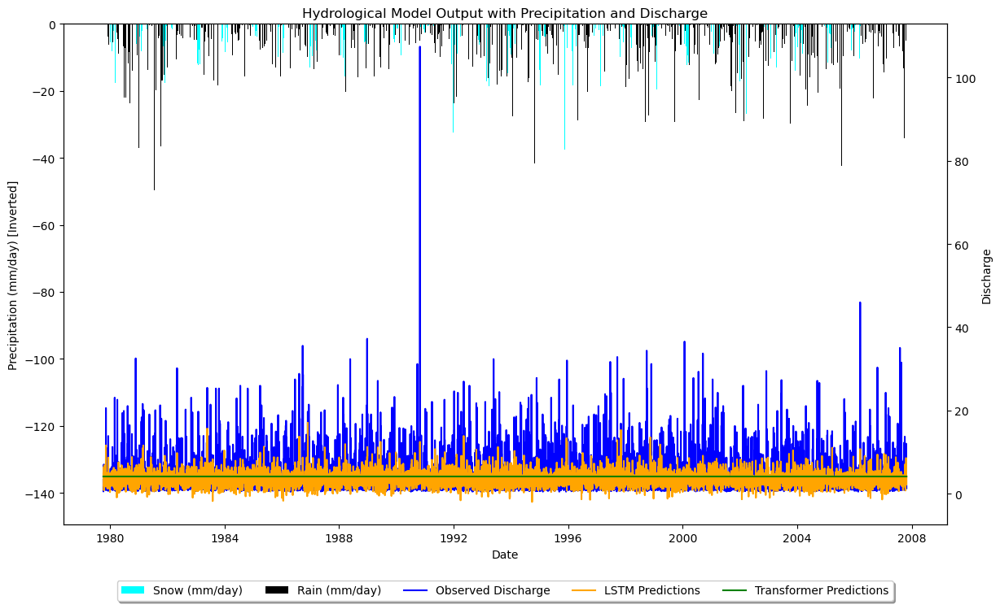

Total days with temperatures below zero (potential snow days): 563


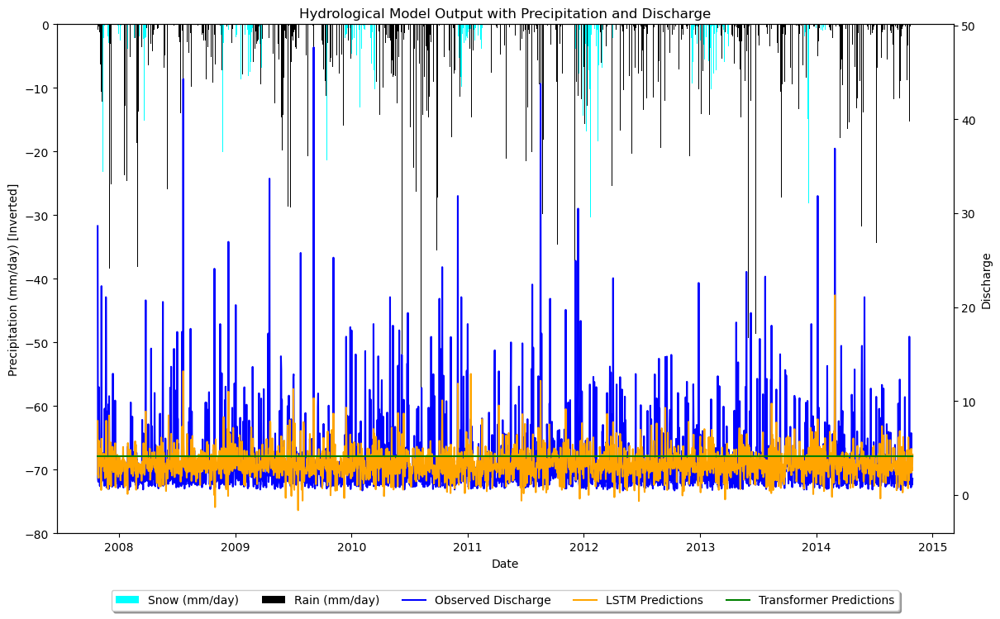

In [42]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, MultiHeadAttention, LayerNormalization, Dropout, GlobalAveragePooling1D
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import torch
from tqdm.auto import tqdm
import warnings

# Ignoring warnings
warnings.filterwarnings('ignore')

# Setting the device for PyTorch
DEVICE = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f'Using device: {DEVICE}')

# Loading and concatenating CSV files into a DataFrame
data_dir = '/Users/doudou.ba/Downloads/dbstream'
csv_files = [os.path.join(data_dir, file) for file in os.listdir(data_dir) if file.endswith('.csv')]
basin_dataframes = [pd.read_csv(file_path, parse_dates=['Date'], index_col='Date') for file in csv_files]
data = pd.concat(basin_dataframes, axis=0)

# Replace negative values with NaN
data.loc[data['P'] < 0, 'P'] = np.nan
data.loc[data['Q'] < 0, 'Q'] = np.nan

# Fill NaN values with the mean
data['P'] = data['P'].fillna(data['P'].mean())
data['Q'] = data['Q'].fillna(data['Q'].mean())

# Randomly selecting basins for analysis
basins = data['Basin'].unique()
selected_basins = random.sample(list(basins), 50)
print(f"Selected Basins: {selected_basins}")

epoch_num = 1

def plot_results(basin_data, dates, observed, lstm_pred, transformer_pred):
    fig, ax1 = plt.subplots(figsize=(14, 8))
    tmin = basin_data.loc[dates, 'T'].values
    rain = basin_data.loc[dates, 'P'].values
    snow_days = tmin < 0
    print(f"Total days with temperatures below zero (potential snow days): {np.sum(snow_days)}")
    adjusted_snow = np.where(snow_days, rain, 0)
    adjusted_rain = np.where(~snow_days, rain, 0)
    ax1.bar(dates[snow_days], -adjusted_snow[snow_days], width=1, color='cyan', label='Snow (mm/day)')
    ax1.bar(dates[~snow_days], -adjusted_rain[~snow_days], width=1, color='black', label='Rain (mm/day)')
    ax1.set_ylabel('Precipitation (mm/day) [Inverted]')
    ax1.set_xlabel('Date')
    ax1.invert_yaxis()
    ax1.set_ylim(-max(rain.max(), adjusted_snow.max()) * 1.2, 0)
    ax2 = ax1.twinx()
    ax2.plot(dates, observed, 'b-', label='Observed Discharge')
    ax2.plot(dates, lstm_pred, 'orange', label='LSTM Predictions')
    ax2.plot(dates, transformer_pred, 'green', label='Transformer Predictions')
    ax2.set_ylabel('Discharge')
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=5)
    plt.xticks(rotation=45)
    plt.title('Hydrological Model Output with Precipitation and Discharge')
    plt.show()

# Training and evaluating for each selected basin
for i, selected_basin in enumerate(selected_basins, start=1):
    print(f"\nTraining Basin {i}: {selected_basin}")
    basin_data = data[data['Basin'] == selected_basin].copy()
    print(f"\n{selected_basin} - Basic Statistical Analysis:")
    print(f"Mean Temperature: {basin_data['T'].mean()}")
    print(f"Mean Precipitation: {basin_data['P'].mean()}")
    print(f"Mean Discharge: {basin_data['Q'].mean()}")
    print(f"Temperature Standard Deviation: {basin_data['T'].std()}")
    print(f"Precipitation Standard Deviation: {basin_data['P'].std()}")
    print(f"Discharge Standard Deviation: {basin_data['Q'].std()}")
    print(f"Discharge Quantiles: {basin_data['Q'].quantile([0.25, 0.5, 0.75])}\n")

    scaler = MinMaxScaler()
    basin_data_scaled = scaler.fit_transform(basin_data[['P', 'T', 'Q']])
    basin_data_scaled = pd.DataFrame(basin_data_scaled, columns=['P', 'T', 'Q'], index=basin_data.index)
    seq_length = 7
    X, y = [], []
    for i in range(seq_length, len(basin_data_scaled)):
        X.append(basin_data_scaled.iloc[i - seq_length:i][['P', 'T']].values)
        y.append(basin_data_scaled.iloc[i]['Q'])
    X, y = np.array(X), np.array(y)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    lstm_model = Sequential([LSTM(64, activation='relu', input_shape=(seq_length, 2)), Dense(1)])
    lstm_model.compile(optimizer='adam', loss='mse')
    lstm_model.fit(X_train, y_train, epochs=epoch_num, batch_size=32, verbose=0)

    input_layer = Input(shape=(seq_length, 2))
    x = LayerNormalization(epsilon=1e-6)(input_layer)
    x = MultiHeadAttention(num_heads=2, key_dim=seq_length)(x, x, x)
    x = Dropout(0.1)(x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.1)(x)
    output_layer = Dense(1)(x)
    transformer_model = Model(inputs=input_layer, outputs=output_layer)
    transformer_model.compile(optimizer='adam', loss='mse')
    transformer_model.fit(X_train, y_train, epochs=epoch_num, batch_size=32, verbose=0)

    # Inverse transforming predictions and actual values for plotting
    y_train_inv = scaler.inverse_transform(np.hstack([X_train[:, -1, :], y_train.reshape(-1, 1)]))[:, -1]
    y_test_inv = scaler.inverse_transform(np.hstack([X_test[:, -1, :], y_test.reshape(-1, 1)]))[:, -1]
    lstm_preds_train_inv = scaler.inverse_transform(np.hstack([X_train[:, -1, :], lstm_model.predict(X_train).reshape(-1, 1)]))[:, -1]
    transformer_preds_train_inv = scaler.inverse_transform(np.hstack([X_train[:, -1, :], transformer_model.predict(X_train).reshape(-1, 1)]))[:, -1]
    lstm_preds_test_inv = scaler.inverse_transform(np.hstack([X_test[:, -1, :], lstm_model.predict(X_test).reshape(-1, 1)]))[:, -1]
    transformer_preds_test_inv = scaler.inverse_transform(np.hstack([X_test[:, -1, :], transformer_model.predict(X_test).reshape(-1, 1)]))[:, -1]

    # NSE calculations
    lstm_nse_train = 1 - np.sum((y_train_inv - lstm_preds_train_inv) ** 2) / np.sum((y_train_inv - np.mean(y_train_inv)) ** 2)
    transformer_nse_train = 1 - np.sum((y_train_inv - transformer_preds_train_inv) ** 2) / np.sum((y_train_inv - np.mean(y_train_inv)) ** 2)
    lstm_nse_test = 1 - np.sum((y_test_inv - lstm_preds_test_inv) ** 2) / np.sum((y_test_inv - np.mean(y_test_inv)) ** 2)
    transformer_nse_test = 1 - np.sum((y_test_inv - transformer_preds_test_inv) ** 2) / np.sum((y_test_inv - np.mean(y_test_inv)) ** 2)
    
    print(f"{selected_basin} - LSTM Train NSE: {lstm_nse_train:.3f}")
    print(f"{selected_basin} - Transformer Train NSE: {transformer_nse_train:.3f}")
    print(f"{selected_basin} - LSTM Test NSE: {lstm_nse_test:.3f}")
    print(f"{selected_basin} - Transformer Test NSE: {transformer_nse_test:.3f}")

    # Plotting results
    train_dates = pd.date_range(start=basin_data.index[seq_length], periods=len(X_train), freq='D')
    test_dates = pd.date_range(start=basin_data.index[len(X_train) + seq_length - 1], periods=len(X_test), freq='D')
    plot_results(basin_data, train_dates, y_train_inv, lstm_preds_train_inv, transformer_preds_train_inv)
    plot_results(basin_data, test_dates, y_test_inv, lstm_preds_test_inv, transformer_preds_test_inv)
